In [933]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()

In [1080]:
conn = sqlite3.connect('web-performance.db')
#conn = sqlite3.connect('web-performance-wikipedia-still-weird.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements

,msm_id,timestamp,experiment_type,error,website
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,2022-06-17_16_22_09,dsl,,www.example.org
1,19658249-cecb-4294-b691-a3f261950170,2022-06-17_16_22_40,cable,,www.example.org
2,e814707b-5c1e-425c-b47e-2ab3de1b0248,2022-06-17_16_23_10,fiber,,www.example.org
3,83eb699e-3226-4041-a05f-f9829b706a61,2022-06-17_16_23_45,4g,,www.example.org
4,16d0e867-68b5-4de9-8dfc-fc29d57be10c,2022-06-17_16_24_21,4g-medium,,www.example.org
...,...,...,...,...,...
9870,2ccff15b-5382-450a-a935-1d8bb1d9ea7b,2022-06-21_12_20_47,dsl,,www.example.org
9871,87f30cf2-e4f7-40d3-b036-bbea3904e415,2022-06-21_12_21_18,cable,,www.example.org
9872,c048004d-e5bf-41f9-aa69-aa8ecbd9c8c2,2022-06-21_12_21_48,fiber,,www.example.org
9873,26b143ce-2194-452c-ad58-b4945937bbb9,2022-06-21_12_22_19,4g,,www.example.org


In [1081]:
measurements.error.value_counts()

    9875
Name: error, dtype: int64

In [1082]:
df_web_perf = pd.read_sql_query("SELECT * FROM web_performance_metrics", conn)
df_dns_perf = pd.read_sql_query("SELECT * FROM dns_metrics", conn)
df_lookups = pd.read_sql_query("SELECT * FROM lookups", conn)
conn.close()

In [1083]:
df_web_perf = pd.merge(df_web_perf, measurements, on='msm_id')

In [1084]:
df_web_perf.groupby(['website','experiment_type', 'is_warmup']).agg(plt=('loadEventStart', 'median'),fcp=('firstContentfulPaint', 'median'))

plt     fcp
website           experiment_type is_warmup                 
www.example.org   4g              0           264.40  270.50
                                  1           277.60  283.80
                  4g-medium       0           292.70  298.80
                                  1           306.10  312.20
                  cable           0           131.30  137.20
                                  1           144.00  150.00
                  dsl             0           182.60  188.70
                                  1           207.90  213.90
                  fiber           0            95.20  116.50
                                  1           106.80  127.30
www.instagram.com 4g              0          1206.15  274.50
                                  1          1233.15  290.10
                  4g-medium       0          1405.65  302.85
                                  1          1430.70  318.40
                  cable           0           667.20  141.45
                                  1           684.10  157.50
                  dsl             0          1718.05  192.55
                                  1          1746.65  220.10
                  fiber           0           617.30  111.90
                                  1           635.40  133.25
www.wikipedia.org 4g              0           768.30  759.80
                                  1           784.60  776.80
                  4g-medium       0           795.70  788.70
                                  1           812.35  804.45
                  cable           0           623.85  293.00
                                  1           638.05  307.55
                  dsl             0           673.70  346.05
                                  1           700.85  374.15
                  fiber           0           588.00  586.90
                                  1           613.80  284.75

In [1085]:
df_dns_perf_metrics = df_dns_perf.copy()

In [1086]:
df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].replace({'metrics:DoUDP UDP setup duration from': 'metrics:DoUDP UDP setup duration from '}, regex=True)

df_dns_perf_metrics['metric_type'] = "none"
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("setup duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("exchange duration"), "exchange", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("query duration"), "query", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("handshake duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("DoH query"), "lazy-init-handshake-and-query", df_dns_perf_metrics['metric_type'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics.metric.str.split(' ').str[-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-2]

df_dns_perf_metrics['base'] = 1000
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'm', 1, df_dns_perf_metrics['base'])
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics['base'])

df_dns_perf_metrics['duration'] = np.where((df_dns_perf_metrics.duration.str[-1] != 'm') & (df_dns_perf_metrics.duration.str[-1] != 'µ'), df_dns_perf_metrics['duration']+'s', df_dns_perf_metrics['duration'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].astype(float) * df_dns_perf_metrics['base']

df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].str[8:]

df_dns_perf_metrics['metric_start'] = df_dns_perf_metrics['metric'].str.extract(r'\sfrom\s(.*?)\sto\s')

df_dns_perf_metrics['metric_end'] = df_dns_perf_metrics['metric'].str.extract(r'\sto\s(.*?)\:\s')

df_dns_perf_metrics['protocol'] = df_dns_perf_metrics.metric.str.split(' ').str[0]

df_dns_perf_metrics['domain'] = df_dns_perf_metrics['metric'].str.extract(r'\sfor\s\[\;(.*?)\]\s')

df_dns_perf_metrics.metric_start = "2022 "+df_dns_perf_metrics.metric_start
df_dns_perf_metrics.metric_end = "2022 "+df_dns_perf_metrics.metric_end

df_dns_perf_metrics.metric_start = pd.to_datetime(df_dns_perf_metrics.metric_start, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.metric_end = pd.to_datetime(df_dns_perf_metrics.metric_end, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.domain = df_dns_perf_metrics.domain.str[:-7]

In [1087]:
df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'].groupby(['transport_protocol', 'is_warmup']).agg(lookup_dur=('duration','median'))

,,lookup_dur
transport_protocol,is_warmup,
DoH,0,148.578659
DoQ,0,124.379355
DoUDP,0,44.128310


In [1088]:
df_exchange_times = df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'].copy()
df_exchange_times['elapsed'] = df_exchange_times['duration']

In [1089]:
df_dns_and_h3 = pd.merge(df_web_perf, df_exchange_times[['msm_id', 'elapsed', 'transport_protocol']], on='msm_id')


In [1090]:
df_dns_and_h3['full_plt'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['loadEventStart']
df_dns_and_h3['full_fp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstPaint']
df_dns_and_h3['full_fcp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstContentfulPaint']

In [1091]:
df_dns_and_h3['h3_description'] = 'H3 1-RTT'
df_dns_and_h3['h3_description'] = np.where(df_dns_and_h3['is_warmup'] == 0, 'H3 0-RTT', df_dns_and_h3['h3_description'])

In [1092]:
df_dns_and_h3.h3_description.value_counts() #thrice the actual value because of join

H3 1-RTT    29625
H3 0-RTT    29625
Name: h3_description, dtype: int64

In [1093]:
df_dns_and_h3.transport_protocol.value_counts() #twice the actual value because of join

DoQ      19750
DoH      19750
DoUDP    19750
Name: transport_protocol, dtype: int64

In [1094]:
df_dns_and_h3.website.value_counts()

www.example.org      19770
www.wikipedia.org    19740
www.instagram.com    19740
Name: website, dtype: int64

In [1095]:
df_dns_and_h3.experiment_type.value_counts()

dsl          11850
cable        11850
fiber        11850
4g           11850
4g-medium    11850
Name: experiment_type, dtype: int64

In [1096]:
df_dns_and_h3['experiment_description'] = df_dns_and_h3.transport_protocol + ' + ' + df_dns_and_h3.h3_description

In [1097]:
df_dns_and_h3['experiment_description'].value_counts()

DoQ + H3 1-RTT      9875
DoH + H3 1-RTT      9875
DoUDP + H3 1-RTT    9875
DoQ + H3 0-RTT      9875
DoH + H3 0-RTT      9875
DoUDP + H3 0-RTT    9875
Name: experiment_description, dtype: int64

count    9875.000000
mean      815.644191
std       488.804371
min       139.073491
10%       206.982197
20%       342.306563
25%       476.093914
30%       531.565324
40%       665.378535
50%       701.564833
60%       769.053769
70%       977.152047
75%      1022.768173
80%      1074.638203
90%      1656.156129
100%     1903.311126
max      1903.311126
Name: full_plt, dtype: float64
count    9875.000000
mean      796.135836
std       485.372015
min       126.863357
10%       194.387548
20%       316.075760
25%       462.687202
30%       518.117646
40%       644.569846
50%       686.397183
60%       749.091454
70%       960.576957
75%      1005.896604
80%      1059.779702
90%      1631.308376
100%     1900.527336
max      1900.527336
Name: full_plt, dtype: float64
count    9875.000000
mean      866.343251
std       503.383699
min       152.361883
10%       230.452927
20%       366.542141
25%       566.797097
30%       631.583336
40%       680.331291
50%       723.789269
60%       792.

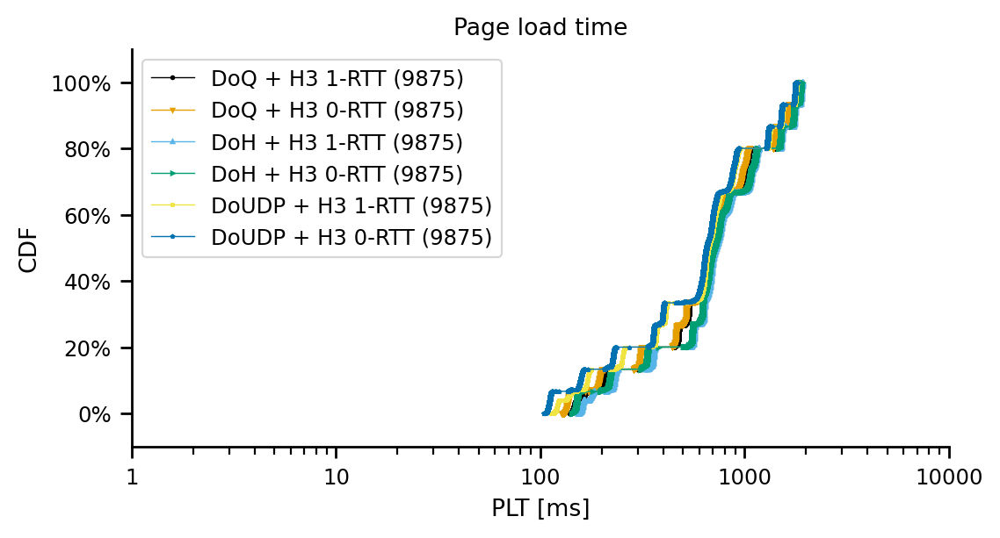

In [1098]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.experiment_description == experiment)]
        if len(df_tmp['full_plt']) == 0:
            continue
        print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['full_plt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Page load time')

ax.set_xlabel('PLT [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    3295.000000
mean      338.437453
std       146.403173
min       139.073491
10%       148.253785
20%       181.690917
25%       204.231949
30%       206.996597
40%       265.690884
50%       332.441399
60%       386.794093
70%       473.648837
75%       476.142811
80%       493.896951
90%       531.667922
100%      572.315298
max       572.315298
Name: full_plt, dtype: float64
count    3295.000000
mean      322.273660
std       147.312434
min       126.863357
10%       136.172422
20%       171.540785
25%       191.833211
30%       194.394334
40%       254.364673
50%       307.075289
60%       387.698726
70%       460.673100
75%       462.697578
80%       475.101368
90%       518.337631
100%      525.653609
max       525.653609
Name: full_plt, dtype: float64
count    3295.000000
mean      389.126312
std       181.934158
min       152.361883
10%       161.705496
20%       203.105679
25%       227.767836
30%       230.464613
40%       290.588907
50%       356.503080
60%       436.

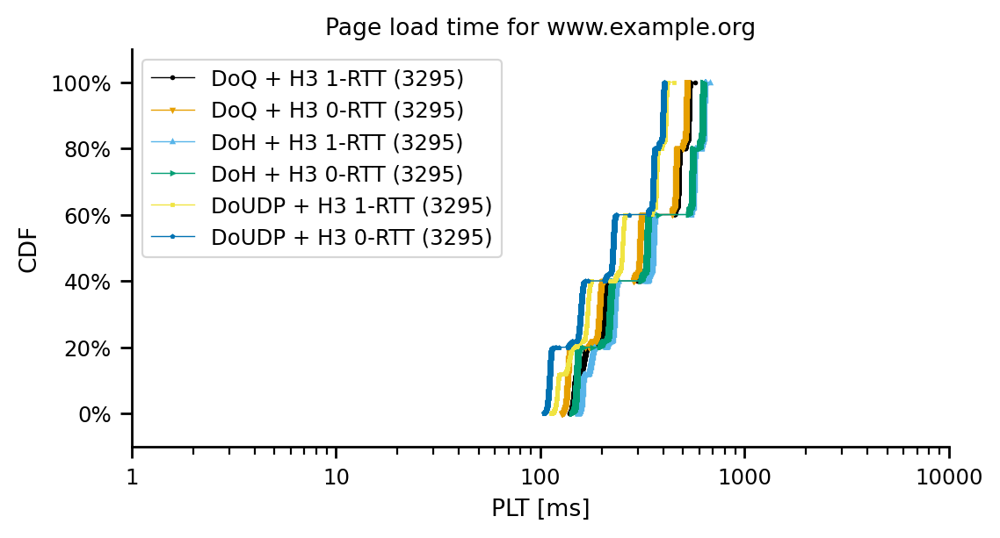

count    3290.000000
mean      832.942879
std       152.696670
min       495.374464
10%       651.739858
20%       670.992203
25%       684.224337
30%       700.395990
40%       730.920435
50%       825.237271
60%       858.158651
70%       977.202601
75%       987.218052
80%       996.976860
90%      1038.058232
100%     1074.719330
max      1074.719330
Name: full_plt, dtype: float64
count    3290.000000
mean      813.722757
std       154.589611
min       481.544257
10%       626.429028
20%       648.735386
25%       669.540284
30%       686.216739
40%       718.682391
50%       797.950943
60%       835.610708
70%       960.608384
75%       971.431958
80%       983.034595
90%      1021.454155
100%     1060.502824
max      1060.502824
Name: full_plt, dtype: float64
count    3290.000000
mean      883.654469
std       187.916992
min       510.548040
10%       665.823804
20%       687.818133
25%       705.001256
30%       723.636448
40%       754.163236
50%       849.152583
60%       897.

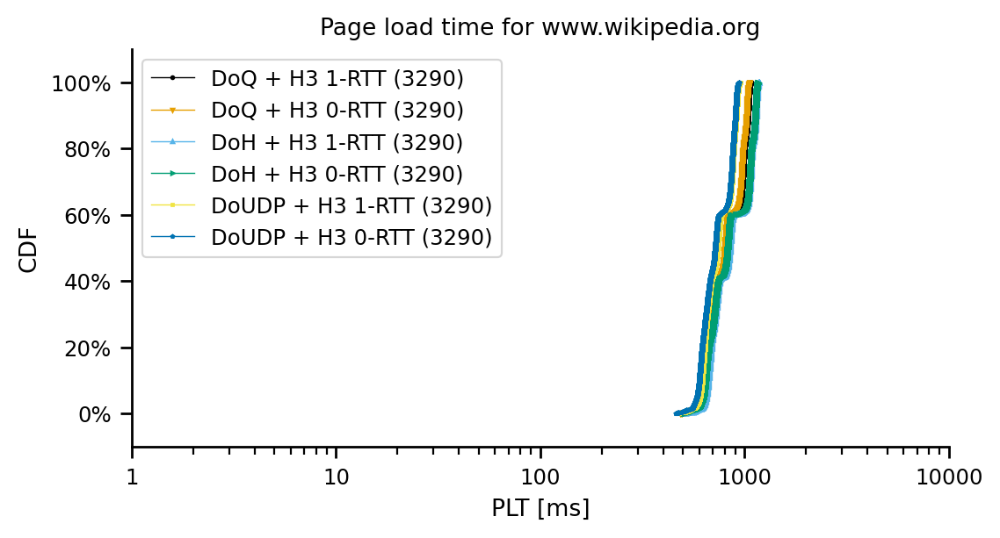

count    3290.000000
mean     1276.277478
std       481.483470
min       641.560480
10%       676.128076
20%       719.815442
25%       739.973422
30%       747.214788
40%      1167.668117
50%      1428.829969
60%      1543.919451
70%      1656.158854
75%      1663.735144
80%      1719.056734
90%      1871.099644
100%     1903.311126
max      1903.311126
Name: full_plt, dtype: float64
count    3290.000000
mean     1253.131247
std       476.922213
min       628.148656
10%       658.145764
20%       707.116229
25%       723.276938
30%       730.399920
40%      1148.389163
50%      1402.188985
60%      1520.324082
70%      1631.374964
75%      1639.038871
80%      1721.527373
90%      1842.509651
100%     1900.527336
max      1900.527336
Name: full_plt, dtype: float64
count    3290.000000
mean     1326.974224
std       501.562521
min       655.805828
10%       690.059831
20%       743.496380
25%       763.213023
30%       770.515321
40%      1231.857056
50%      1519.832826
60%      1639.

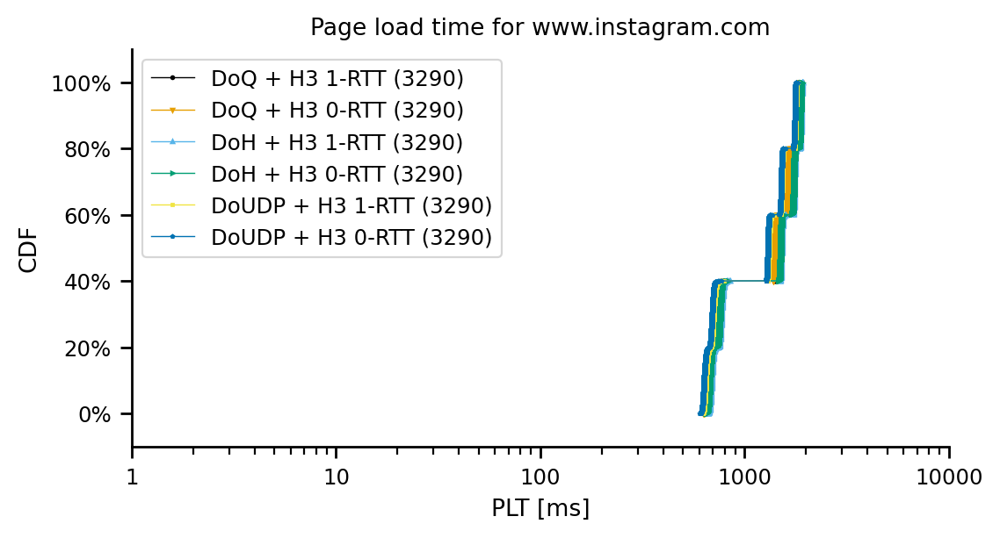

In [1099]:
df_plt = df_dns_and_h3
for website in df_plt['website'].unique():
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=True
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
            if len(df_tmp['full_plt']) == 0:
                continue
            print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['full_plt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Page load time for '+website)

    ax.set_xlabel('PLT [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,10000)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

dsl
count    659.000000
mean     330.668768
std        6.912209
min      298.939211
10%      317.871049
20%      327.804340
25%      329.233012
30%      330.248170
40%      331.402215
50%      332.441399
60%      333.584103
70%      334.437974
75%      334.802901
80%      335.773794
90%      337.112488
100%     343.387349
max      343.387349
Name: full_plt, dtype: float64
count    659.000000
mean     305.930528
std        6.295953
min      285.867798
10%      294.998101
20%      303.883865
25%      304.814328
30%      305.446680
40%      306.220605
50%      307.075289
60%      307.973053
70%      308.975872
75%      309.471542
80%      309.946170
90%      311.325927
100%     352.742222
max      352.742222
Name: full_plt, dtype: float64
count    659.000000
mean     354.779719
std        6.817689
min      323.931666
10%      342.779273
20%      352.175748
25%      353.187090
30%      354.298005
40%      355.578712
50%      356.503080
60%      357.489245
70%      358.394253
75%      358.9

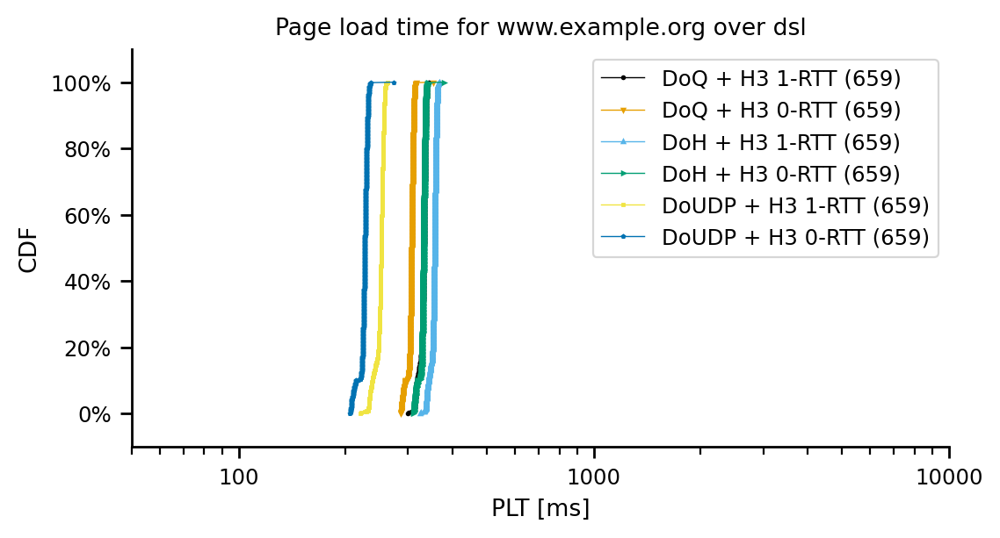

count    658.000000
mean     818.040841
std       30.578003
min      665.359022
10%      787.344020
20%      803.074730
25%      808.557334
30%      812.768623
40%      818.724324
50%      825.436721
60%      830.004251
70%      834.792226
75%      837.239363
80%      839.302546
90%      845.078420
100%     867.417532
max      867.417532
Name: full_plt, dtype: float64
count    658.000000
mean     792.685218
std       28.724470
min      648.611669
10%      763.615986
20%      779.020544
25%      784.441752
30%      787.621824
40%      792.827461
50%      797.950943
60%      803.375611
70%      807.954142
75%      810.220182
80%      812.604656
90%      818.192314
100%     843.199695
max      843.199695
Name: full_plt, dtype: float64
count    658.000000
mean     842.081657
std       30.630515
min      688.617864
10%      811.368871
20%      826.544554
25%      832.546403
30%      836.654930
40%      843.183796
50%      849.152583
60%      853.998212
70%      859.032929
75%      861.35912

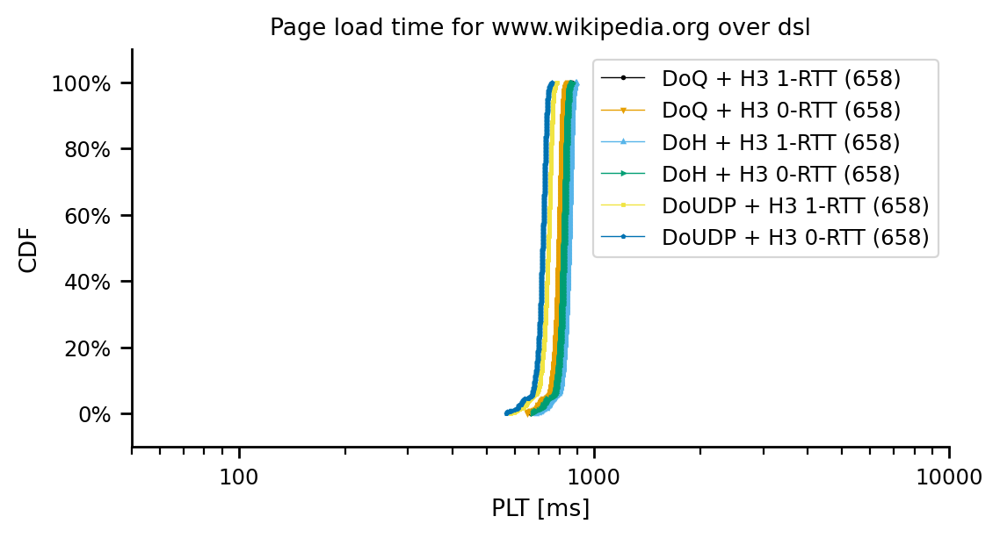

count     658.000000
mean     1870.035683
std        11.470891
min      1834.300469
10%      1853.849171
20%      1859.916842
25%      1862.125426
30%      1864.853205
40%      1868.655503
50%      1871.100410
60%      1873.837295
70%      1876.500327
75%      1878.188738
80%      1880.053911
90%      1883.504719
100%     1903.311126
max      1903.311126
Name: full_plt, dtype: float64
count     658.000000
mean     1841.225501
std        11.185352
min      1806.032769
10%      1825.627174
20%      1831.814812
25%      1833.859076
30%      1835.933892
40%      1839.918849
50%      1842.525009
60%      1844.391724
70%      1847.261650
75%      1848.768512
80%      1851.114781
90%      1854.698721
100%     1900.527336
max      1900.527336
Name: full_plt, dtype: float64
count     658.000000
mean     1894.115969
std        11.468689
min      1857.453582
10%      1878.062924
20%      1883.988339
25%      1886.444438
30%      1888.799742
40%      1892.679613
50%      1895.343430
60%      1897.

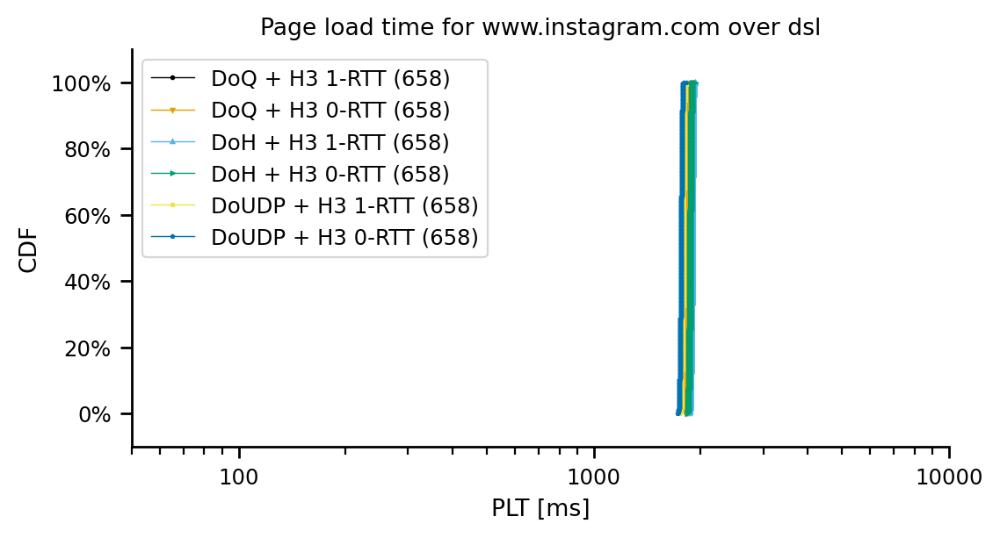

cable
count    659.000000
mean     205.644480
std        5.947045
min      184.366854
10%      199.422982
20%      203.551071
25%      204.231949
30%      205.015700
40%      206.038174
50%      206.992883
60%      207.780577
70%      208.507682
75%      209.048025
80%      209.785381
90%      211.223615
100%     215.818394
max      215.818394
Name: full_plt, dtype: float64
count    659.000000
mean     193.141445
std        5.999187
min      172.912592
10%      188.102922
20%      190.969014
25%      191.833211
30%      192.387004
40%      193.398940
50%      194.394090
60%      195.259915
70%      196.103065
75%      196.554645
80%      197.134358
90%      198.536905
100%     207.109985
max      207.109985
Name: full_plt, dtype: float64
count    659.000000
mean     229.135490
std        5.984034
min      207.774189
10%      223.021859
20%      226.855116
25%      227.767836
30%      228.398360
40%      229.437731
50%      230.464073
60%      231.241638
70%      231.984516
75%      232

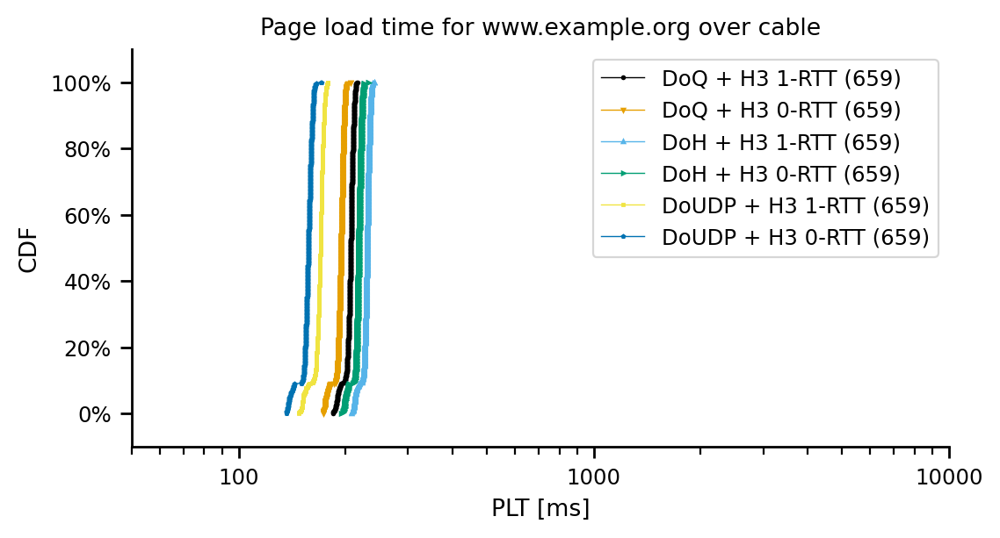

count    658.000000
mean     693.746206
std       33.844740
min      539.329778
10%      659.410346
20%      675.691482
25%      680.943050
30%      687.597129
40%      694.189374
50%      701.038319
60%      707.488741
70%      713.258814
75%      716.071286
80%      719.338026
90%      724.779055
100%     745.459476
max      745.459476
Name: full_plt, dtype: float64
count    658.000000
mean     681.806084
std       28.713461
min      533.506339
10%      648.172180
20%      665.675256
25%      670.607076
30%      674.044948
40%      679.430041
50%      686.774091
60%      692.145464
70%      697.370147
75%      701.044641
80%      704.132483
90%      711.158715
100%     731.123445
max      731.123445
Name: full_plt, dtype: float64
count    658.000000
mean     717.221755
std       33.737940
min      566.750848
10%      683.710605
20%      699.088409
25%      704.965297
30%      711.188243
40%      718.307010
50%      724.441270
60%      730.239511
70%      736.953259
75%      739.21425

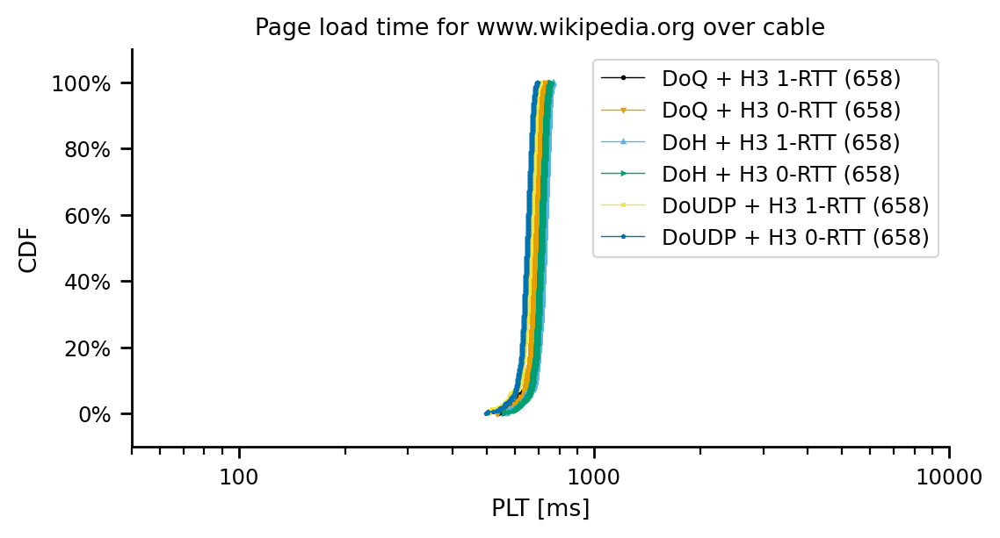

count    658.000000
mean     748.682277
std       13.123750
min      715.329081
10%      733.761587
20%      737.811579
25%      739.849359
30%      741.258500
40%      744.502905
50%      747.104721
60%      750.140005
70%      753.683285
75%      756.232151
80%      759.155414
90%      765.342009
100%     829.327473
max      829.327473
Name: full_plt, dtype: float64
count    658.000000
mean     731.142459
std       11.458733
min      706.839154
10%      718.301851
20%      721.780955
25%      723.276938
30%      724.651219
40%      727.825938
50%      730.399715
60%      732.862402
70%      735.621569
75%      737.271509
80%      739.477867
90%      744.462945
100%     808.114805
max      808.114805
Name: full_plt, dtype: float64
count    658.000000
mean     772.170126
std       13.131040
min      738.725209
10%      757.202861
20%      761.384208
25%      763.189646
30%      764.800901
40%      767.999643
50%      770.485502
60%      773.537623
70%      777.339327
75%      779.77050

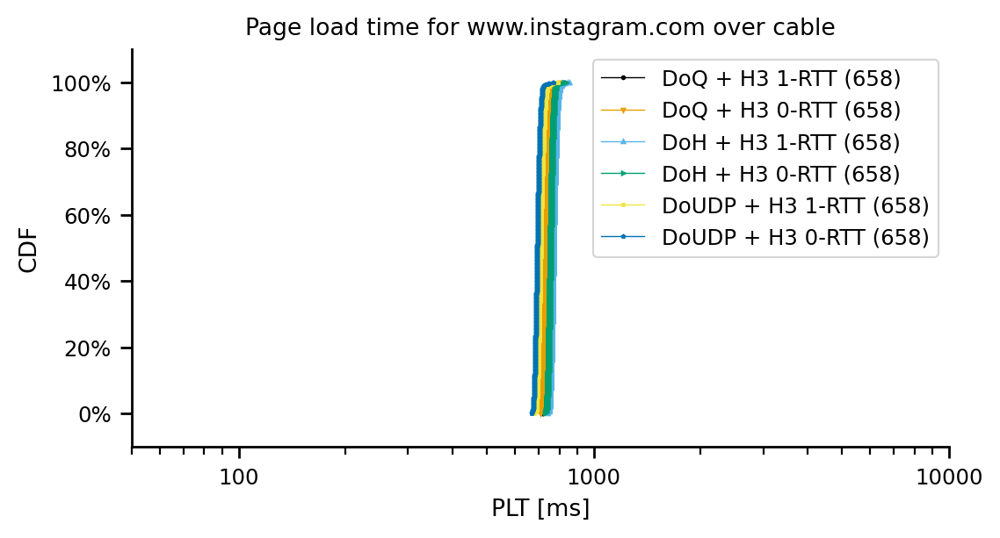

fiber
count    659.000000
mean     152.998919
std        9.089873
min      139.073491
10%      143.318237
20%      145.025695
25%      145.782927
30%      146.333464
40%      147.223805
50%      148.247392
60%      156.433840
70%      161.379139
75%      162.474885
80%      163.454401
90%      165.839504
100%     170.987167
max      170.987167
Name: full_plt, dtype: float64
count    659.000000
mean     136.017432
std        2.779067
min      126.863357
10%      133.019623
20%      134.087645
25%      134.546521
30%      134.911030
40%      135.517086
50%      136.167909
60%      136.732389
70%      137.288485
75%      137.616917
80%      137.851858
90%      138.673090
100%     166.053557
max      166.053557
Name: full_plt, dtype: float64
count    659.000000
mean     166.931170
std        9.053066
min      152.361883
10%      157.724052
20%      159.333951
25%      159.833839
30%      160.221424
40%      160.865499
50%      161.704182
60%      171.272091
70%      175.201050
75%      176

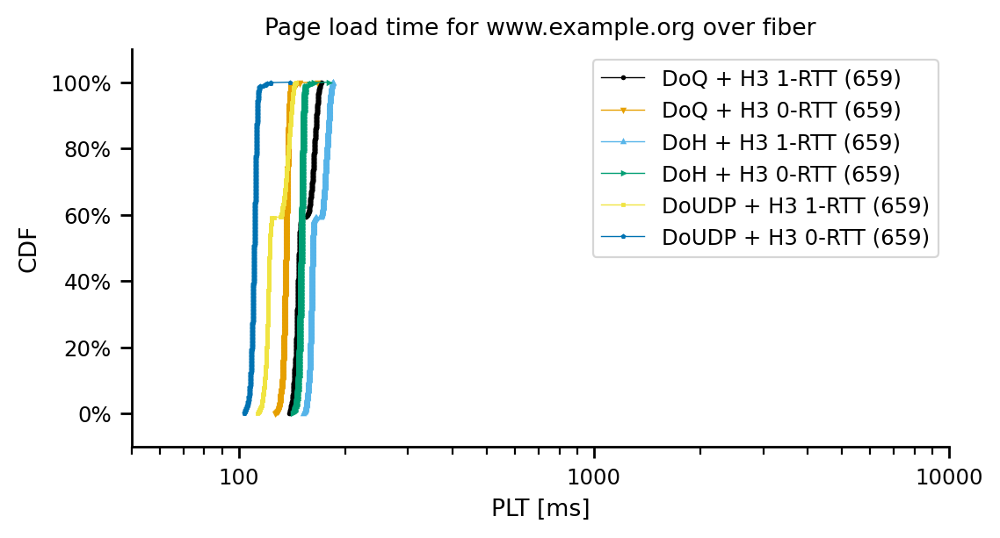

count    658.000000
mean     649.585243
std       29.180731
min      495.374464
10%      623.026902
20%      636.928272
25%      641.086405
30%      644.696760
40%      650.621742
50%      654.509816
60%      659.868617
70%      664.703918
75%      667.350807
80%      669.688821
90%      675.878225
100%     696.592967
max      696.592967
Name: full_plt, dtype: float64
count    658.000000
mean     622.495578
std       30.148165
min      481.544257
10%      591.310573
20%      610.254959
25%      615.242152
30%      618.499549
40%      624.312532
50%      628.923541
60%      633.033076
70%      637.773674
75%      639.692791
80%      642.518085
90%      649.174053
100%     671.600527
max      671.600527
Name: full_plt, dtype: float64
count    658.000000
mean     663.571014
std       29.179630
min      510.548040
10%      636.610184
20%      651.723221
25%      655.181256
30%      657.638895
40%      664.429578
50%      668.652801
60%      673.415763
70%      678.584274
75%      681.30274

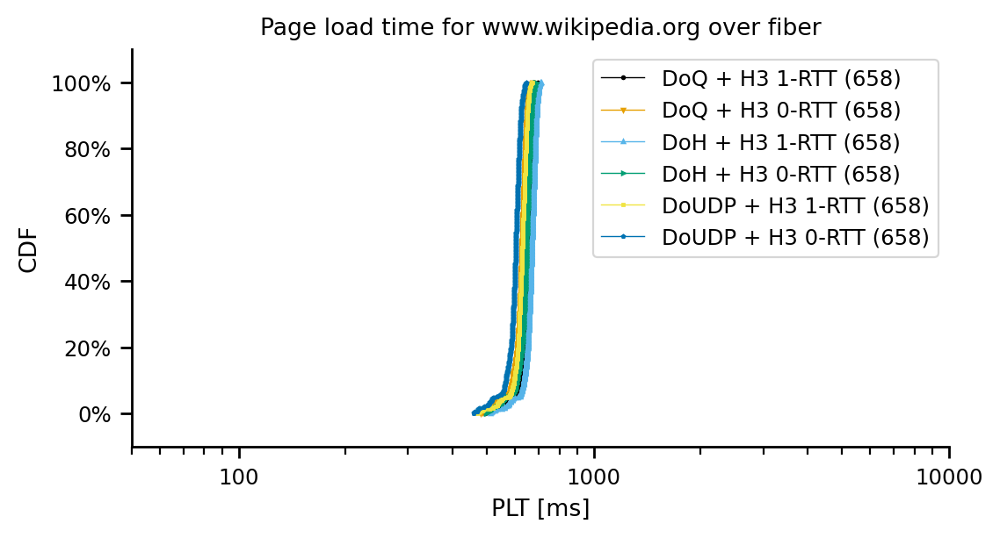

count    658.000000
mean     676.839681
std       12.354965
min      641.560480
10%      663.158489
20%      667.278681
25%      669.158891
30%      670.326484
40%      673.912188
50%      676.109166
60%      678.669423
70%      681.800095
75%      683.459321
80%      685.686480
90%      690.598827
100%     781.211163
max      781.211163
Name: full_plt, dtype: float64
count    658.000000
mean     659.326156
std       10.945836
min      628.148656
10%      646.273140
20%      650.395137
25%      652.044387
30%      653.328635
40%      655.961047
50%      658.138619
60%      660.580442
70%      664.093242
75%      666.456549
80%      668.480362
90%      673.529023
100%     708.923487
max      708.923487
Name: full_plt, dtype: float64
count    658.000000
mean     690.805159
std       12.260250
min      655.805828
10%      676.736015
20%      681.440652
25%      683.143159
30%      684.557064
40%      687.517683
50%      690.056295
60%      692.813544
70%      695.774468
75%      697.29404

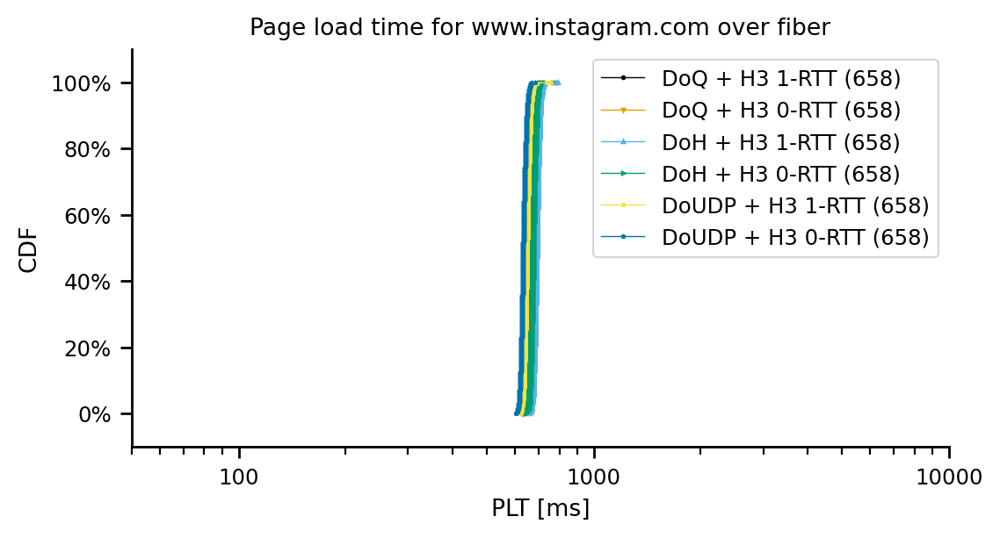

4g
count    659.000000
mean     472.509506
std        6.110942
min      451.904210
10%      461.688326
20%      470.123641
25%      470.807508
30%      471.521182
40%      472.921694
50%      473.648877
60%      474.567940
70%      475.651499
75%      476.142811
80%      476.847765
90%      478.490527
100%     489.886833
max      489.886833
Name: full_plt, dtype: float64
count    659.000000
mean     459.334240
std        5.824196
min      440.133482
10%      454.876697
20%      457.255537
25%      458.029046
30%      458.622357
40%      459.818531
50%      460.677569
60%      461.441485
70%      462.232794
75%      462.697578
80%      463.208763
90%      464.483869
100%     469.760999
max      469.760999
Name: full_plt, dtype: float64
count    659.000000
mean     563.396079
std        6.118882
min      541.777602
10%      552.820661
20%      561.145741
25%      561.910982
30%      562.477949
40%      563.755964
50%      564.503050
60%      565.415409
70%      566.555530
75%      567.07

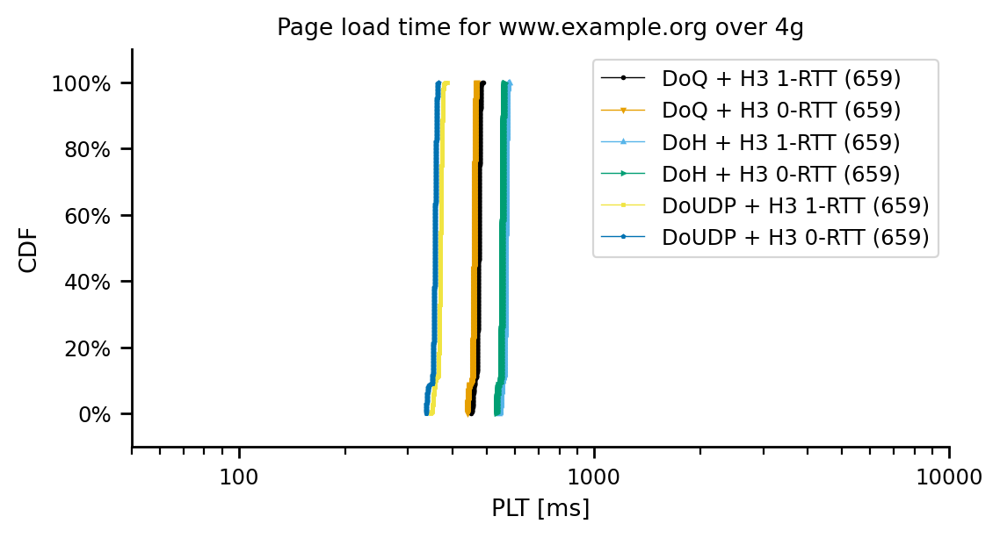

count     658.000000
mean      972.949578
std        28.724836
min       814.345236
10%       941.760356
20%       959.779722
25%       964.947219
30%       968.786065
40%       974.721051
50%       980.794447
60%       984.348823
70%       987.888030
75%       989.754877
80%       992.014890
90%       996.587679
100%     1023.833567
max      1023.833567
Name: full_plt, dtype: float64
count     658.000000
mean      957.365080
std        27.504556
min       804.471136
10%       927.426091
20%       943.007205
25%       946.788284
30%       952.131242
40%       957.795048
50%       964.220032
60%       968.290973
70%       971.986973
75%       973.978518
80%       976.157692
90%       982.533814
100%     1001.766771
max      1001.766771
Name: full_plt, dtype: float64
count     658.000000
mean     1063.915619
std        28.733021
min       905.682578
10%      1033.074558
20%      1051.527105
25%      1055.601871
30%      1059.591427
40%      1065.913268
50%      1071.551760
60%      1075.

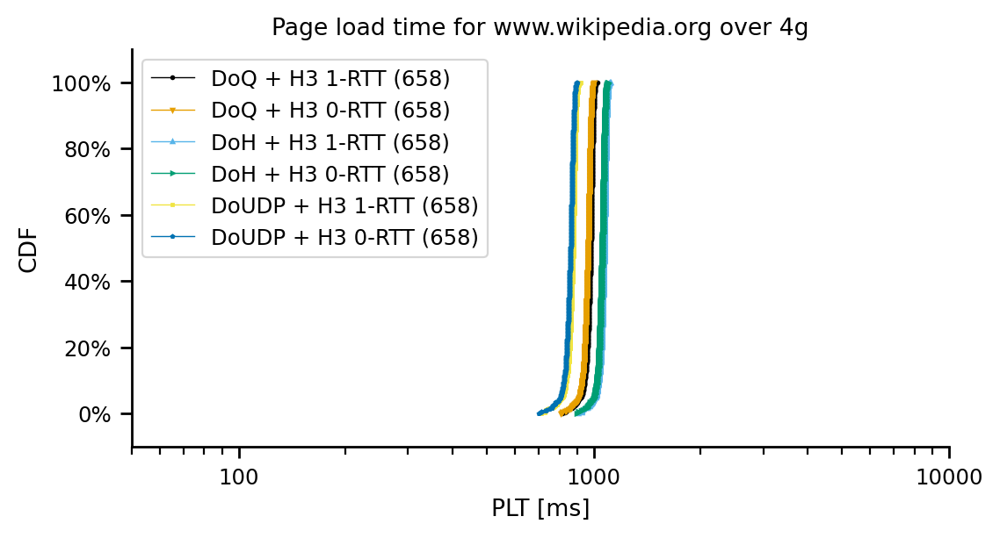

count     658.000000
mean     1429.789554
std        12.767211
min      1393.228547
10%      1415.127841
20%      1419.213957
25%      1420.985147
30%      1422.565361
40%      1425.569241
50%      1428.829969
60%      1432.256974
70%      1434.938582
75%      1436.698513
80%      1439.020672
90%      1445.459899
100%     1491.885094
max      1491.885094
Name: full_plt, dtype: float64
count     658.000000
mean     1402.707335
std        11.146152
min      1375.238735
10%      1389.421898
20%      1393.604246
25%      1395.133085
30%      1396.510948
40%      1399.185833
50%      1402.188985
60%      1404.814450
70%      1407.454625
75%      1408.982620
80%      1410.552696
90%      1416.695506
100%     1472.924573
max      1472.924573
Name: full_plt, dtype: float64
count     658.000000
mean     1520.714163
std        12.771056
min      1484.366819
10%      1506.159846
20%      1510.453001
25%      1511.989726
30%      1513.428374
40%      1516.223651
50%      1519.832826
60%      1523.

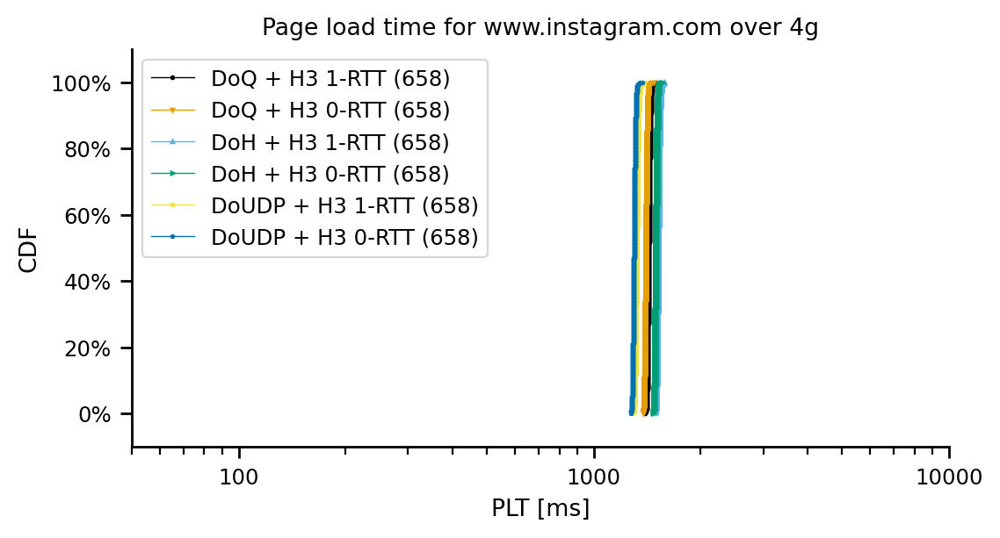

4g-medium
count    659.000000
mean     530.365594
std        6.377510
min      509.937421
10%      518.960062
20%      528.420416
25%      529.258359
30%      529.919013
40%      530.834518
50%      531.673103
60%      532.438036
70%      533.383815
75%      533.973318
80%      534.534152
90%      535.813851
100%     572.315298
max      572.315298
Name: full_plt, dtype: float64
count    659.000000
mean     516.944653
std        6.228228
min      496.462847
10%      505.638737
20%      514.919451
25%      515.789590
30%      516.352788
40%      517.342700
50%      518.344107
60%      519.084890
70%      520.125896
75%      520.617427
80%      521.220253
90%      522.725149
100%     525.653609
max      525.653609
Name: full_plt, dtype: float64
count    659.000000
mean     631.389102
std        6.324357
min      609.521495
10%      620.187990
20%      629.441575
25%      630.238296
30%      630.873296
40%      631.763306
50%      632.611693
60%      633.349023
70%      634.323533
75%     

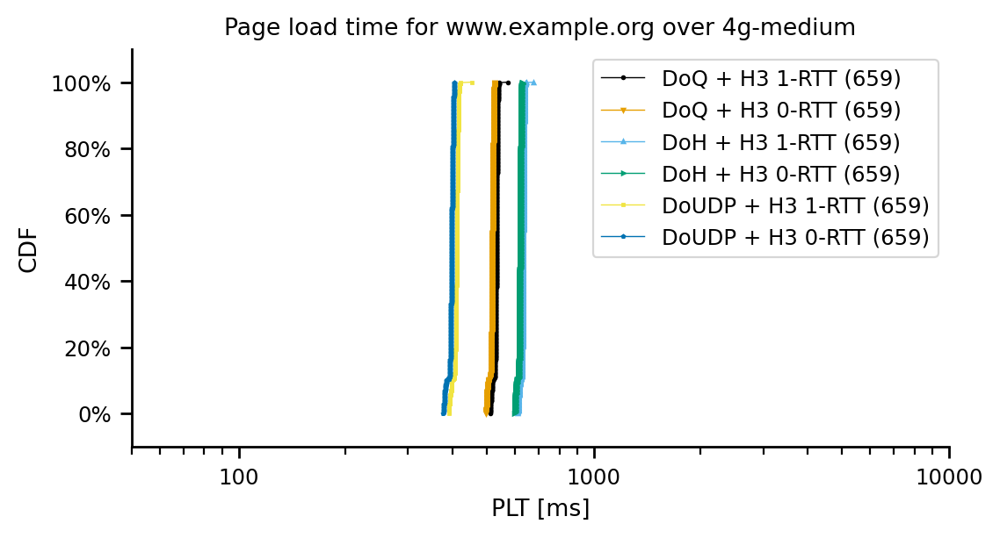

count     658.000000
mean     1030.392525
std        31.464048
min       865.206574
10%      1001.257409
20%      1018.015003
25%      1022.984269
30%      1027.308048
40%      1032.244037
50%      1038.060510
60%      1041.961698
70%      1046.287118
75%      1048.168560
80%      1050.530824
90%      1057.179719
100%     1074.719330
max      1074.719330
Name: full_plt, dtype: float64
count     658.000000
mean     1014.261825
std        29.721611
min       861.972487
10%       984.382477
20%      1002.272072
25%      1006.164713
30%      1010.277945
40%      1017.340947
50%      1021.476141
60%      1025.321755
70%      1029.178269
75%      1030.922781
80%      1033.477543
90%      1039.152875
100%     1060.502824
max      1060.502824
Name: full_plt, dtype: float64
count     658.000000
mean     1131.482301
std        31.407174
min       967.546796
10%      1103.059557
20%      1118.584450
25%      1123.621894
30%      1128.367554
40%      1133.149876
50%      1138.946287
60%      1143.

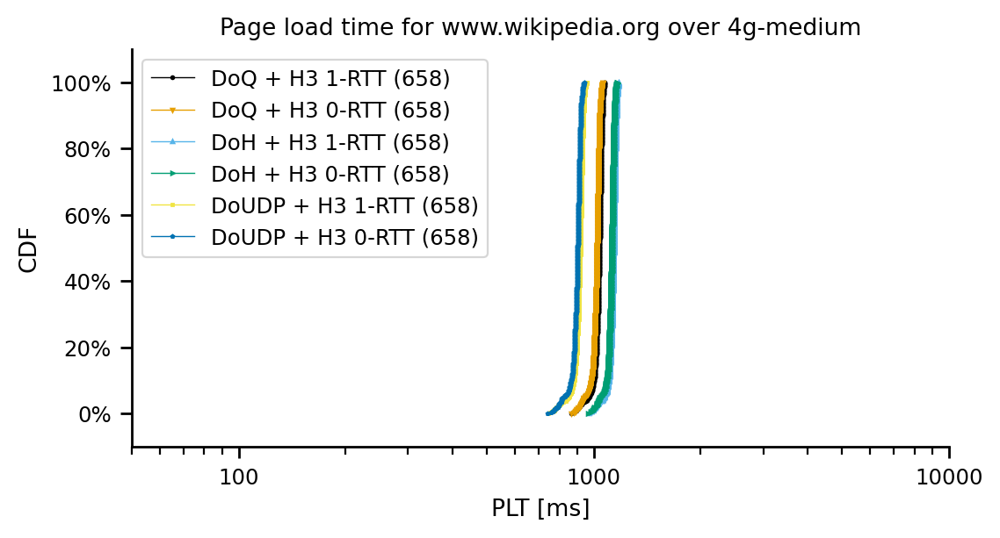

count     658.000000
mean     1656.040197
std        12.007768
min      1621.970987
10%      1640.884746
20%      1645.502279
25%      1647.748113
30%      1649.601291
40%      1653.637168
50%      1656.158962
60%      1658.825286
70%      1661.829084
75%      1663.735144
80%      1665.869921
90%      1671.070140
100%     1690.245800
max      1690.245800
Name: full_plt, dtype: float64
count     658.000000
mean     1631.254787
std        12.115267
min      1591.423345
10%      1615.985760
20%      1621.498056
25%      1623.233146
30%      1625.402844
40%      1628.410099
50%      1631.406804
60%      1633.767751
70%      1637.327895
75%      1639.038871
80%      1640.642693
90%      1647.364157
100%     1700.401024
max      1700.401024
Name: full_plt, dtype: float64
count     658.000000
mean     1757.065704
std        12.000517
min      1723.242000
10%      1741.619720
20%      1746.613753
25%      1748.996948
30%      1750.884037
40%      1754.587460
50%      1757.156154
60%      1759.

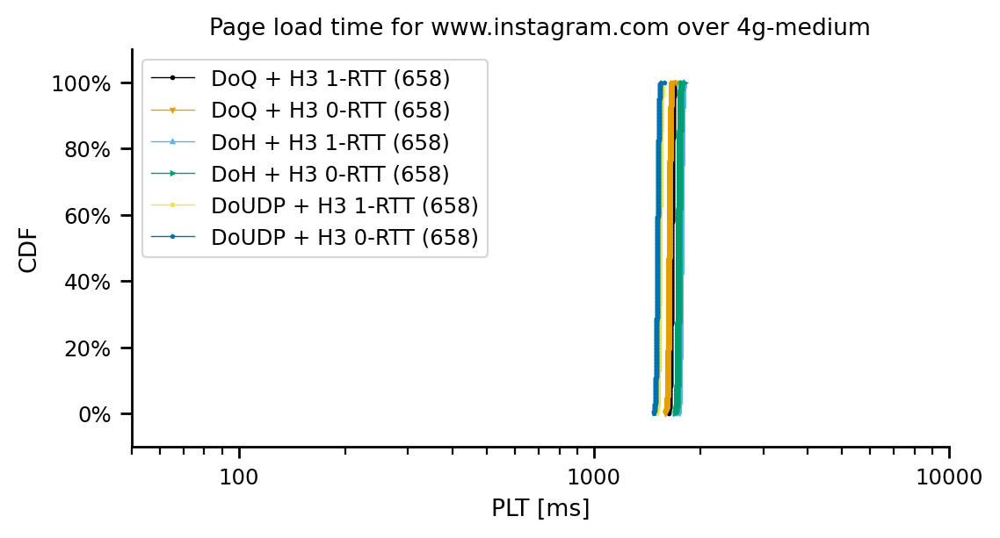

dsl


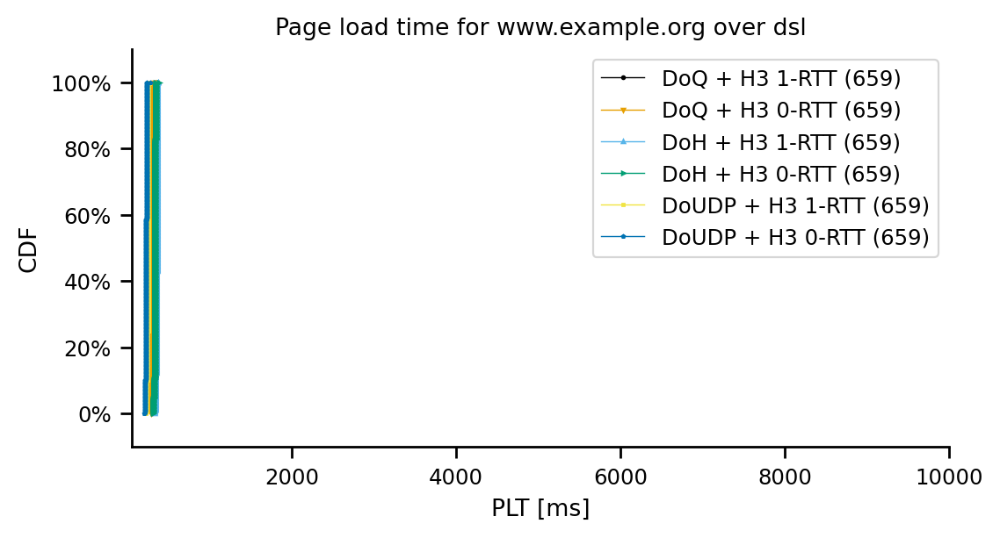

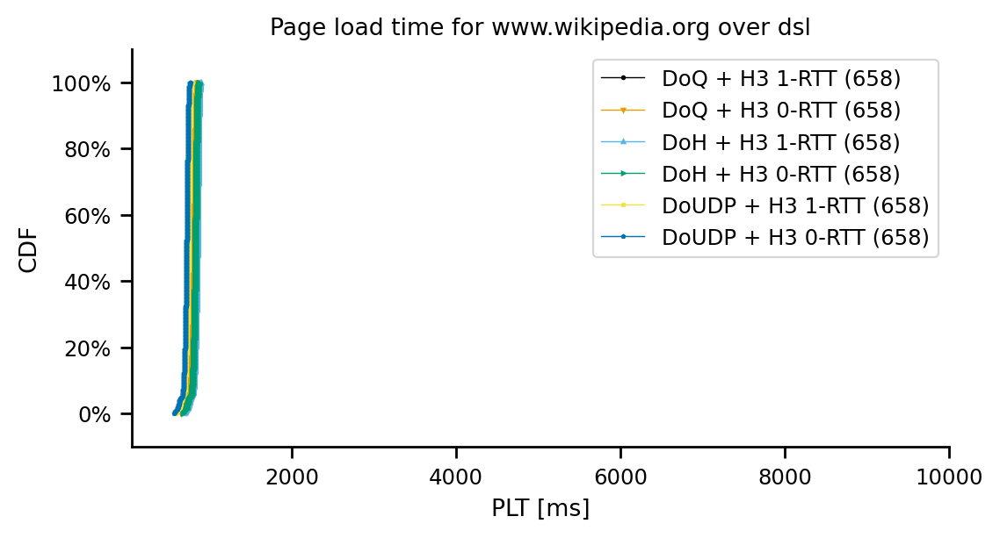

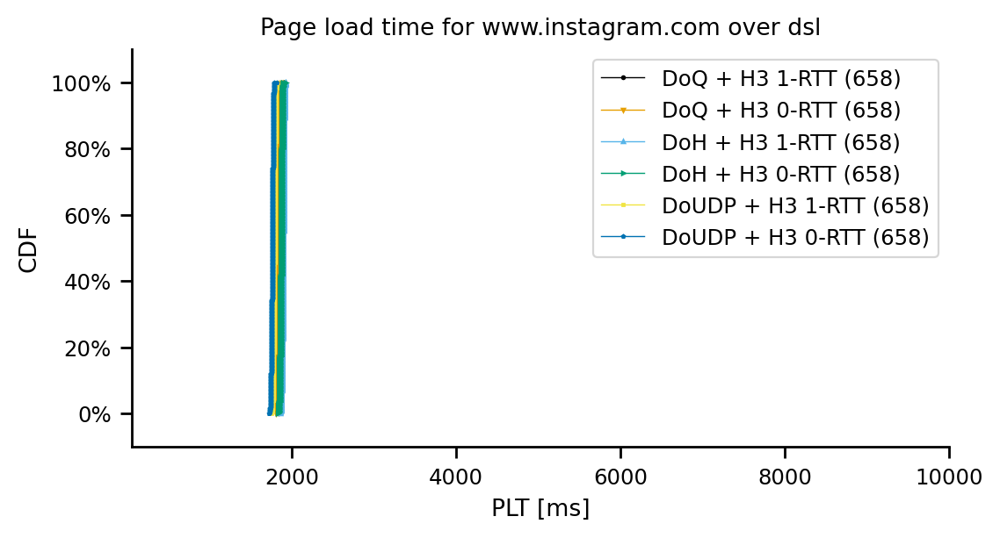

cable


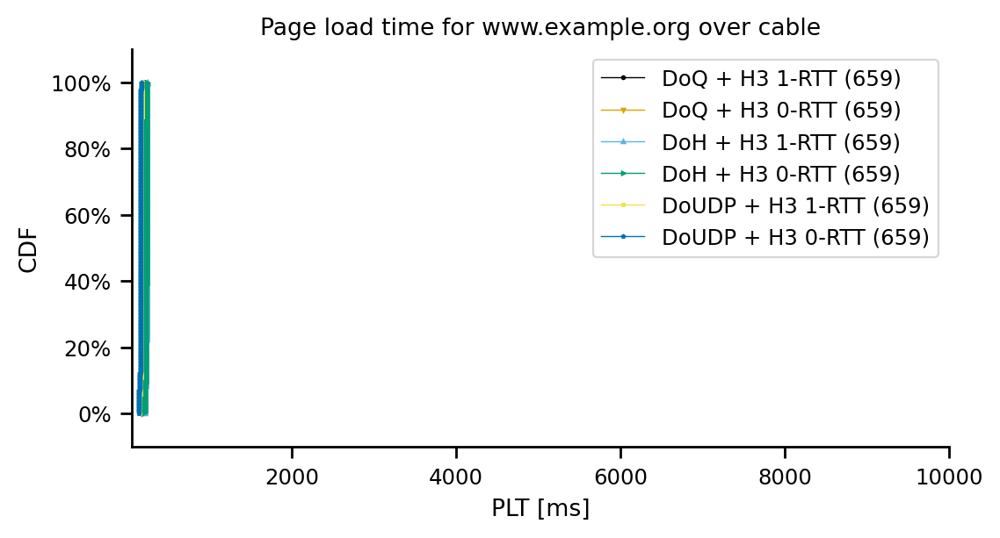

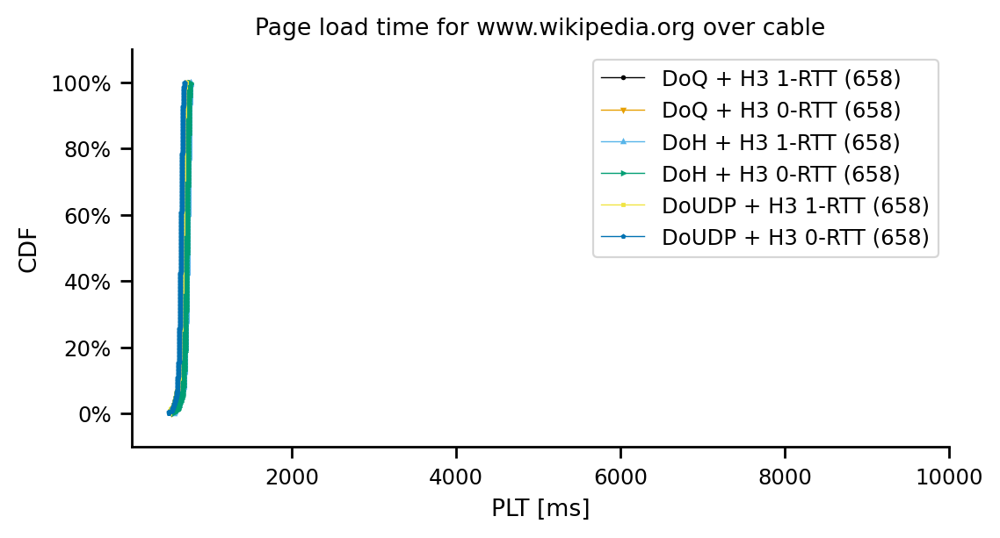

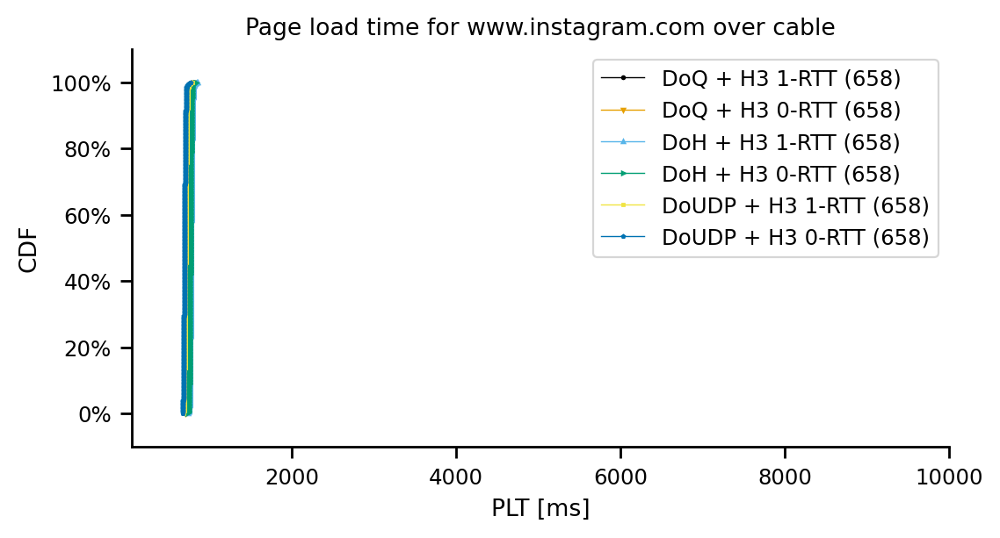

fiber


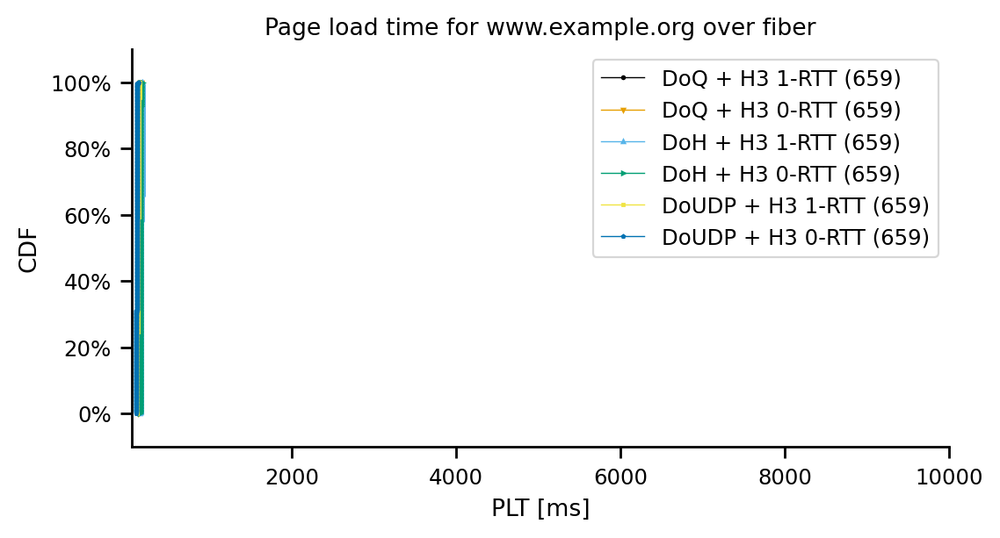

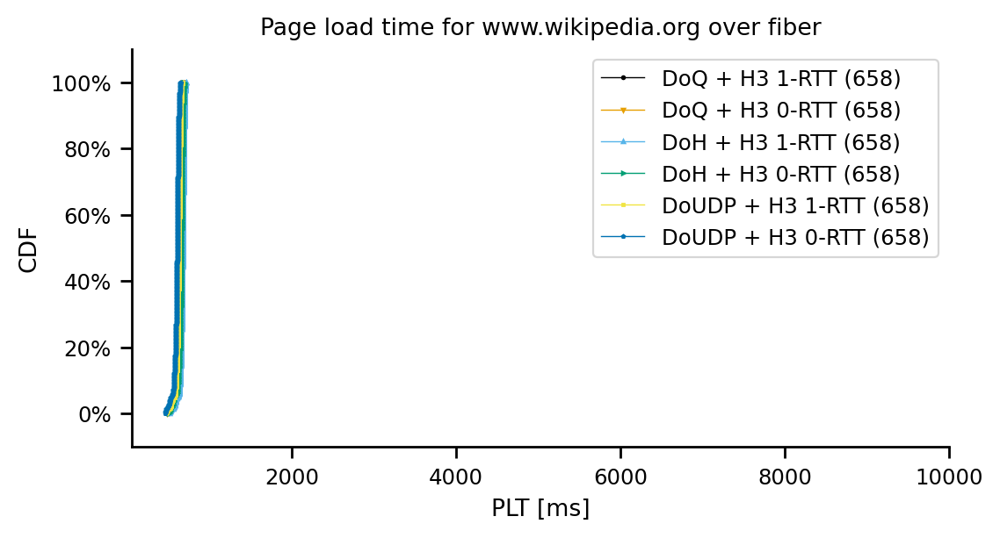

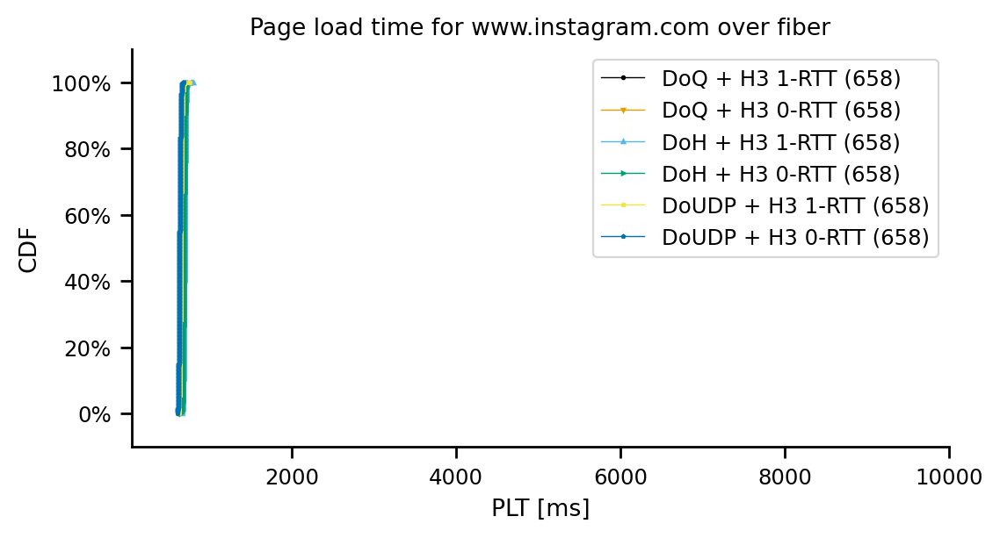

4g


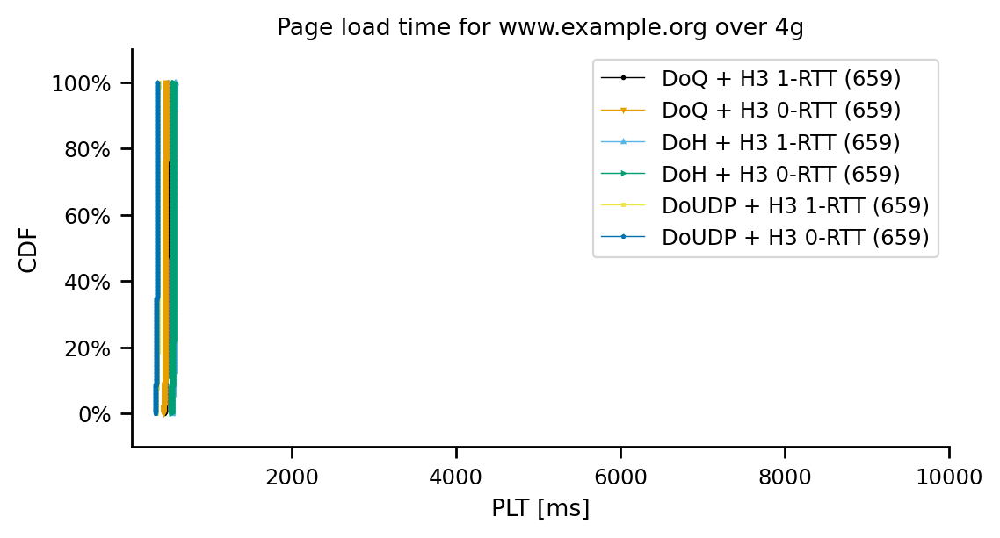

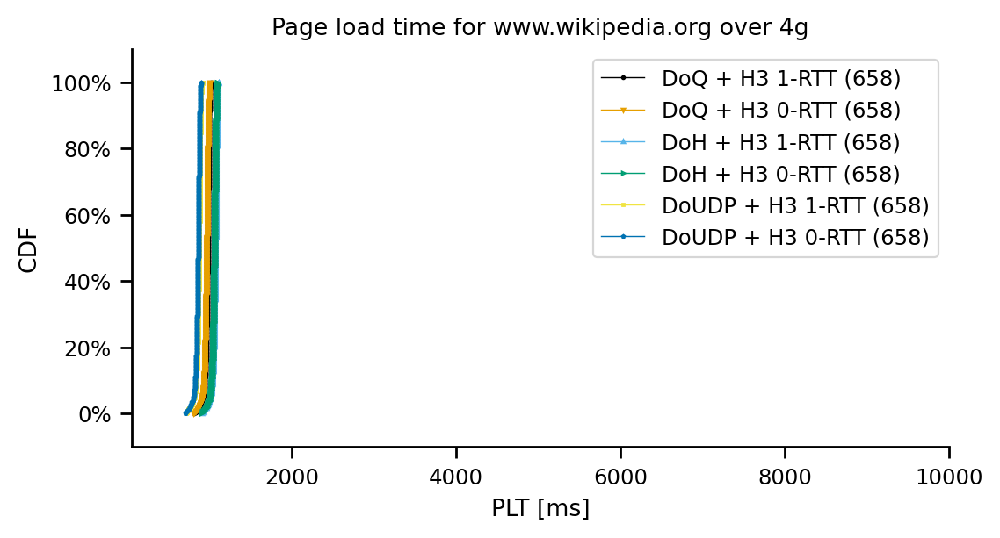

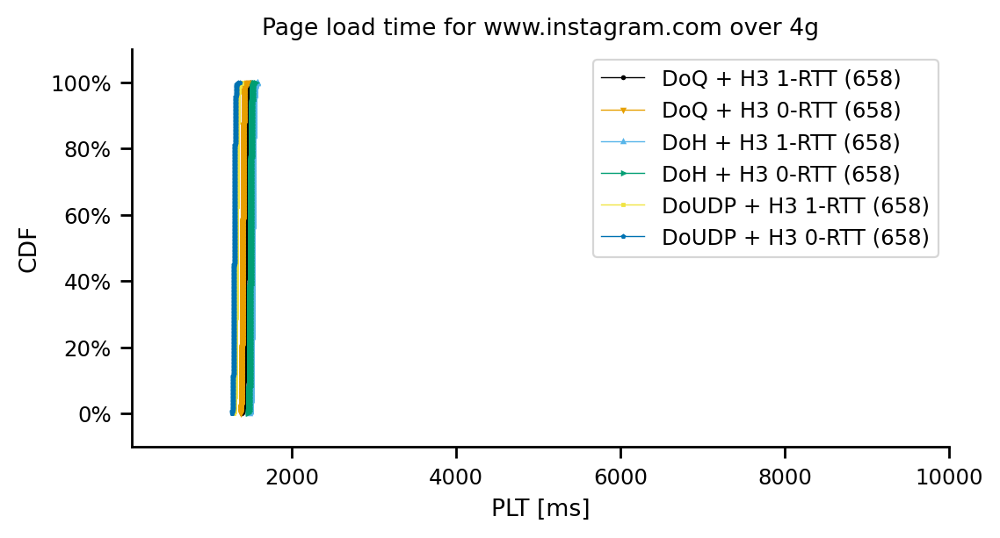

4g-medium


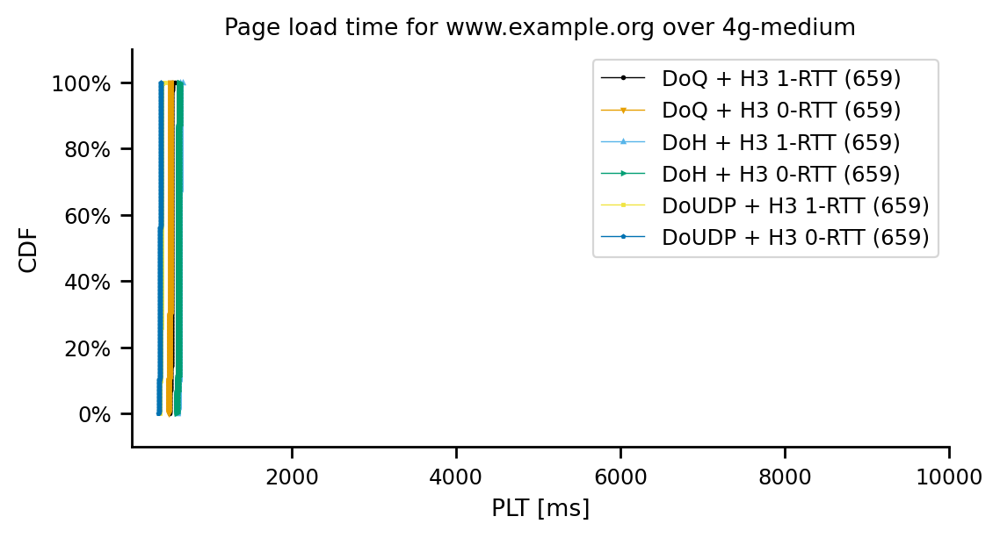

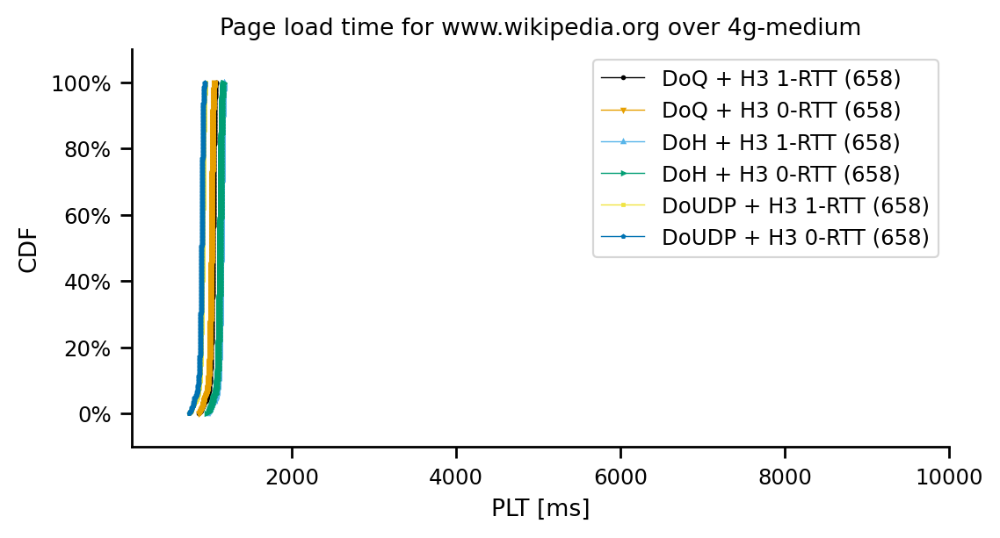

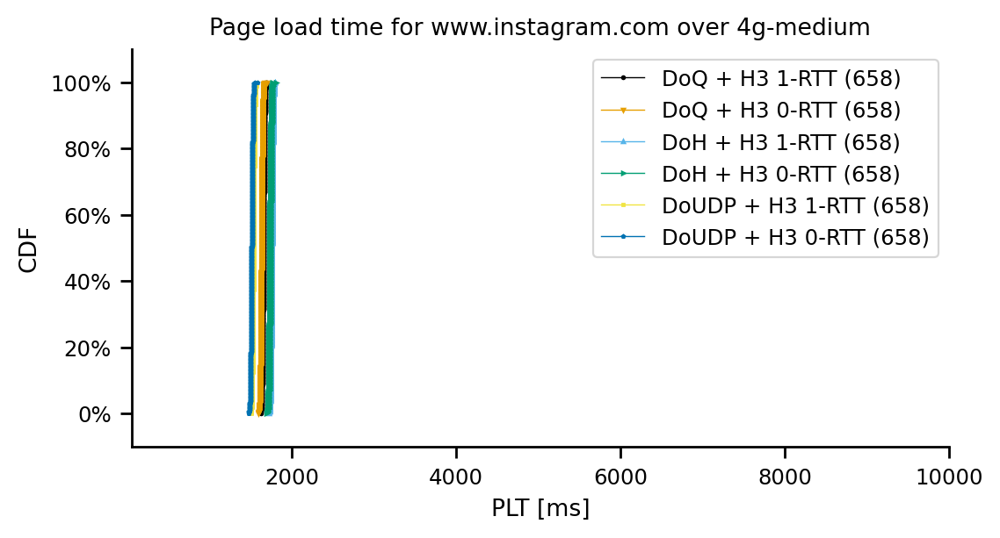

In [1100]:
for log in [True, False]:
    for access_technology in df_dns_and_h3.experiment_type.unique():
        print(access_technology)
        df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
        for website in df_plt['website'].unique():
            fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
            line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
            colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
            markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

            lnwidth = 0.5
            mrksize = 1
            #log=True
            for experiment in line_order:
                    df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                    if len(df_tmp['full_plt']) == 0:
                        continue
                    if log:
                        print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                    dfplt = make_cdf(df_tmp['full_plt'])
                    dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

            ax.spines['right'].set_color('none')
            ax.spines['top'].set_color('none')
            ax.yaxis.set_ticks_position('left')
            ax.xaxis.set_ticks_position('bottom')
            ax.spines['bottom'].set_position(('axes', -0.0))
            ax.spines['left'].set_position(('axes', -0.0))
            if log:
                ax.set_xscale('log')


            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
            ax.tick_params(axis='x', which='minor', labelsize=6)
            ax.xaxis.set_tick_params(labelbottom=True, which='both')


            ax.set_title('Page load time for '+website+' over '+access_technology)

            ax.set_xlabel('PLT [ms]')

            ax.set_ylabel("CDF")
            ax.set_ylim(-0.1,1.1)
            ax.set_xlim(50,10000)


            ax.legend()

            #if log:
            #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
            #else:
            #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
            plt.show()

fiber


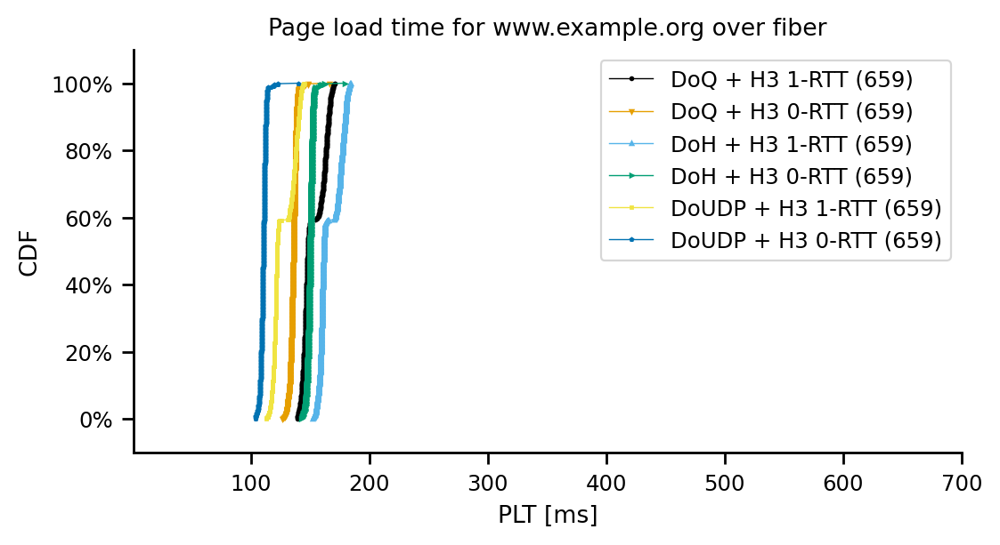

cable


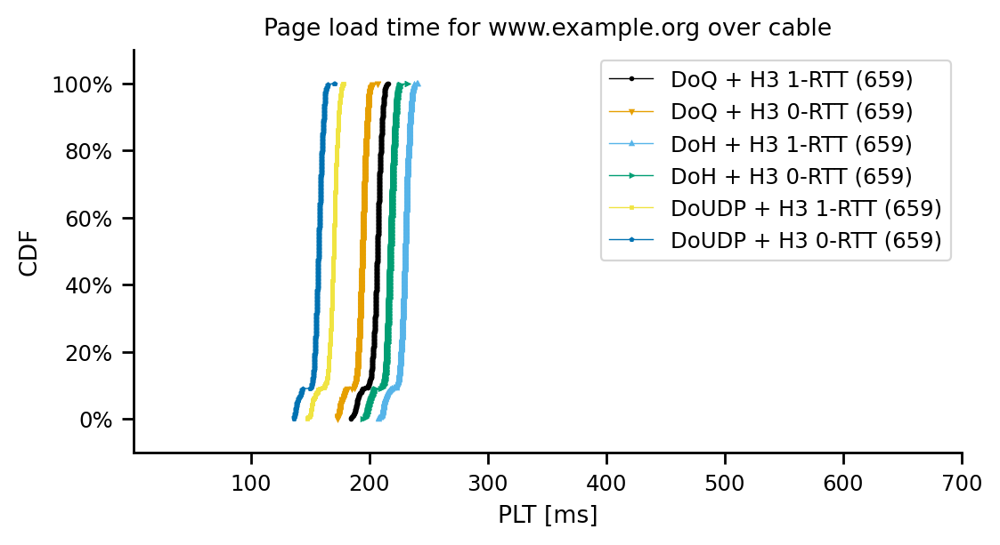

dsl


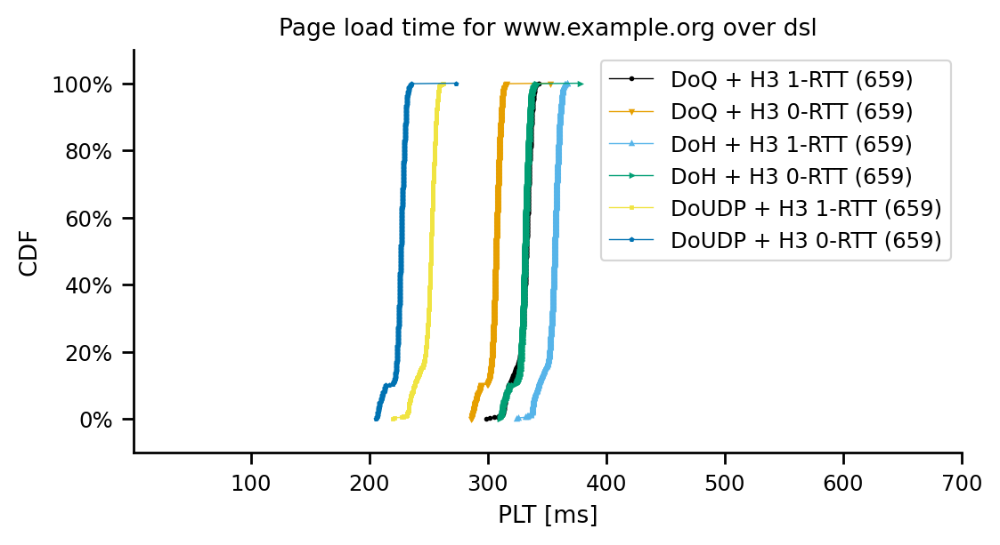

4g


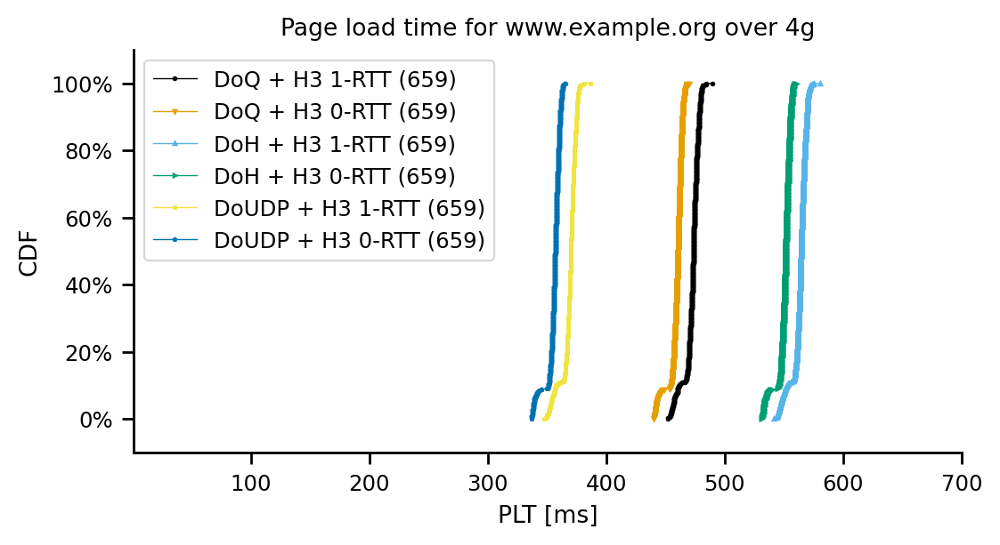

4g-medium


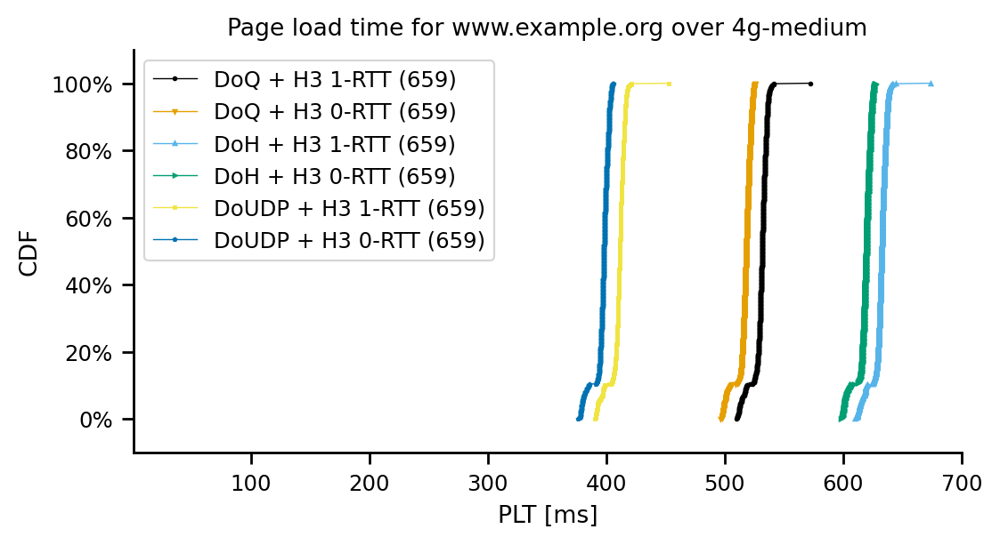

In [1101]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.example.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,700)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


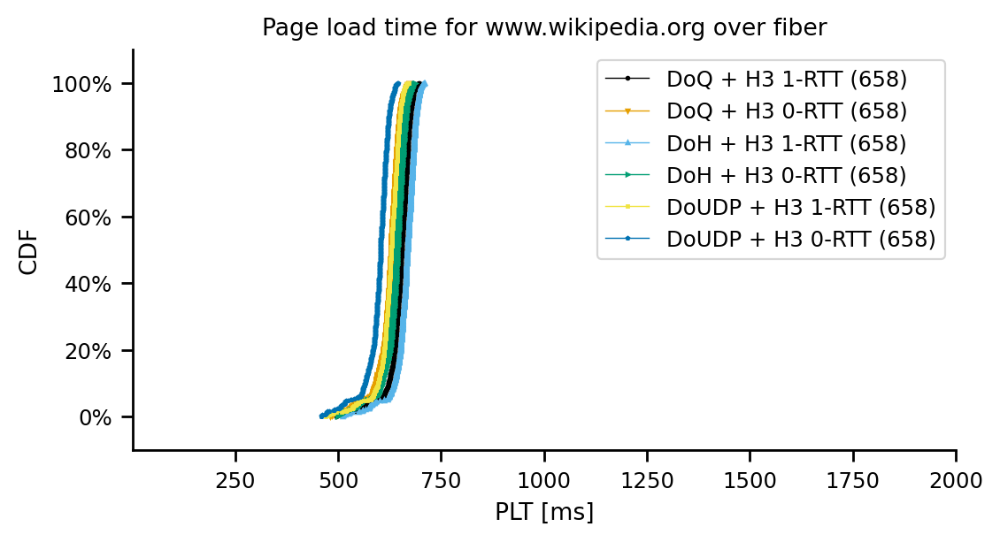

cable


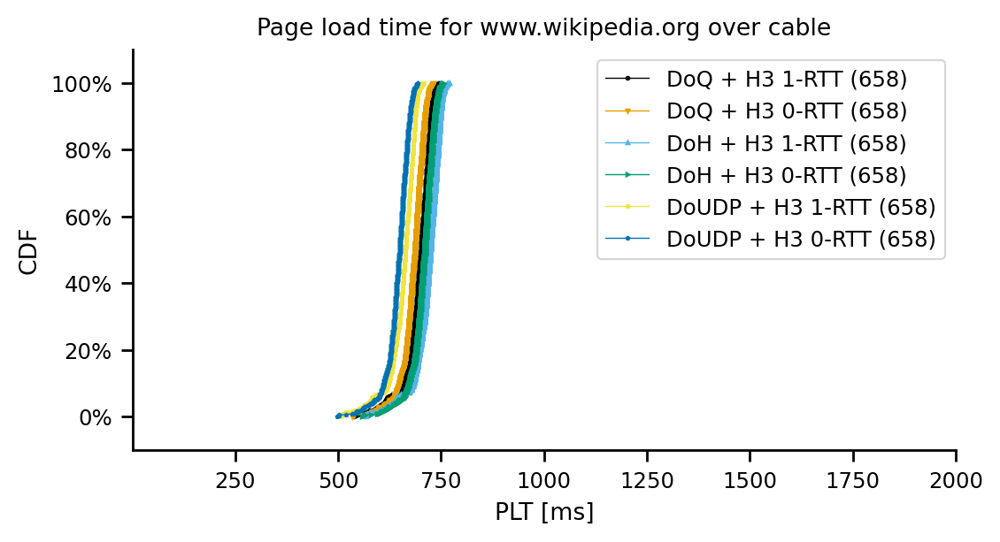

dsl


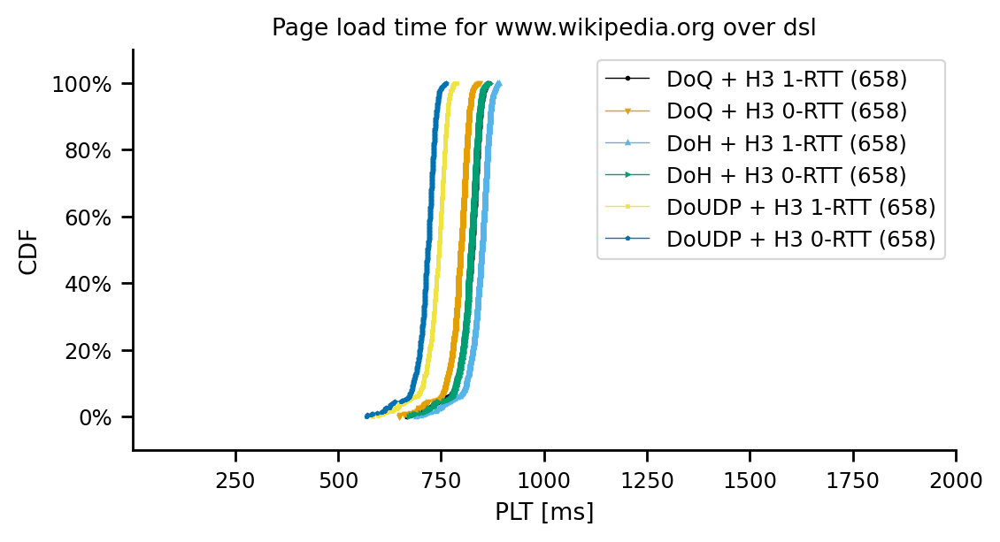

4g


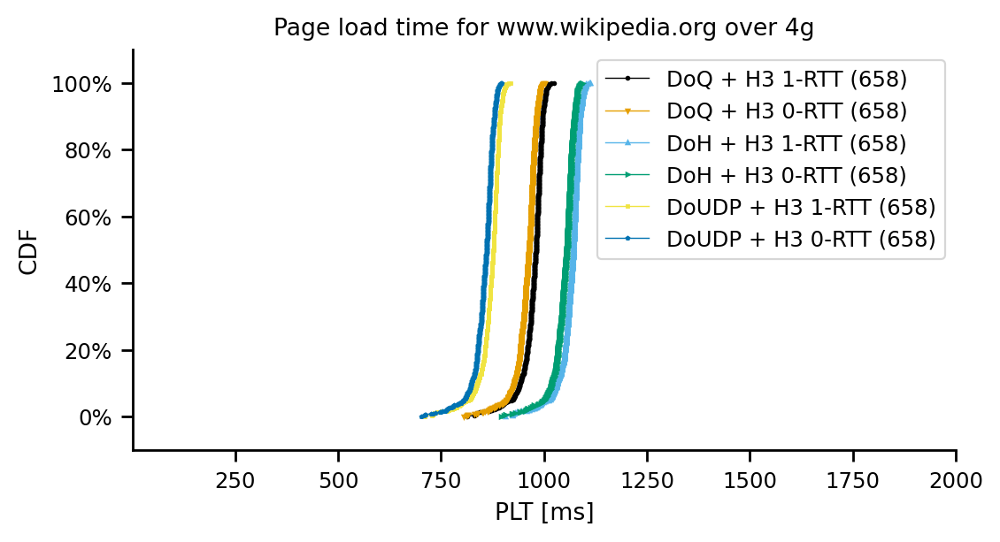

4g-medium


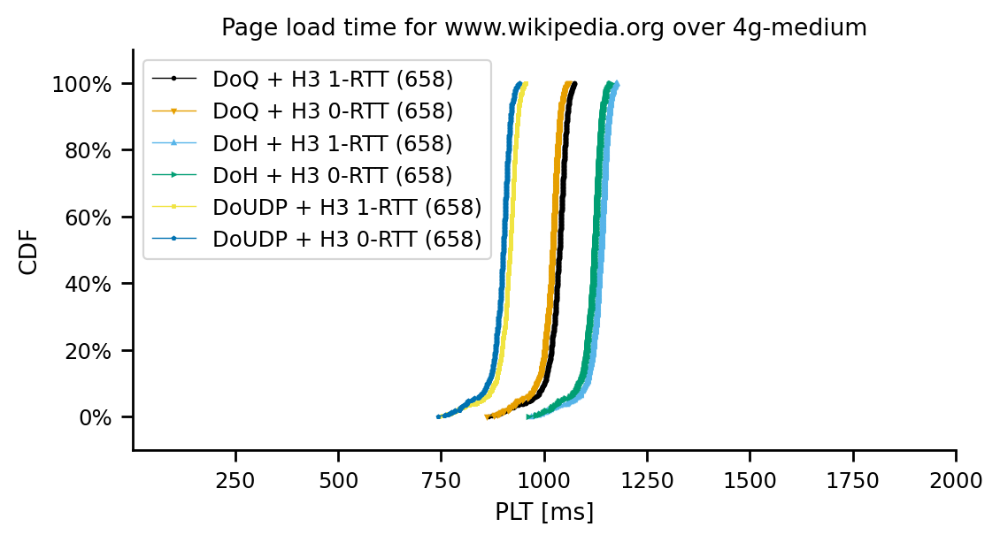

In [1102]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,2000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


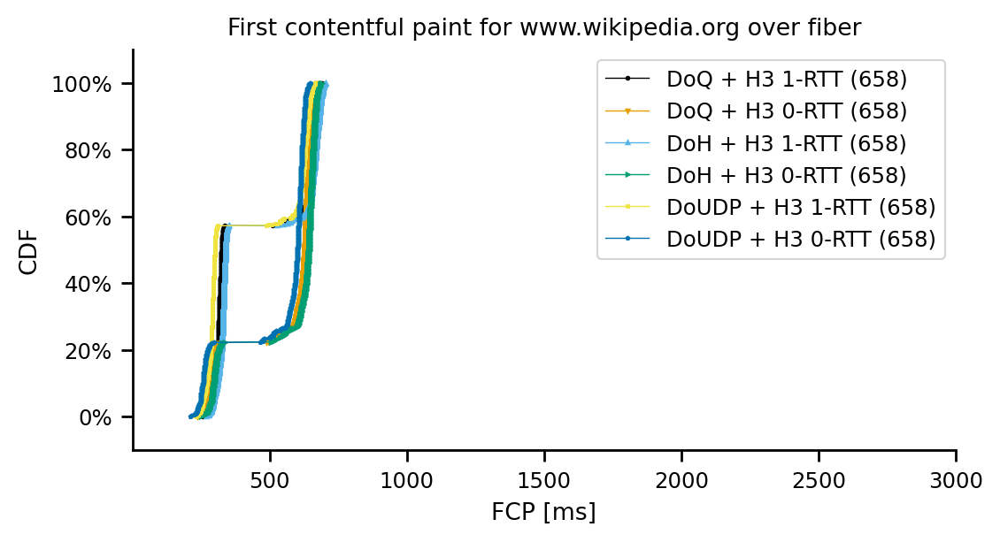

cable


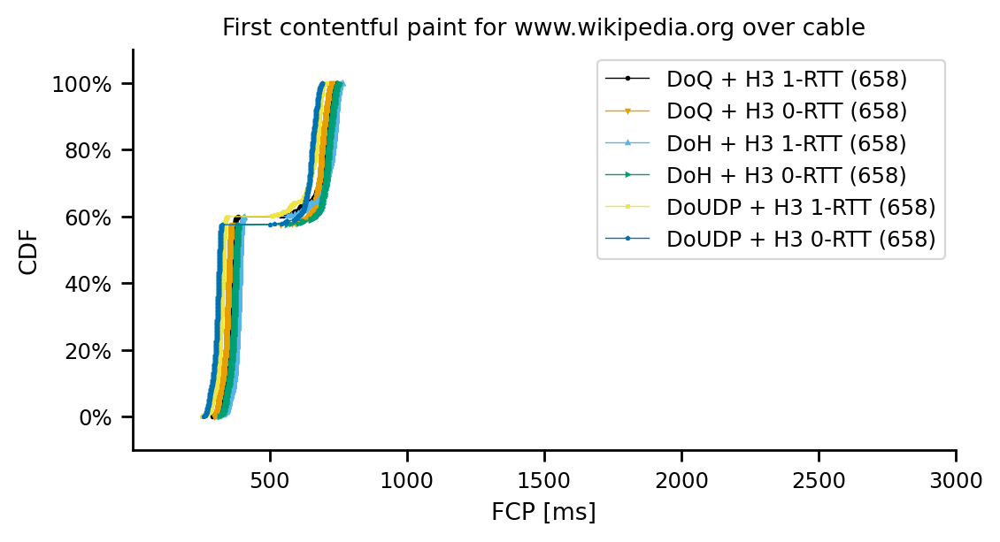

dsl


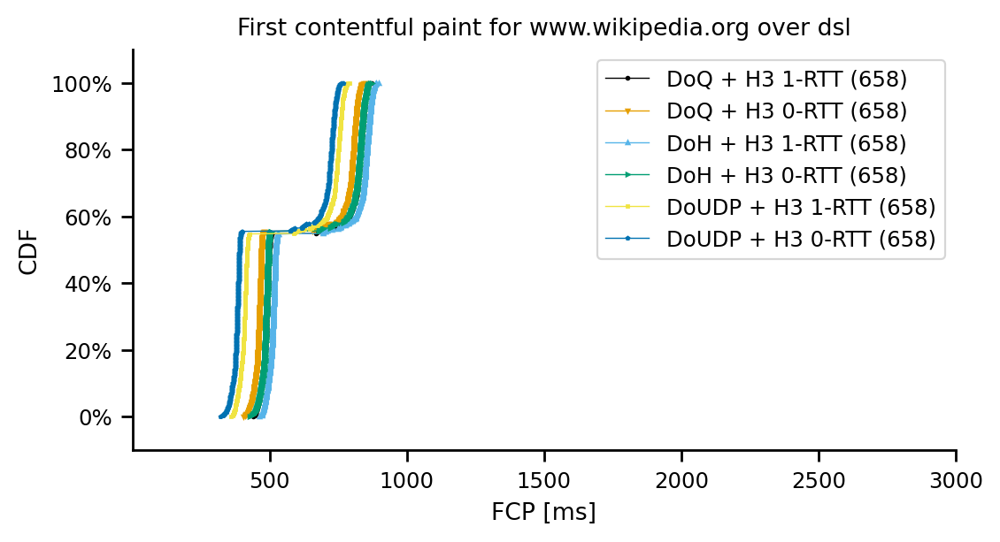

4g


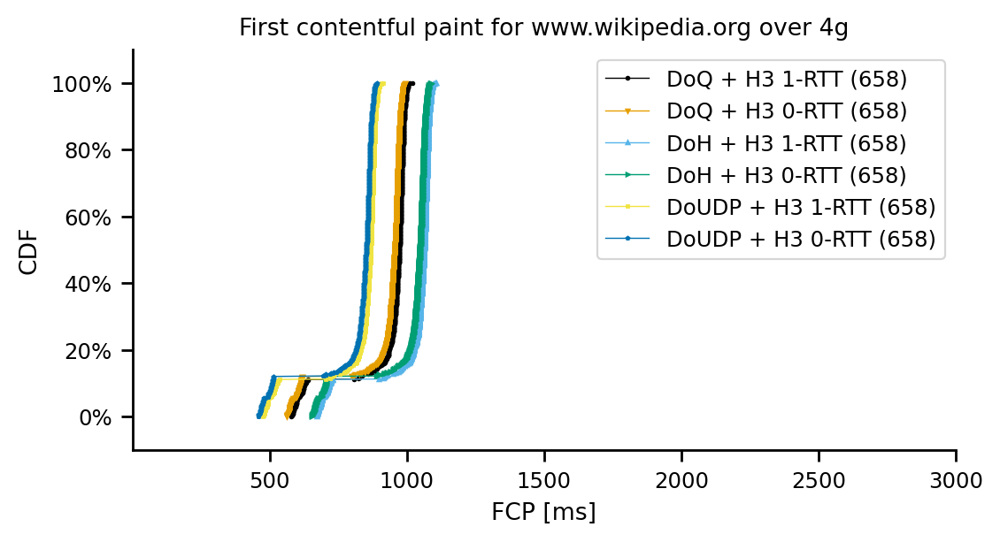

4g-medium


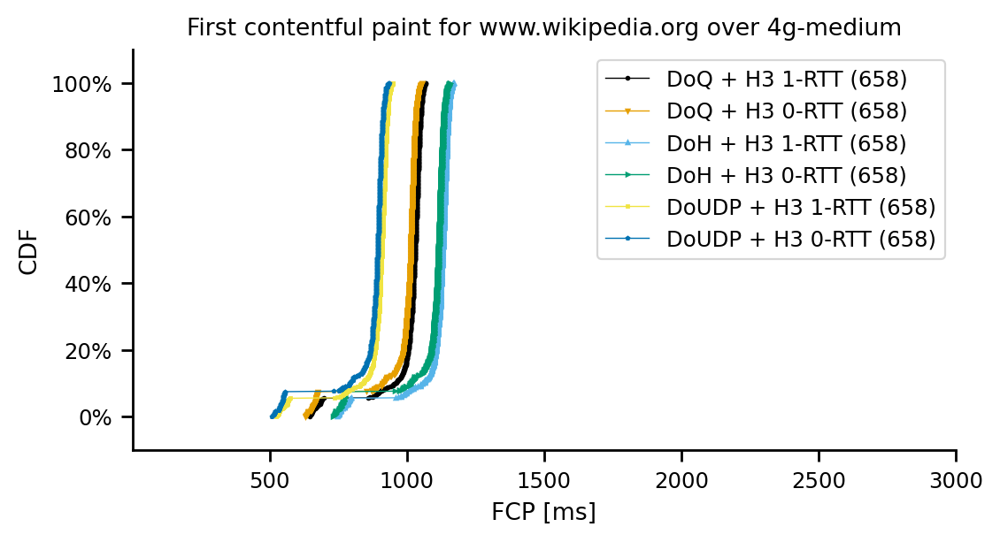

In [1103]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,3000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [1104]:
df_dns_and_h3.dtypes

msm_id                         object
connectEnd                    float64
connectStart                  float64
domComplete                   float64
domContentLoadedEventEnd      float64
domContentLoadedEventStart    float64
domInteractive                float64
domainLookupEnd               float64
domainLookupStart             float64
duration                      float64
encodedBodySize                 int64
decodedBodySize                 int64
transferSize                    int64
fetchStart                    float64
loadEventEnd                  float64
loadEventStart                float64
requestStart                  float64
responseEnd                   float64
responseStart                 float64
secureConnectionStart         float64
startTime                     float64
firstPaint                    float64
firstContentfulPaint          float64
nextHopProtocol                object
redirectStart                 float64
redirectEnd                   float64
redirectCoun

In [1105]:
df_dns_and_h3.timestamp = pd.to_datetime(df_dns_and_h3.timestamp, format="%Y-%m-%d_%H_%M_%S")

<AxesSubplot:xlabel='timestamp'>

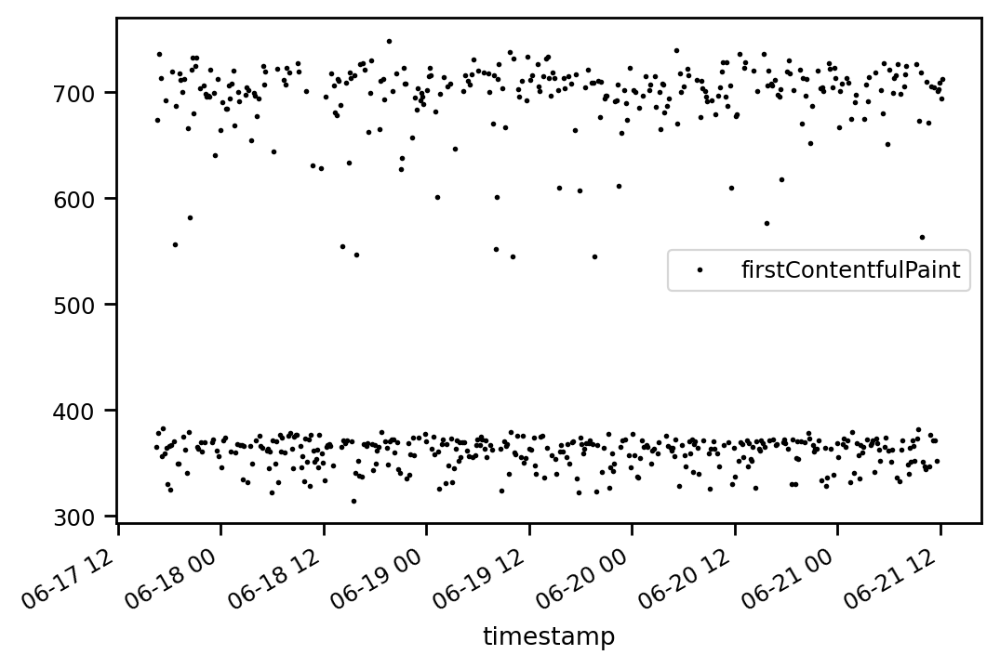

In [1106]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

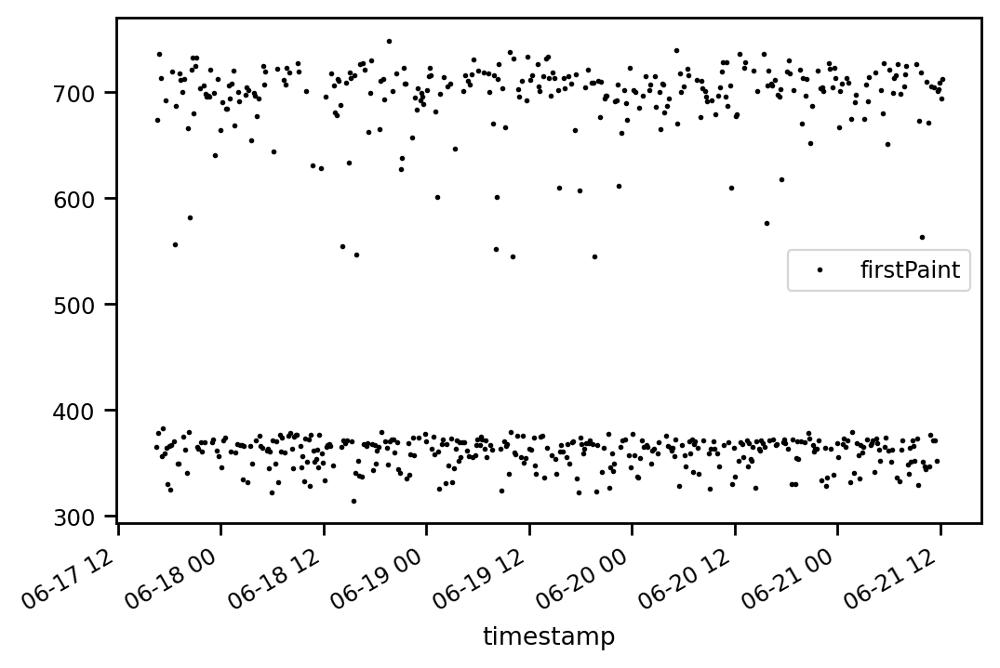

In [1107]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

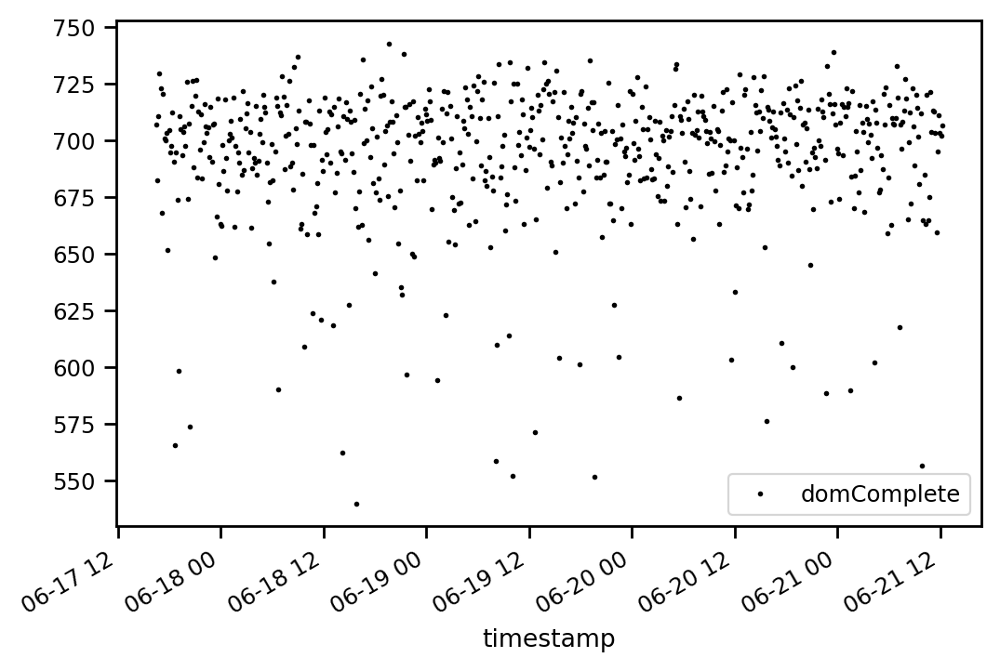

In [1108]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='domComplete', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

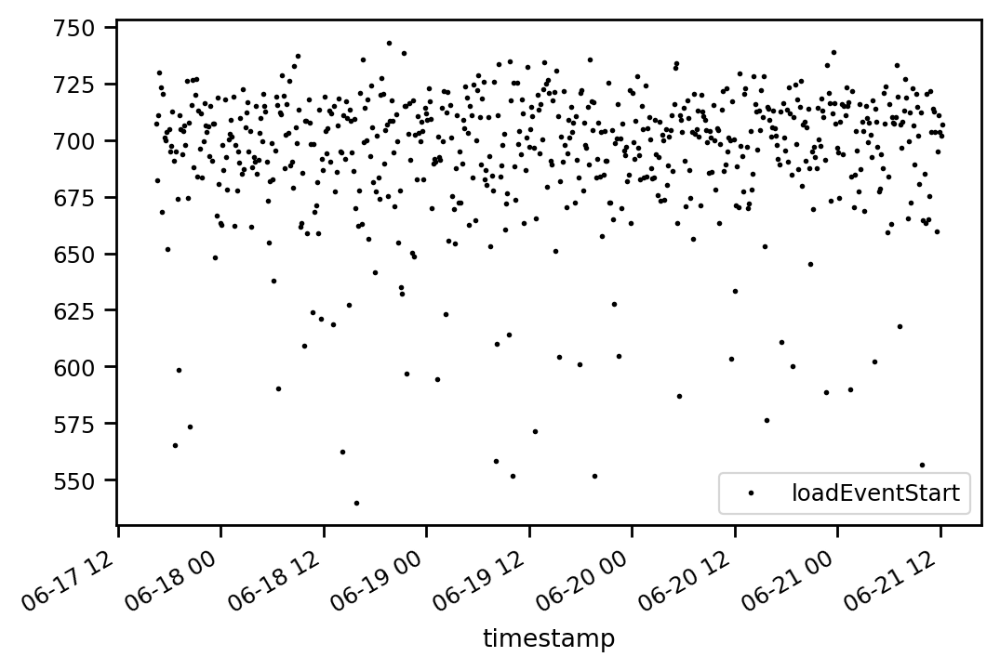

In [1109]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

fiber


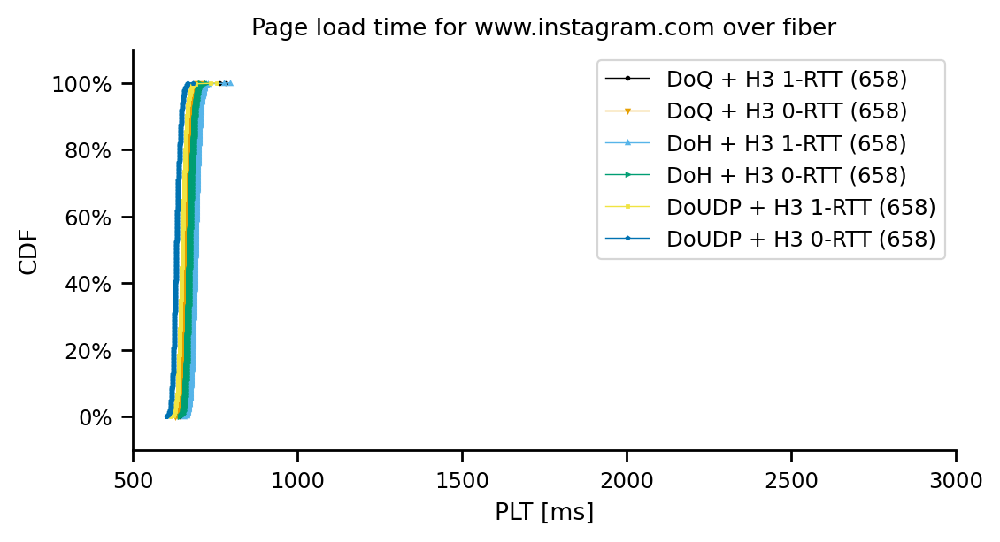

cable


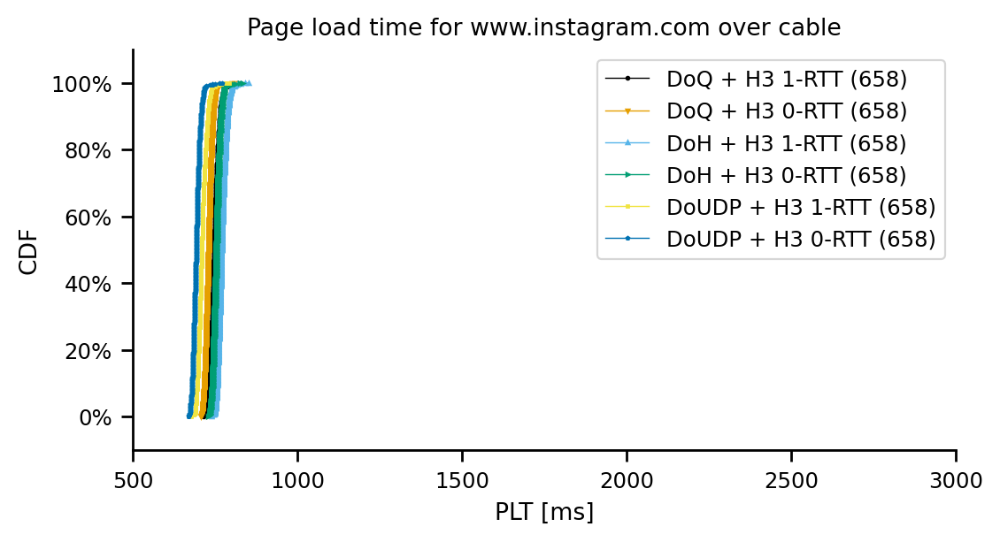

dsl


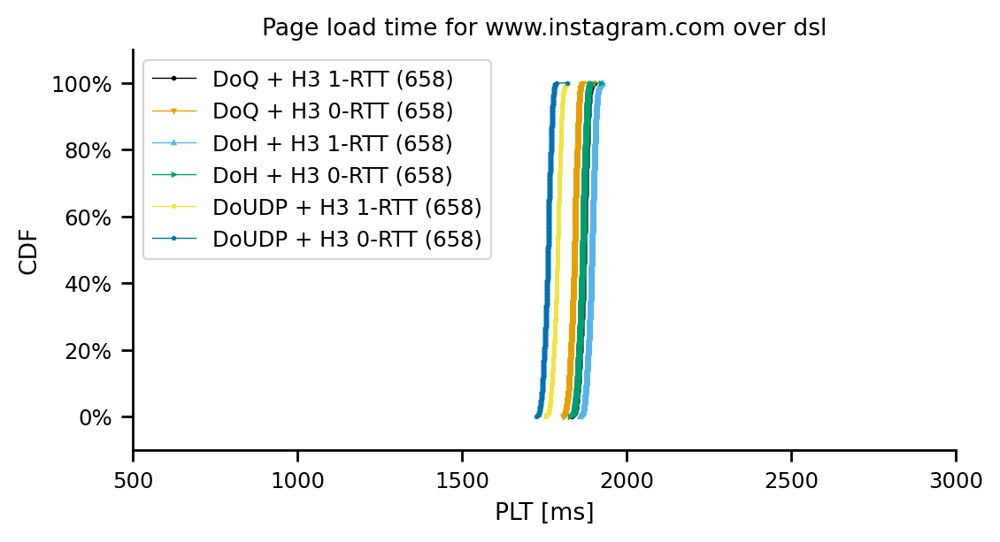

4g


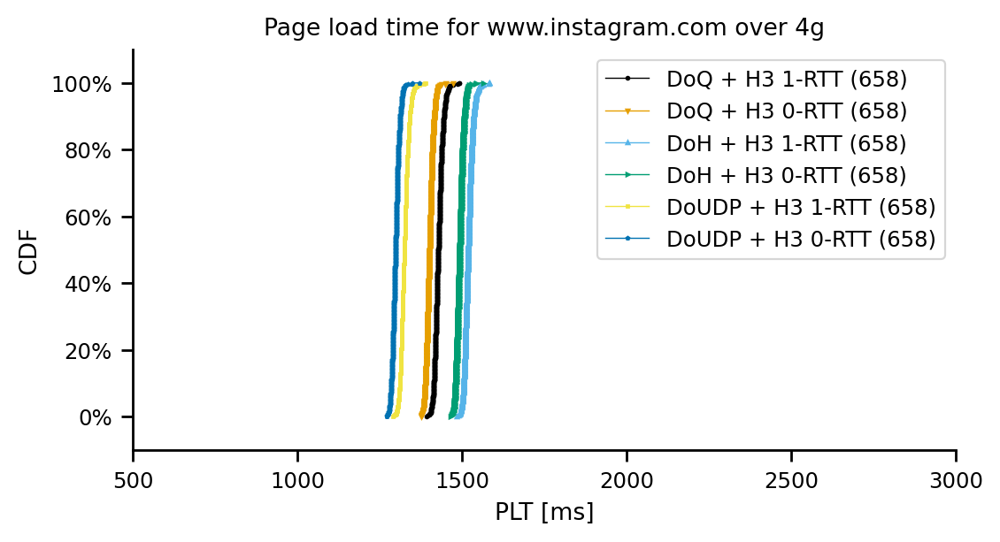

4g-medium


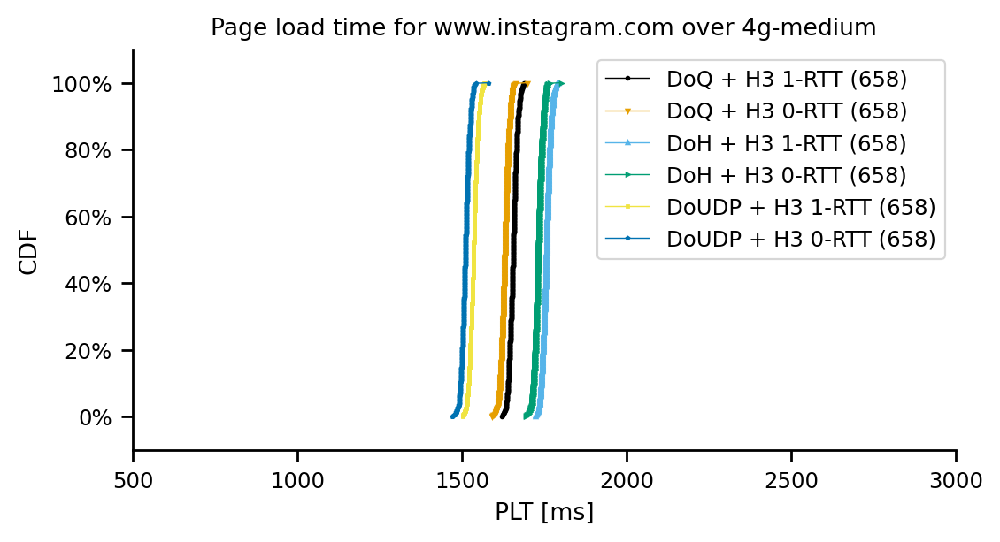

In [1110]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.instagram.com']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(500,3000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [1111]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [1112]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

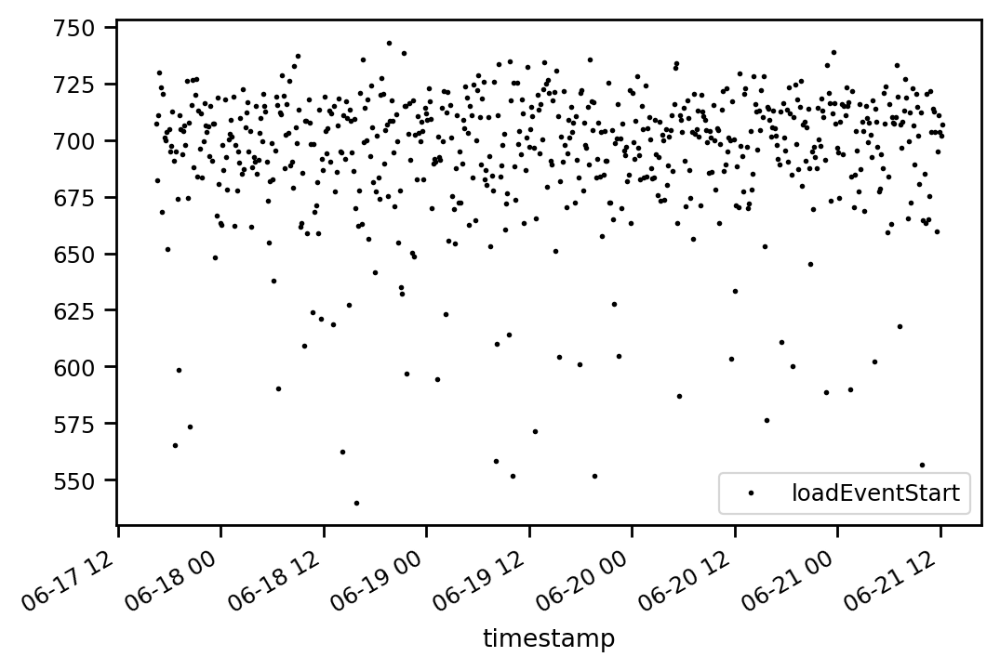

In [1113]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

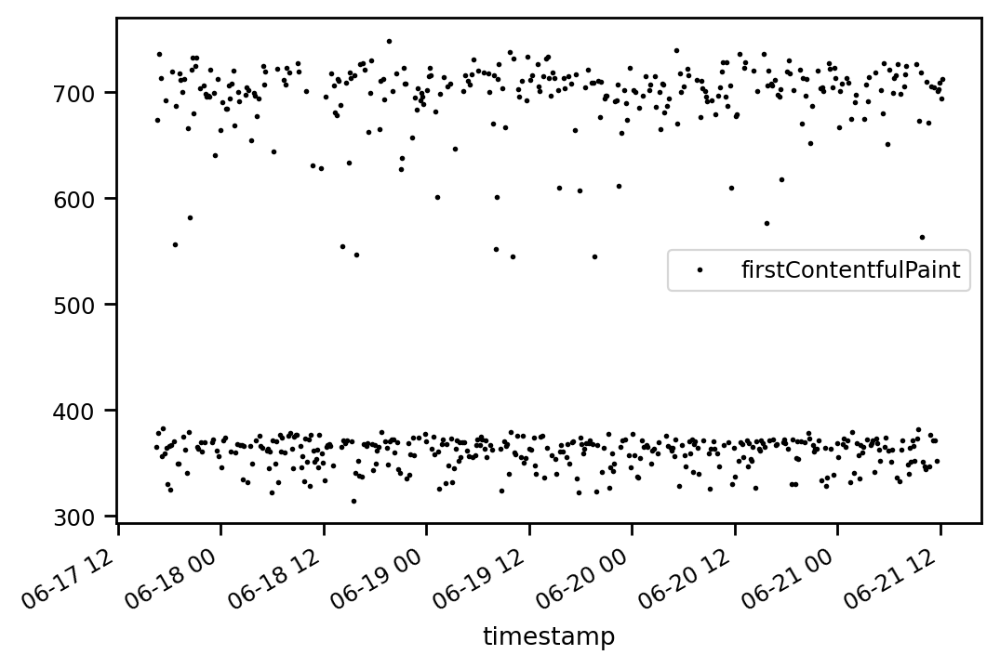

In [1114]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1115]:
#dsl_msms=['ea7f2f67-49aa-4b24-bbdb-2f579e93ae2d',
#          '0db34220-adc4-47ca-98ef-b477b4546c70',
#          '1a594a4d-7229-4b33-996a-86ac8ee8e87f',
#          'a5bdf51b-6cf3-4b39-af48-7b3588b8fa32',
#          '72f14b6a-778c-4aaa-ae6b-081b55eb1a3e',
#          'd5c12acb-6c08-4aed-a30d-fe5177353e9a']
#dsl_msms = ['40226da6-4e2e-41da-be00-ea3d8568b8ac',
#           '0996f426-0b60-40bc-844b-59642efb5e88', 
#           '834c4ab5-fffe-438b-9eba-ec294fca29e1']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(dsl_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

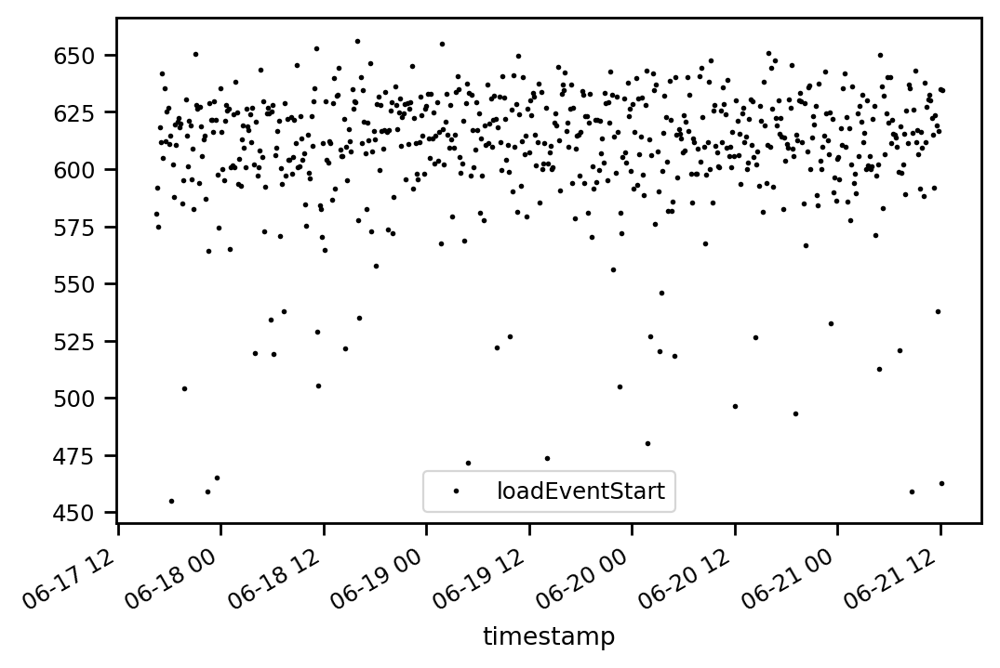

In [1116]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

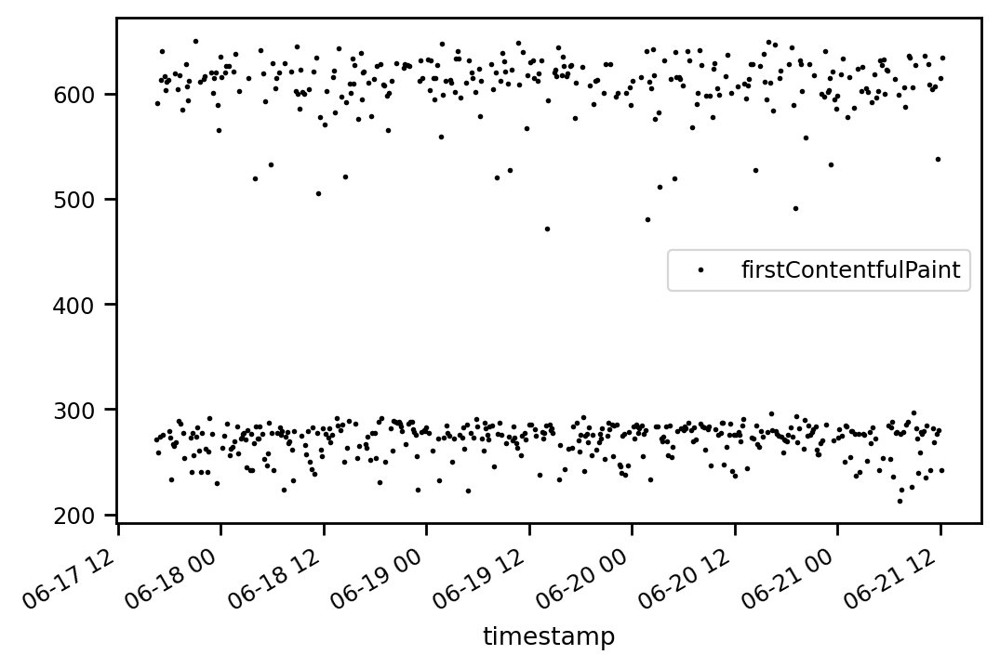

In [1117]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1118]:
#fiber_msms=['097f5c5a-70d2-4d49-9403-a8bcce09aac9', 
#           '91f26e10-53cc-4c85-8e4c-401f37fbcb5b',
#           '11893d09-c545-48eb-84cd-69336faf5ea1',
#           '25cab733-fee7-4e82-af9c-8993f827f499',
#           '6f4abddc-4822-4cfe-8019-ad1058cb8177',
#           '52ad18c8-2f93-45fc-b6e0-ea6c6a589478']
#fiber_msms=['80ffb3af-c2c9-4567-ba4a-7bcca408dff4',
#           'b6131e76-734f-4ded-b907-006d00d19e6b',
#           '8831ce97-936c-46b7-94bb-0199d9a53f00',
#           '9e1ed825-d333-4bd9-9053-584d7079c31a']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(fiber_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

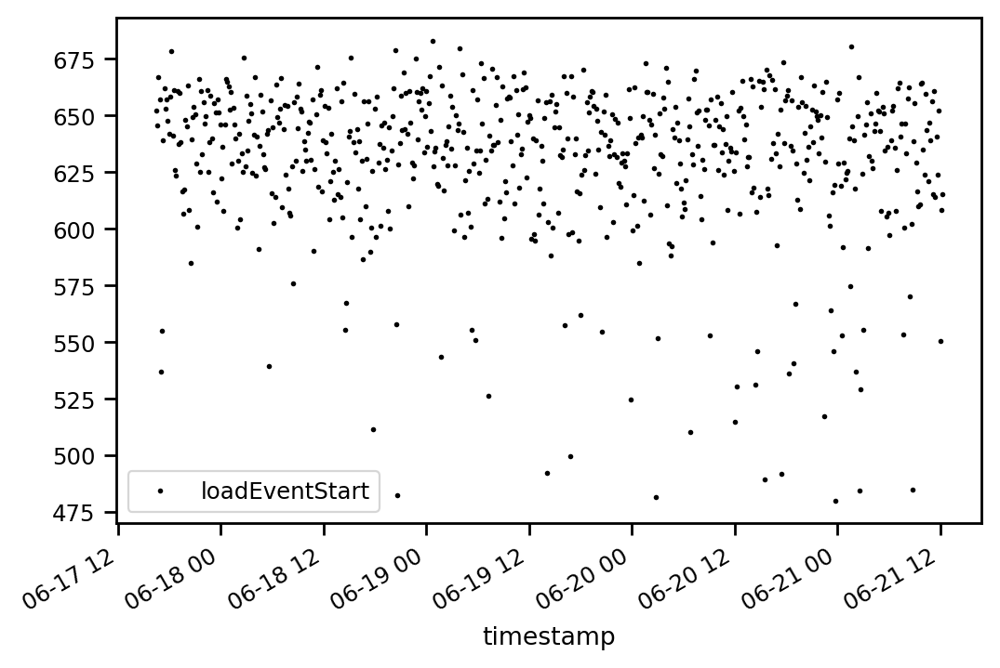

In [1119]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'cable') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

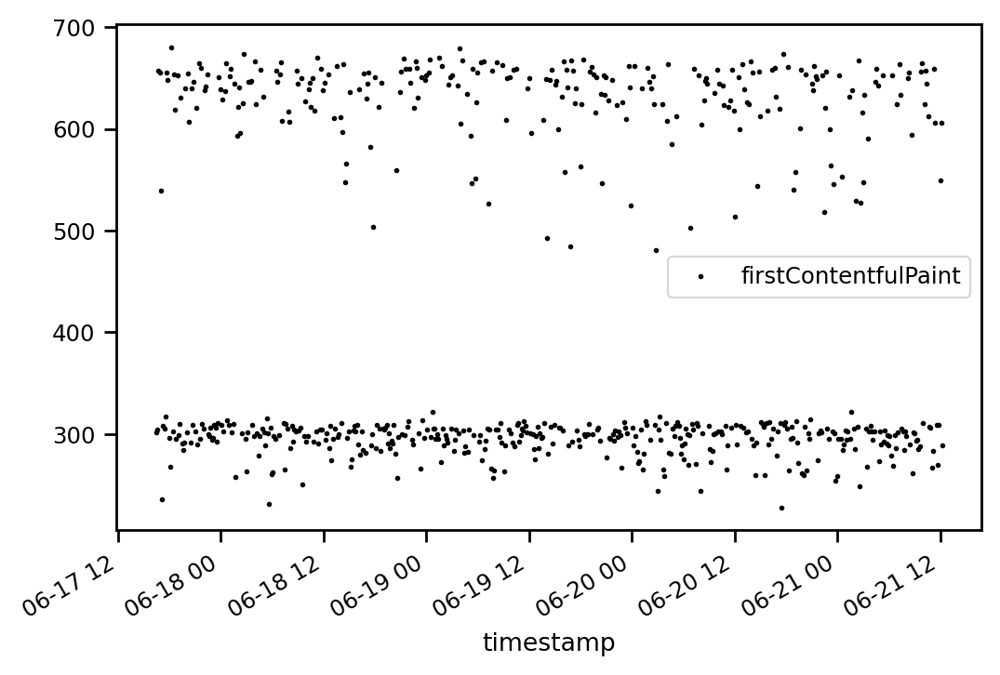

In [1120]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'cable') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1121]:
#cable_msms=['25043c95-126c-4a50-91f2-3a248f2840a1', 
#           '1a674496-67b0-4f9b-953e-8753f95b0dc5',
#           '39485fb3-aba4-4530-9069-c1aa2194c36d',
#           'c0d8523a-aa0a-4df5-9889-5aa0c4db4b40',
#           '37b9ac16-7359-4fa5-9e15-22a7bd8fa85a',
#           '7e3fafbf-e74b-4365-9de0-553a276057ce']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(cable_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

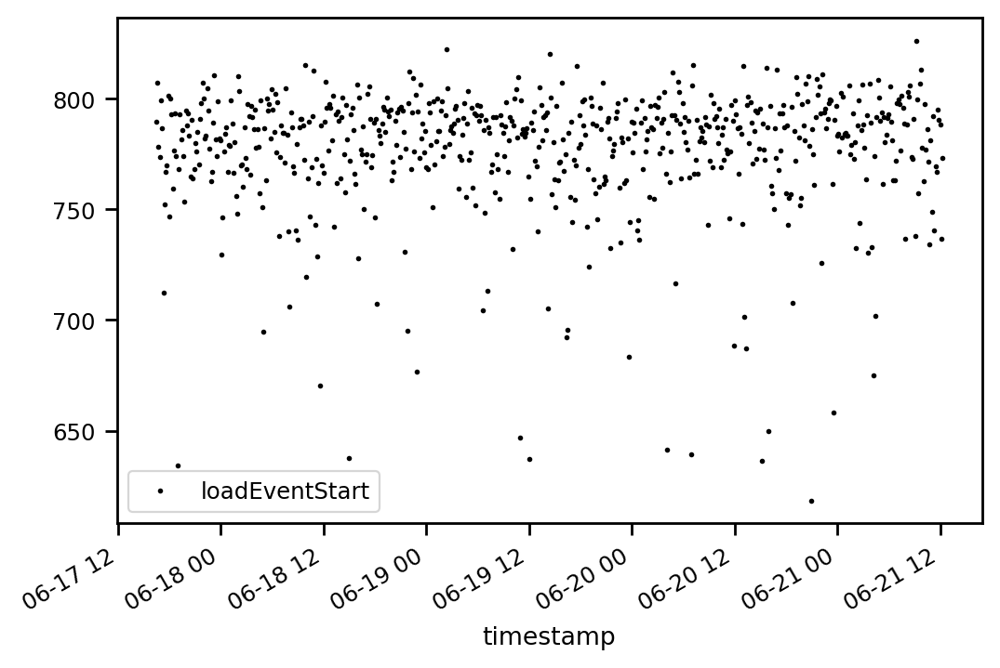

In [1122]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

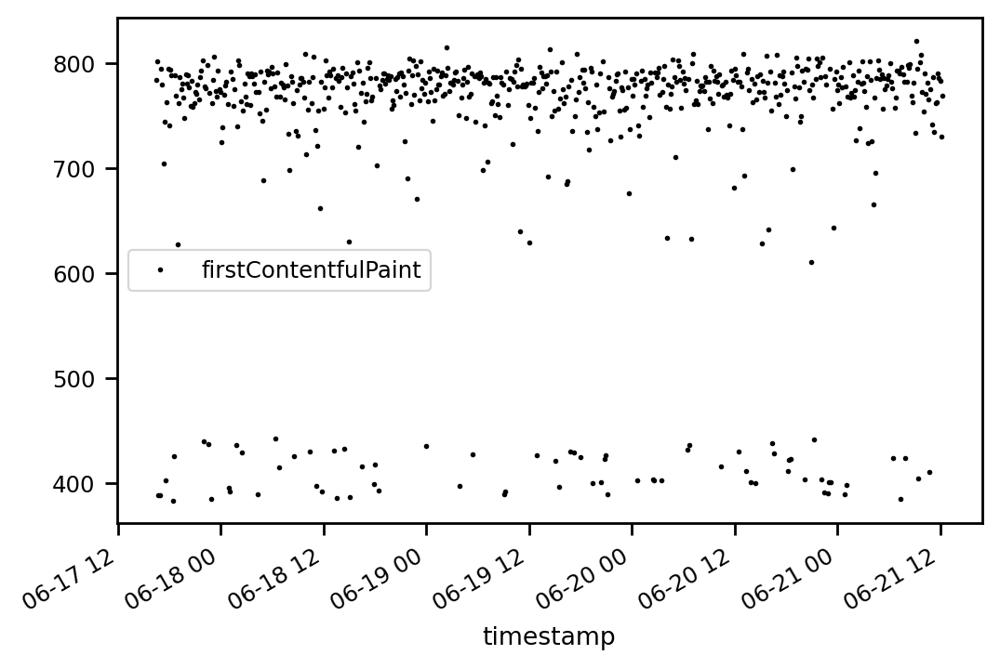

In [1123]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1124]:
#lte_msms=['76f85d7f-927c-47fd-a72a-f2f9bb36e393', 
#           '494500df-6fa3-4ec1-8d0e-d86479dbfcc2',
#           'd66574f5-2ef4-479c-9a53-d1e520c40e3b',
#           '6462d64e-715f-41f8-8bf1-cbaae877b8ee',
#           'c628eb84-a78a-401e-b29b-08f358592902',
#           'cb5fe4a3-1fe7-4443-aa45-b598ba2ba0e3']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(lte_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

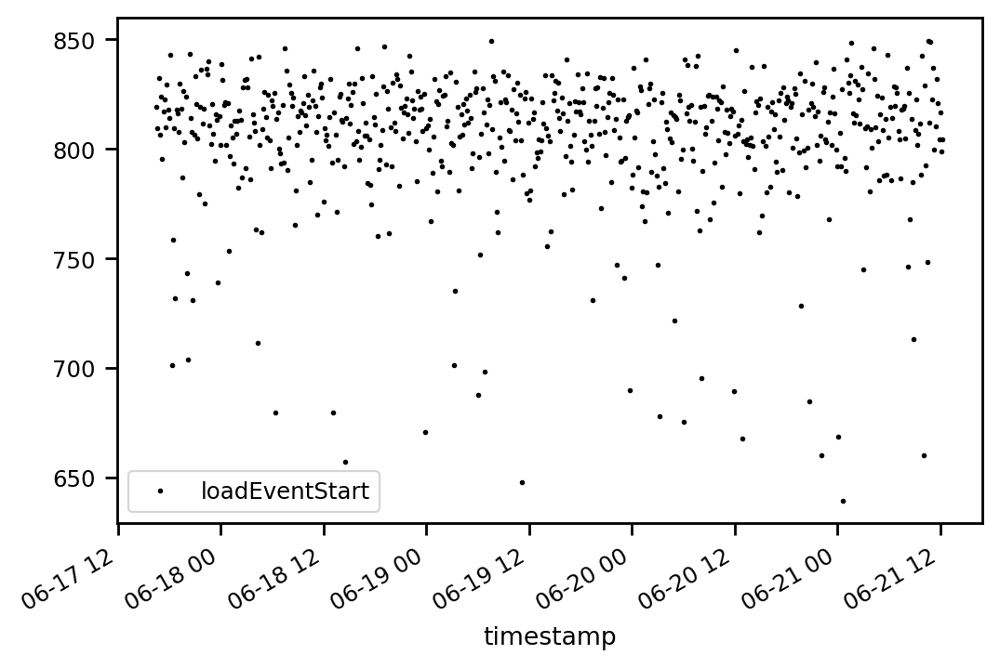

In [1125]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g-medium') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

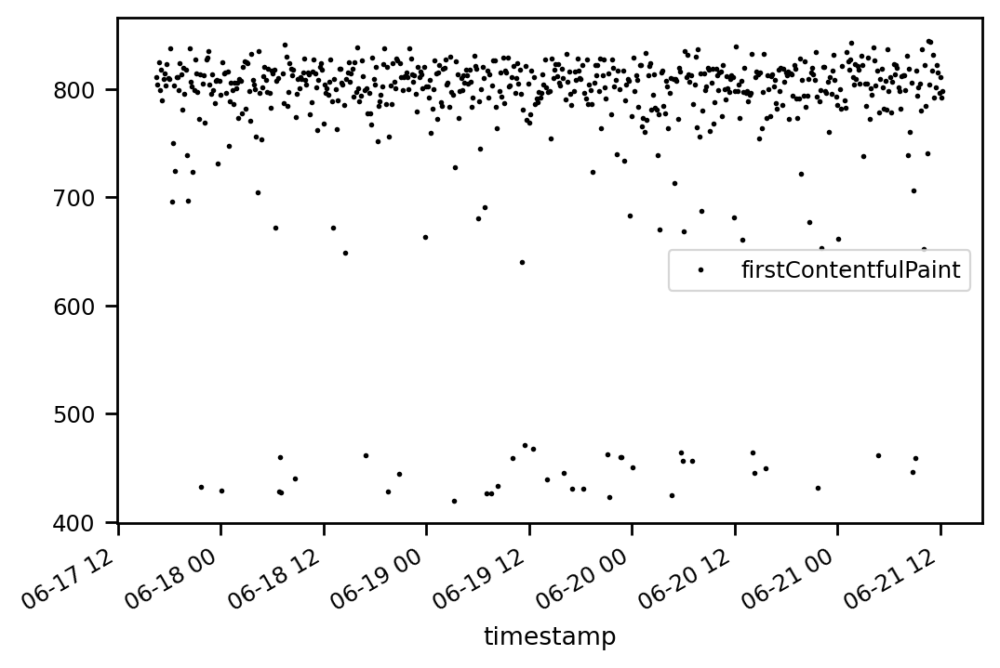

In [1126]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g-medium') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

dsl
count    659.000000
mean     338.043730
std        4.619837
min      315.009953
10%      332.936139
20%      335.192929
25%      336.010411
30%      336.569435
40%      337.580377
50%      338.515309
60%      339.319037
70%      340.476169
75%      341.193686
80%      341.834630
90%      343.246157
100%     349.587349
max      349.587349
Name: full_fcp, dtype: float64
count    659.000000
mean     313.366795
std        3.736832
min      302.413616
10%      309.264476
20%      310.605402
25%      311.112932
30%      311.496510
40%      312.350242
50%      313.214579
60%      314.216903
70%      315.071223
75%      315.516045
80%      316.032575
90%      317.602304
100%     358.942222
max      358.942222
Name: full_fcp, dtype: float64
count    659.000000
mean     362.154681
std        4.534141
min      340.697799
10%      357.455789
20%      359.316377
25%      360.139550
30%      360.613215
40%      361.597050
50%      362.568693
60%      363.337485
70%      364.363102
75%      365.2

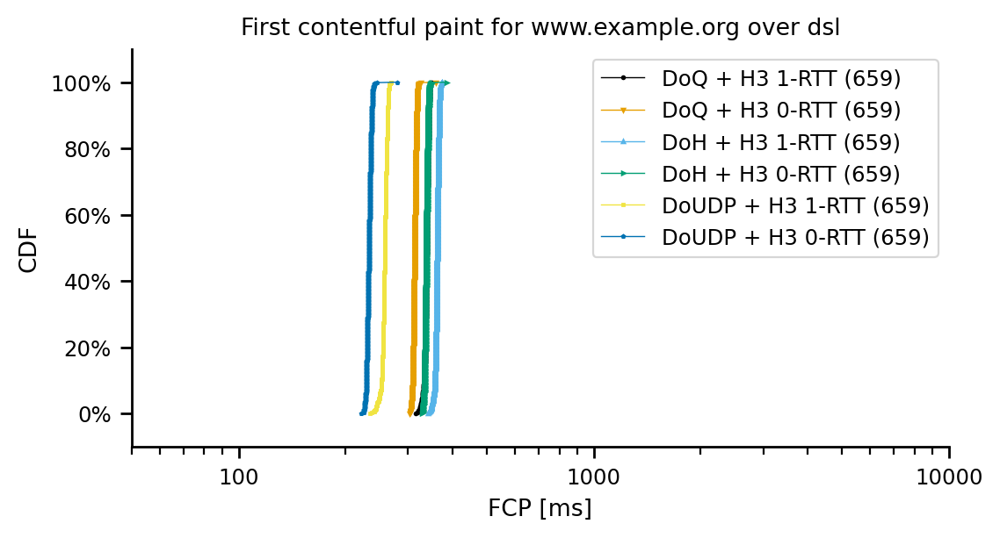

count    658.000000
mean     636.634154
std      169.397181
min      440.377175
10%      471.717699
20%      483.902282
25%      487.811494
30%      489.569938
40%      493.969312
50%      499.067115
60%      791.115105
70%      821.380725
75%      826.201820
80%      831.603131
90%      841.857500
100%     873.117532
max      873.117532
Name: full_fcp, dtype: float64
count    658.000000
mean     608.768500
std      169.971063
min      403.497635
10%      447.184681
20%      457.833355
25%      460.570955
30%      462.734986
40%      466.976419
50%      470.563310
60%      764.663705
70%      796.436808
75%      801.089674
80%      806.974930
90%      815.824408
100%     848.906181
max      848.906181
Name: full_fcp, dtype: float64
count    658.000000
mean     660.674970
std      169.374328
min      463.301644
10%      495.226660
20%      508.071726
25%      511.646007
30%      514.022473
40%      518.172907
50%      522.853394
60%      815.417645
70%      845.560446
75%      850.37813

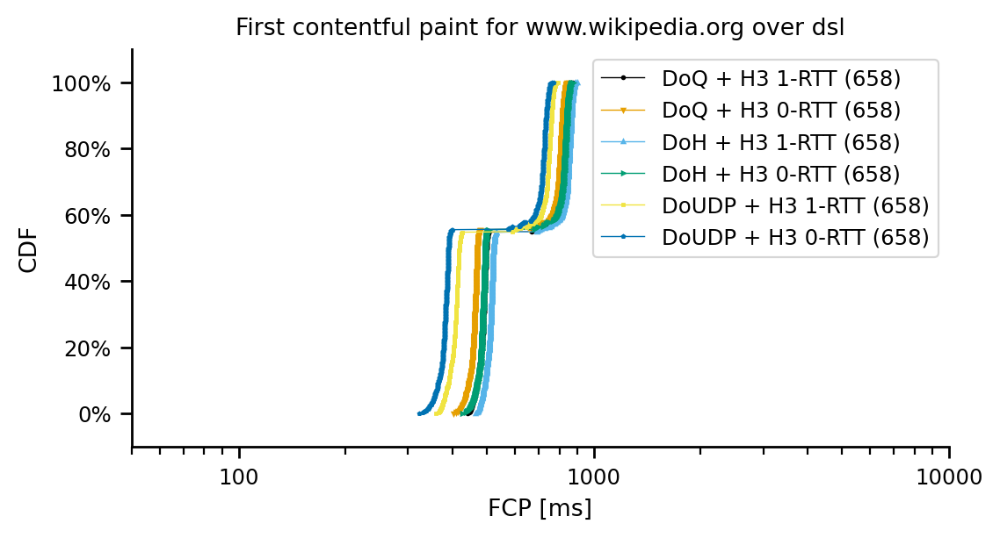

count    658.000000
mean     344.826413
std        7.002354
min      322.600469
10%      336.069661
20%      338.631705
25%      339.490848
30%      340.552351
40%      342.689196
50%      344.701344
60%      346.352821
70%      348.466292
75%      349.941283
80%      351.787928
90%      354.723040
100%     362.329631
max      362.329631
Name: full_fcp, dtype: float64
count    658.000000
mean     317.310759
std        6.274422
min      303.191991
10%      309.335269
20%      311.022758
25%      312.131122
30%      313.168917
40%      315.393335
50%      317.045161
60%      318.920322
70%      321.087888
75%      322.054544
80%      323.041865
90%      326.095849
100%     334.844717
max      334.844717
Name: full_fcp, dtype: float64
count    658.000000
mean     368.906699
std        6.970531
min      345.753582
10%      360.417791
20%      362.738288
25%      363.664265
30%      364.676626
40%      366.972864
50%      368.662675
60%      370.523558
70%      372.544656
75%      374.10444

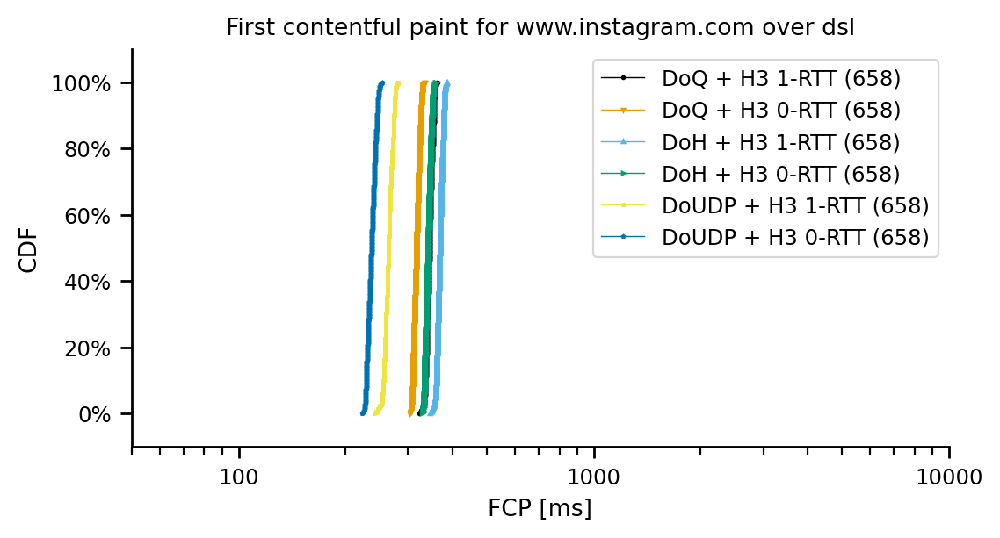

cable
count    659.000000
mean     212.882719
std        3.429937
min      201.117665
10%      208.372840
20%      210.043234
25%      210.600280
30%      211.160202
40%      212.051173
50%      212.915022
60%      213.749331
70%      214.568698
75%      215.234786
80%      215.868155
90%      217.341507
100%     224.242056
max      224.242056
Name: full_fcp, dtype: float64
count    659.000000
mean     200.328395
std        3.324791
min      190.731725
10%      195.961087
20%      197.444190
25%      197.967264
30%      198.551248
40%      199.454474
50%      200.285862
60%      201.103586
70%      201.967405
75%      202.580304
80%      203.243066
90%      204.664266
100%     214.172400
max      214.172400
Name: full_fcp, dtype: float64
count    659.000000
mean     236.373730
std        3.415019
min      224.718049
10%      232.014603
20%      233.494010
25%      234.090518
30%      234.579562
40%      235.416716
50%      236.335868
60%      237.159695
70%      238.008711
75%      238

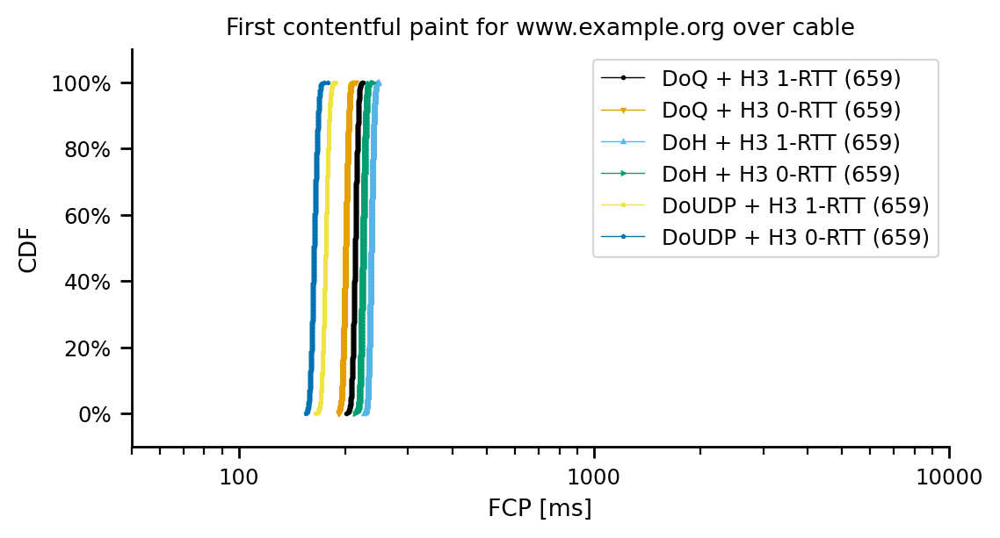

count    658.000000
mean     492.434960
std      166.942593
min      291.171079
10%      345.273770
20%      356.595573
25%      358.960772
30%      362.239987
40%      366.197670
50%      370.776330
60%      540.261009
70%      684.199139
75%      696.281425
80%      707.462449
90%      719.249497
100%     743.149988
max      743.149988
Name: full_fcp, dtype: float64
count    658.000000
mean     489.006540
std      171.902211
min      296.421003
10%      328.698558
20%      341.600064
25%      344.457703
30%      347.024256
40%      351.213172
50%      355.942998
60%      643.696730
70%      681.197241
75%      687.630244
80%      691.473150
90%      705.163645
100%     728.377473
max      728.377473
Name: full_fcp, dtype: float64
count    658.000000
mean     515.910509
std      166.924873
min      315.621767
10%      369.079403
20%      379.717136
25%      382.474509
30%      385.547642
40%      389.878030
50%      393.786389
60%      567.849362
70%      707.251795
75%      719.86671

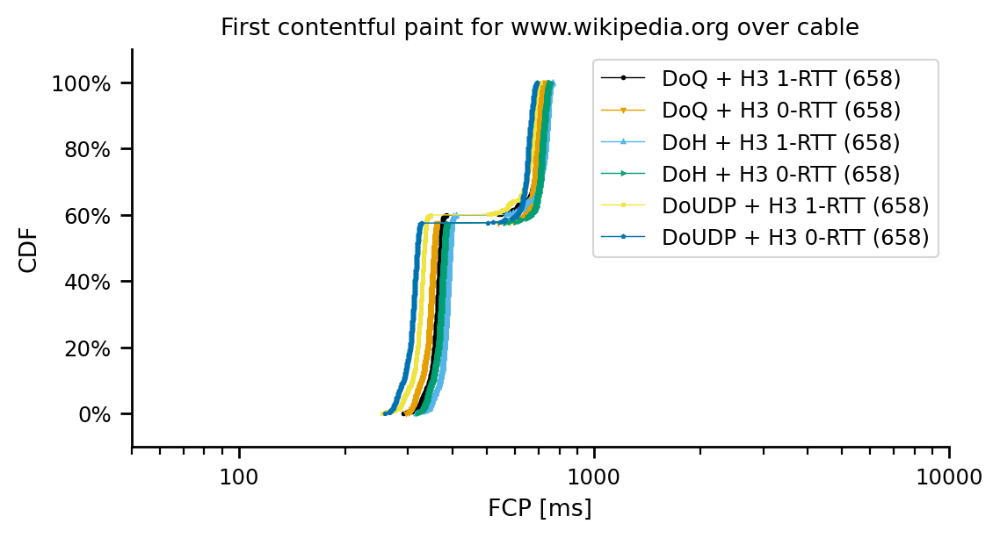

count    658.000000
mean     220.150818
std        6.106545
min      203.475569
10%      212.015174
20%      213.880566
25%      215.351148
30%      216.491435
40%      218.671558
50%      220.661712
60%      222.187000
70%      224.281254
75%      225.007629
80%      226.050666
90%      227.929253
100%     238.934202
max      238.934202
Name: full_fcp, dtype: float64
count    658.000000
mean     204.652033
std        6.121646
min      191.187810
10%      196.936203
20%      198.934039
25%      199.796731
30%      200.724730
40%      202.620814
50%      204.426633
60%      206.046642
70%      207.962047
75%      209.114903
80%      210.711500
90%      212.925880
100%     239.186912
max      239.186912
Name: full_fcp, dtype: float64
count    658.000000
mean     243.638667
std        6.044924
min      225.218900
10%      235.501009
20%      237.339868
25%      238.827239
30%      240.110556
40%      242.004127
50%      243.930347
60%      245.687783
70%      247.459144
75%      248.60732

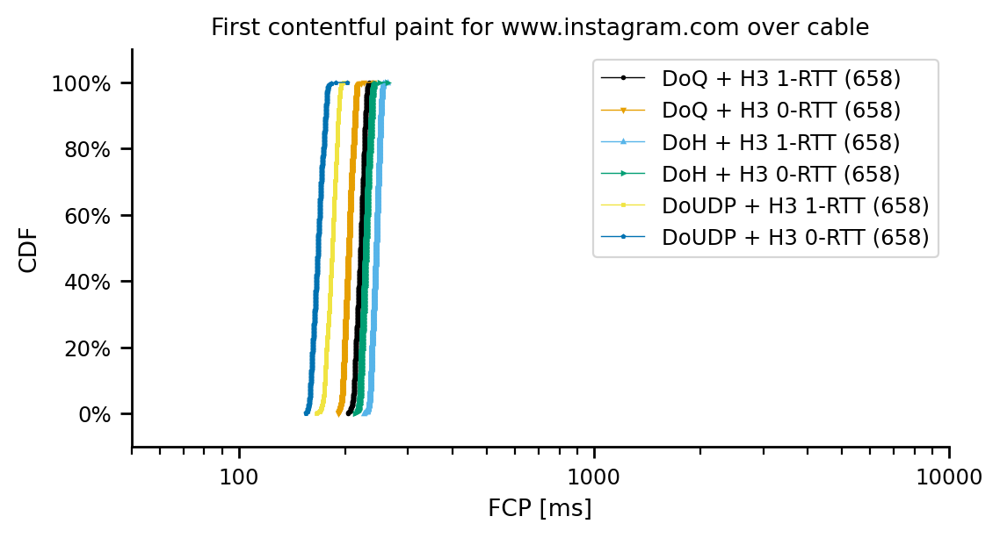

fiber
count    659.000000
mean     168.210907
std        3.719730
min      155.929826
10%      163.314666
20%      165.061902
25%      165.712976
30%      166.377978
40%      167.325360
50%      168.236786
60%      169.049341
70%      170.002288
75%      170.745194
80%      171.396823
90%      173.215053
100%     177.645306
max      177.645306
Name: full_fcp, dtype: float64
count    659.000000
mean     157.477371
std        3.814839
min      145.282997
10%      152.605435
20%      154.345689
25%      155.072902
30%      155.545387
40%      156.423202
50%      157.398380
60%      158.380900
70%      159.541830
75%      160.080072
80%      160.785121
90%      162.400668
100%     174.697158
max      174.697158
Name: full_fcp, dtype: float64
count    659.000000
mean     182.143158
std        3.590589
min      169.989280
10%      177.425265
20%      179.144138
25%      179.689694
30%      180.426090
40%      181.413564
50%      182.056038
60%      182.956103
70%      184.074288
75%      184

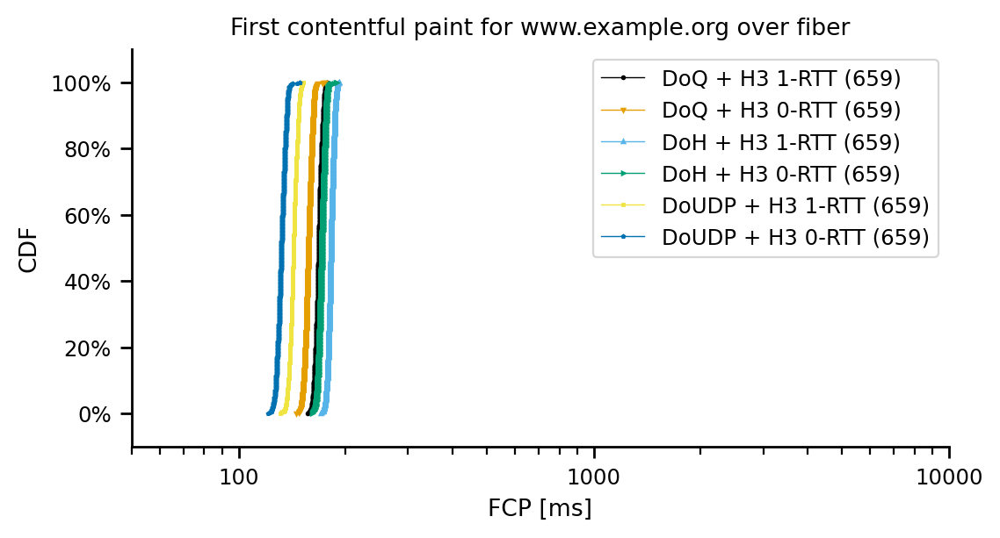

count    658.000000
mean     456.299073
std      168.852704
min      255.395751
10%      296.792616
20%      311.203519
25%      314.421406
30%      316.519153
40%      321.740075
50%      325.629950
60%      608.017725
70%      643.860454
75%      650.949122
80%      655.728889
90%      667.776370
100%     690.893216
max      690.893216
Name: full_fcp, dtype: float64
count    658.000000
mean     550.827037
std      145.647097
min      235.329212
10%      282.938548
20%      301.442557
25%      542.704989
30%      596.163844
40%      617.569522
50%      627.841316
60%      632.426041
70%      638.338561
75%      641.367042
80%      643.900848
90%      651.602224
100%     675.803834
max      675.803834
Name: full_fcp, dtype: float64
count    658.000000
mean     470.284843
std      168.897721
min      268.157634
10%      310.581474
20%      325.356505
25%      328.851008
30%      330.810032
40%      334.645613
50%      339.635744
60%      622.278480
70%      657.192242
75%      665.10940

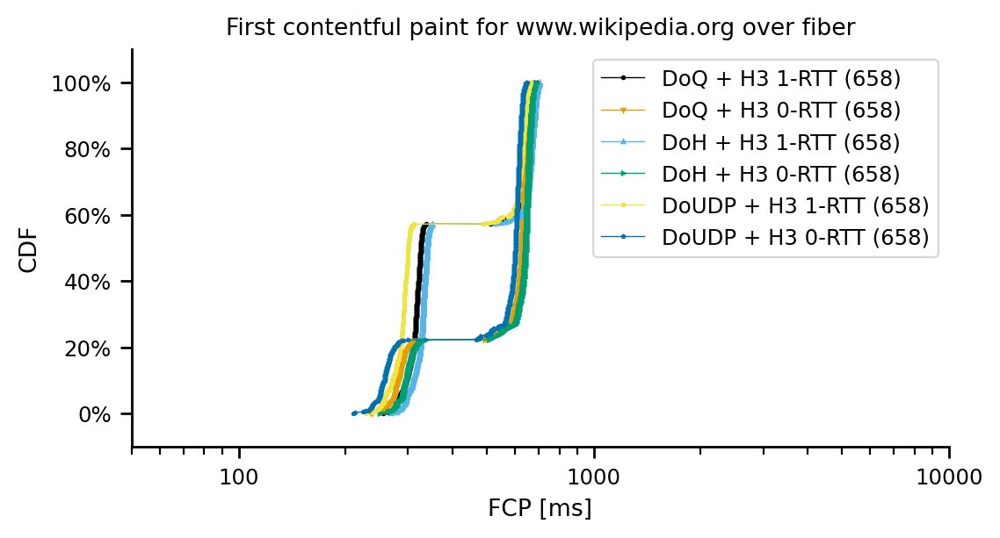

count    658.000000
mean     174.233602
std        6.164056
min      159.266151
10%      166.579538
20%      168.521406
25%      169.232382
30%      170.400573
40%      172.418075
50%      174.304016
60%      175.804512
70%      177.795400
75%      178.972273
80%      180.207922
90%      182.389197
100%     190.129072
max      190.129072
Name: full_fcp, dtype: float64
count    658.000000
mean     152.945304
std        2.905812
min      143.897697
10%      149.595629
20%      151.058573
25%      151.431543
30%      151.670578
40%      152.228353
50%      153.033397
60%      153.514325
70%      154.073265
75%      154.471378
80%      154.840832
90%      155.948272
100%     175.107293
max      175.107293
Name: full_fcp, dtype: float64
count    658.000000
mean     188.199080
std        6.123835
min      172.411340
10%      180.497754
20%      182.427422
25%      183.534290
30%      184.294712
40%      186.375027
50%      188.183637
60%      189.523690
70%      191.637539
75%      193.19116

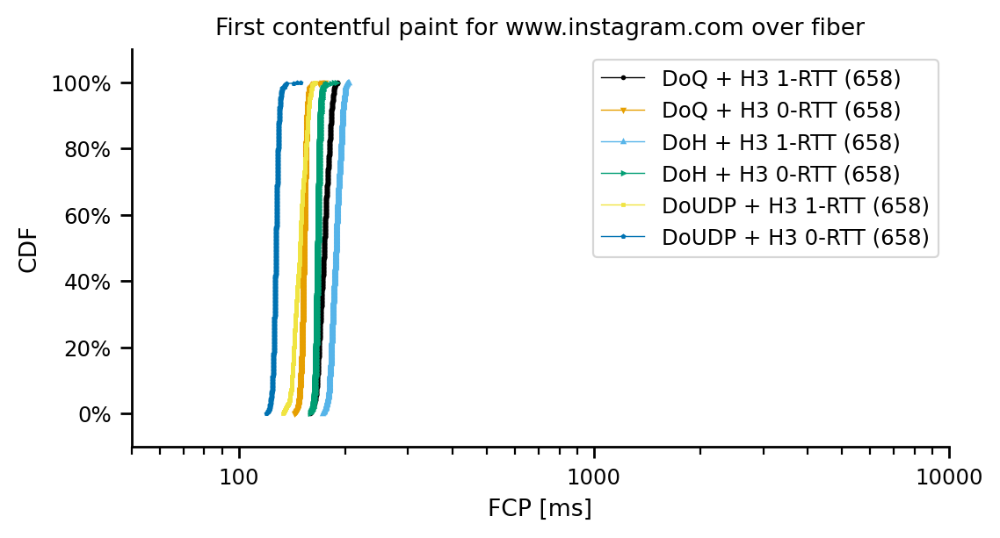

4g
count    659.000000
mean     480.045166
std        3.589883
min      466.580855
10%      475.507941
20%      476.997629
25%      477.577101
30%      478.137134
40%      479.067254
50%      480.016353
60%      480.718536
70%      481.697983
75%      482.443998
80%      483.191478
90%      484.746663
100%     495.886833
max      495.886833
Name: full_fcp, dtype: float64
count    659.000000
mean     466.608292
std        3.138591
min      458.687746
10%      462.387490
20%      463.885965
25%      464.328647
30%      465.000473
40%      465.838444
50%      466.647108
60%      467.421082
70%      468.365031
75%      468.819865
80%      469.266506
90%      470.720949
100%     475.760999
max      475.760999
Name: full_fcp, dtype: float64
count    659.000000
mean     570.931739
std        3.508641
min      558.127530
10%      566.658021
20%      567.965044
25%      568.590165
30%      569.095443
40%      570.010740
50%      570.783930
60%      571.647036
70%      572.554224
75%      573.19

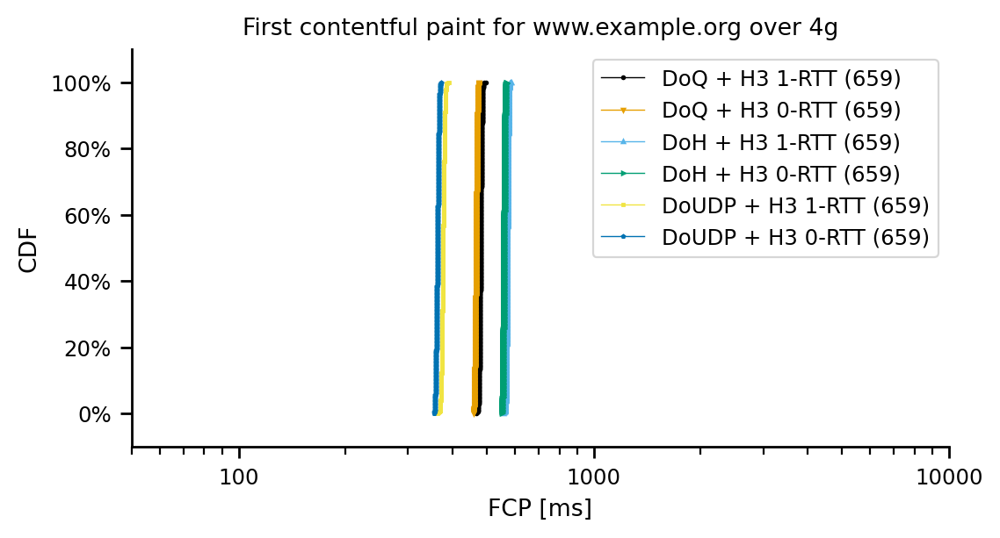

count     658.000000
mean      927.588028
std       116.871402
min       579.959868
10%       632.019572
20%       936.597810
25%       950.598157
30%       957.036690
40%       965.685123
50%       972.630671
60%       977.643096
70%       981.462261
75%       983.069177
80%       985.355949
90%       990.543105
100%     1018.733567
max      1018.733567
Name: full_fcp, dtype: float64
count    658.000000
mean     908.723135
std      120.234326
min      561.744039
10%      612.866221
20%      918.556053
25%      931.572495
30%      938.904538
40%      948.207112
50%      955.736940
60%      961.939653
70%      965.563396
75%      967.622319
80%      969.455248
90%      975.331918
100%     995.866771
max      995.866771
Name: full_fcp, dtype: float64
count     658.000000
mean     1018.554069
std       116.881708
min       672.342009
10%       722.961103
20%      1026.751278
25%      1042.041692
30%      1048.214870
40%      1057.228843
50%      1063.579724
60%      1068.463665
70%      1

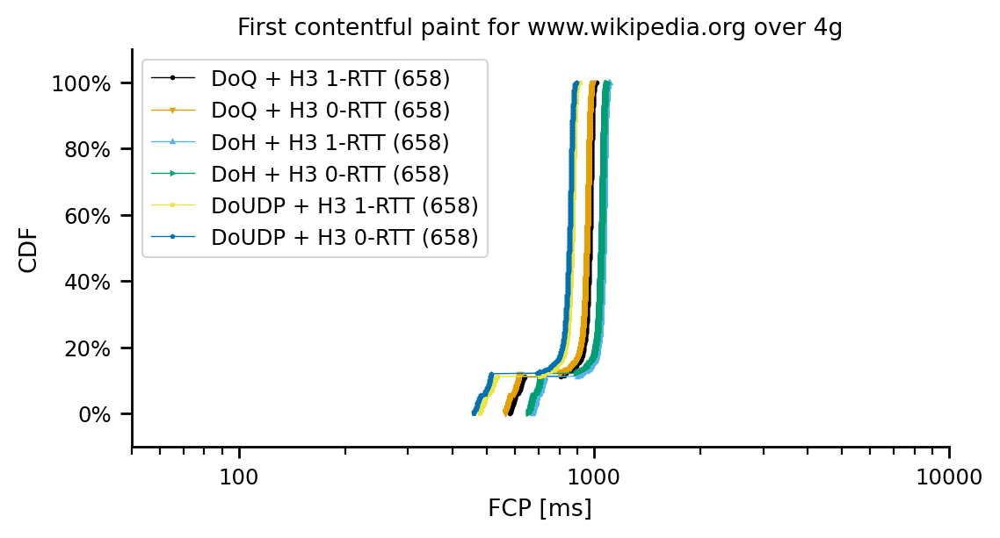

count    658.000000
mean     486.567517
std        6.531315
min      470.370462
10%      478.258284
20%      480.510483
25%      481.623118
30%      482.523284
40%      484.273536
50%      486.149334
60%      488.079027
70%      489.861291
75%      491.099930
80%      492.899472
90%      495.821979
100%     505.686547
max      505.686547
Name: full_fcp, dtype: float64
count    658.000000
mean     470.852168
std        6.198567
min      457.808759
10%      462.745335
20%      464.885117
25%      465.953793
30%      467.022214
40%      468.933836
50%      470.492374
60%      472.127690
70%      474.218930
75%      475.647799
80%      477.365315
90%      479.177581
100%     489.695379
max      489.695379
Name: full_fcp, dtype: float64
count    658.000000
mean     577.492127
std        6.475236
min      562.519448
10%      569.036882
20%      571.388208
25%      572.595792
30%      573.344425
40%      575.285003
50%      577.111124
60%      579.098894
70%      580.855580
75%      582.07706

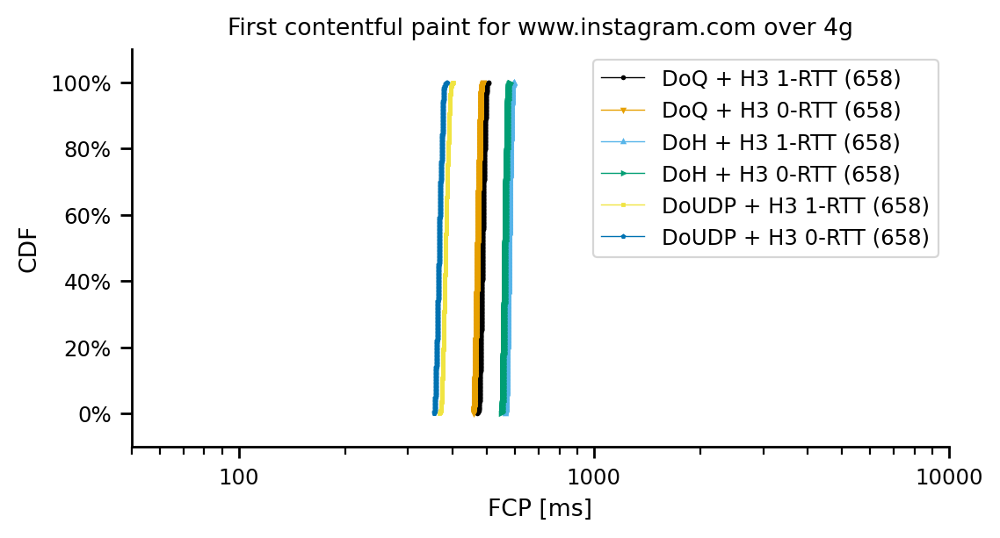

4g-medium
count    659.000000
mean     537.736610
std        3.739518
min      521.510362
10%      533.420160
20%      534.989905
25%      535.450466
30%      536.029352
40%      536.923989
50%      537.663146
60%      538.581475
70%      539.522125
75%      540.063729
80%      540.610650
90%      541.953855
100%     579.115298
max      579.115298
Name: full_fcp, dtype: float64
count    659.000000
mean     524.378947
std        3.272206
min      513.833079
10%      520.365192
20%      521.506498
25%      522.109236
30%      522.641594
40%      523.441408
50%      524.275185
60%      525.165038
70%      526.171350
75%      526.811131
80%      527.335928
90%      528.804334
100%     533.020216
max      533.020216
Name: full_fcp, dtype: float64
count    659.000000
mean     638.760118
std        3.731375
min      624.599846
10%      634.507317
20%      636.013443
25%      636.441180
30%      637.058830
40%      638.043724
50%      638.680992
60%      639.274749
70%      640.389874
75%     

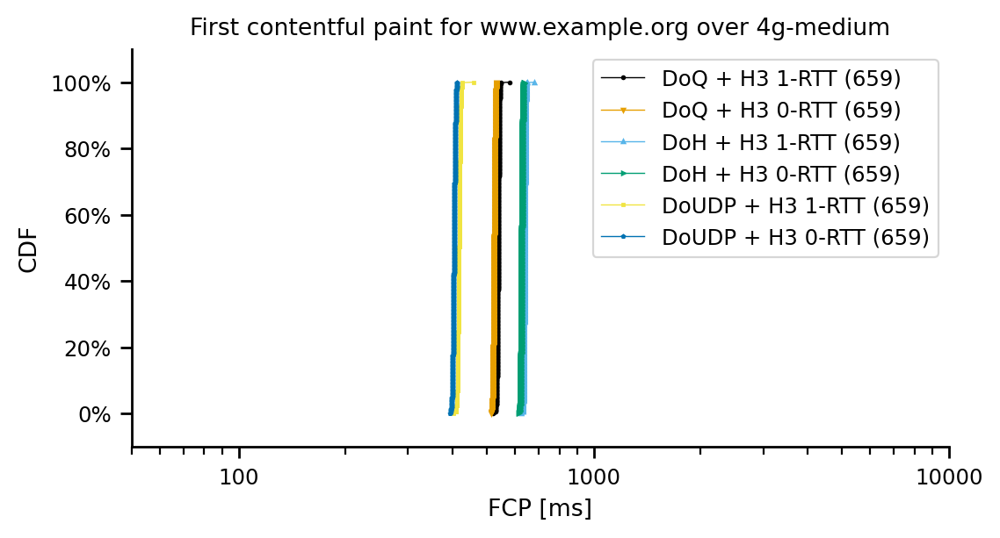

count     658.000000
mean     1004.638877
std        86.463386
min       644.851408
10%       961.795135
20%      1005.571968
25%      1011.578943
30%      1017.549537
40%      1024.204562
50%      1030.245322
60%      1034.880662
70%      1039.650800
75%      1041.808477
80%      1044.116632
90%      1050.492817
100%     1070.017921
max      1070.017921
Name: full_fcp, dtype: float64
count     658.000000
mean      982.324287
std        96.459475
min       628.975042
10%       913.113524
20%       988.166294
25%       995.491207
30%      1000.489808
40%      1009.186489
50%      1014.082984
60%      1018.077824
70%      1022.246981
75%      1024.154656
80%      1026.844238
90%      1033.334581
100%     1055.502824
max      1055.502824
Name: full_fcp, dtype: float64
count     658.000000
mean     1105.728653
std        86.405736
min       746.312033
10%      1063.283252
20%      1106.816181
25%      1112.717009
30%      1118.908181
40%      1125.179196
50%      1131.125921
60%      1136.

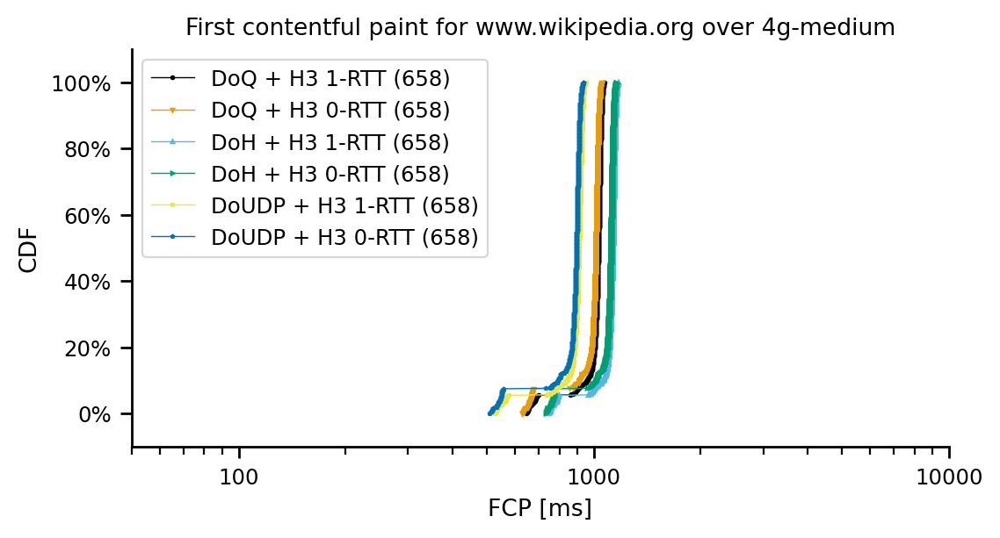

count    658.000000
mean     544.231382
std        6.395699
min      528.941562
10%      536.582144
20%      538.449710
25%      539.256336
30%      539.909289
40%      541.892464
50%      543.715820
60%      545.609924
70%      547.453393
75%      548.988937
80%      550.360290
90%      553.199328
100%     566.522648
max      566.522648
Name: full_fcp, dtype: float64
count    658.000000
mean     528.853267
std        6.197504
min      515.458963
10%      521.011134
20%      522.952932
25%      523.795686
30%      524.527199
40%      526.484930
50%      528.605453
60%      530.242690
70%      532.097836
75%      533.472658
80%      534.993855
90%      538.016016
100%     544.484196
max      544.484196
Name: full_fcp, dtype: float64
count    658.000000
mean     645.256890
std        6.359083
min      631.436257
10%      637.545007
20%      639.326212
25%      640.162434
30%      641.096974
40%      643.134307
50%      644.865140
60%      646.520664
70%      648.473504
75%      649.84545

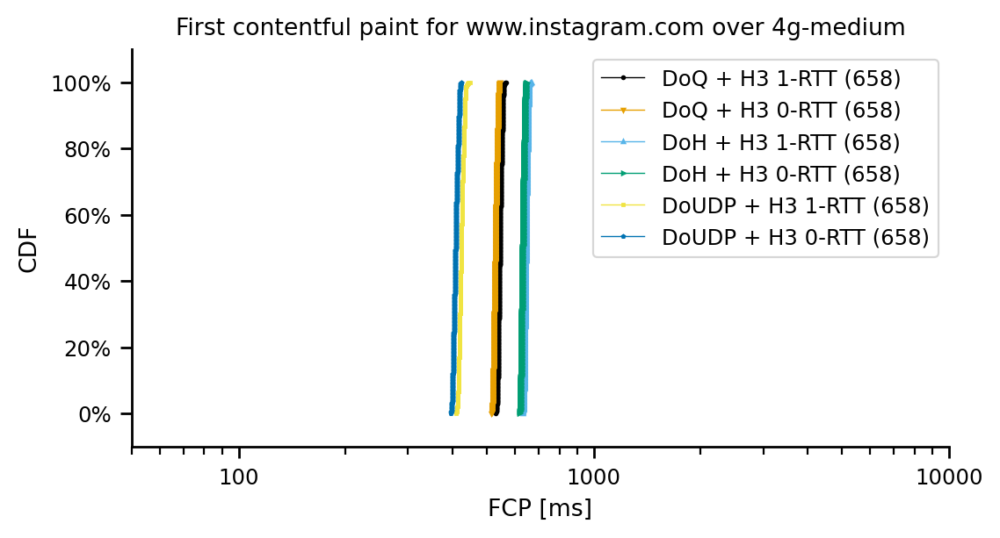

In [1127]:
for access_technology in df_dns_and_h3.experiment_type.unique():
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in df_plt['website'].unique():
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=True
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                print(df_tmp['full_fcp'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(50,10000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [1128]:
df_dns_and_h3.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoUDP + H3 1-RTT',
       'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'],
      dtype=object)

In [1129]:
df_diff_plt_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_plt'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_udp.columns)
            df_diff_plt_udp = df_diff_plt_udp.append(next_df_series, ignore_index=True)
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.839656,31.904282,41.451345,dsl,www.example.org
1,7.109167,10.798591,13.981977,dsl,www.wikipedia.org
2,2.887905,4.483575,5.837323,dsl,www.instagram.com
3,14.397443,21.811607,35.623982,cable,www.example.org
4,3.424639,5.572759,9.097122,cable,www.wikipedia.org
5,2.862374,5.214944,8.507665,cable,www.instagram.com
6,11.380928,21.261553,32.268771,fiber,www.example.org
7,-0.062568,4.003151,6.250505,fiber,www.wikipedia.org
8,1.118072,3.879112,6.021984,fiber,www.instagram.com
9,24.443329,27.947283,52.489819,4g,www.example.org


In [1130]:
df_diff_plt_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_plt'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_quic.columns)
            df_diff_plt_quic = df_diff_plt_quic.append(next_df_series, ignore_index=True)
df_diff_plt_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.924916,8.260551,16.096310,dsl,www.example.org
1,-6.637310,3.444545,6.416640,dsl,www.wikipedia.org
2,-2.806846,1.550883,2.866633,dsl,www.instagram.com
3,-12.585459,6.481058,18.555082,cable,www.example.org
4,-3.311241,2.076990,5.484654,cable,www.wikipedia.org
5,-2.782722,2.287105,5.488199,cable,www.instagram.com
6,-10.218023,8.871020,18.753518,fiber,www.example.org
7,0.062607,4.068265,6.317025,fiber,www.wikipedia.org
8,-1.105710,2.730511,4.849689,fiber,www.instagram.com
9,-19.642137,2.815702,22.537560,4g,www.example.org


In [1131]:
df_diff_fcp_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_fcp'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_udp.columns)
            df_diff_fcp_udp = df_diff_fcp_udp.append(next_df_series, ignore_index=True)
df_diff_fcp_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.363829,31.167310,40.487473,dsl,www.example.org
1,12.518383,19.334048,25.021686,dsl,www.wikipedia.org
2,19.975263,30.440832,39.508206,dsl,www.instagram.com
3,13.828352,21.005876,34.316632,cable,www.example.org
4,6.709151,11.156078,18.054328,cable,www.wikipedia.org
5,11.404165,20.251619,32.932075,cable,www.instagram.com
6,10.272581,17.865918,27.547622,fiber,www.example.org
7,109.074828,8.436676,13.100688,fiber,www.wikipedia.org
8,2.877570,17.176864,26.507518,fiber,www.instagram.com
9,23.958491,27.509850,51.621029,4g,www.example.org


In [1132]:
df_diff_fcp_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_fcp'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_quic.columns)
            df_diff_fcp_quic = df_diff_fcp_quic.append(next_df_series, ignore_index=True)
df_diff_fcp_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.603127,8.077762,15.757285,dsl,www.example.org
1,-11.125633,6.057379,11.112231,dsl,www.wikipedia.org
2,-16.649485,8.723105,16.280808,dsl,www.instagram.com
3,-12.148425,6.305567,17.999276,cable,www.example.org
4,-6.287325,4.167334,10.631868,cable,www.wikipedia.org
5,-10.236749,7.941763,19.324152,cable,www.instagram.com
6,-9.315626,6.885970,15.665764,fiber,www.example.org
7,-52.170234,-48.134992,-45.904206,fiber,www.wikipedia.org
8,-2.797082,13.899331,22.968999,fiber,www.instagram.com
9,-19.327834,2.864958,22.315969,4g,www.example.org


DoQ + H3 0-RTT
count    15.000000
mean      9.902228
std       8.415733
min      -0.062568
10%       1.815793
20%       2.882798
25%       3.156272
30%       3.892878
40%       6.027234
50%       7.109167
60%      10.469824
70%      11.365376
75%      12.889186
80%      15.885886
90%      23.401860
100%     25.947710
max      25.947710
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean     13.771020
std       9.973899
min       3.879112
10%       4.195321
20%       5.068670
25%       5.393851
30%       6.013274
40%       7.797828
50%      10.798591
60%      12.326278
70%      19.631292
75%      21.536580
80%      23.038742
90%      28.690754
100%     31.904282
max      31.904282
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     22.701506
std      16.671855
min       5.837323
10%       6.113392
20%       8.056233
25%       8.802394
30%      10.074093
40%      14.225319
50%      14.639600
60%      22.930822
70%      30.635631
75%    

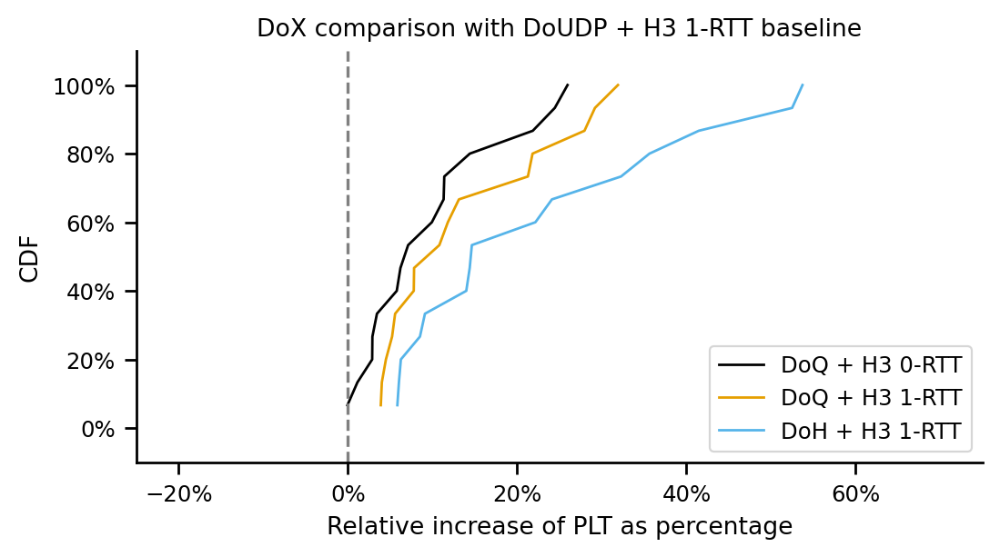

In [1133]:
df_tmp = df_diff_plt_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-25, 75)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    15.000000
mean     -8.534660
std       6.665085
min     -20.601970
10%     -18.955249
20%     -13.653350
25%     -11.401741
30%     -10.205477
40%      -9.474117
50%      -6.637310
60%      -5.684227
70%      -3.739294
75%      -3.059043
80%      -2.802021
90%      -1.776514
100%      0.062607
max       0.062607
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean      3.461186
std       2.436379
min       1.517228
10%       1.579957
20%       1.699870
25%       1.809451
30%       1.935363
40%       2.203059
50%       2.571457
60%       2.764587
70%       3.318776
75%       3.756405
80%       4.550823
90%       7.548754
100%      8.871020
max       8.871020
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     11.209306
std       6.672137
min       2.866633
10%       5.103675
20%       5.487490
25%       5.902612
30%       6.336948
40%       7.191475
50%       8.390013
60%      11.278889
70%      15.177056
75%

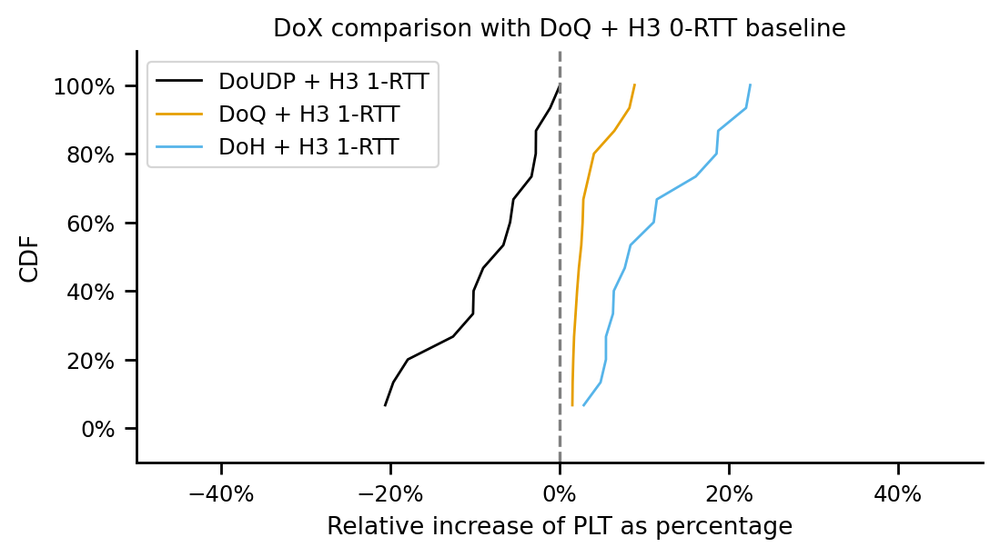

In [1134]:
df_tmp = df_diff_plt_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-50, 50)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    15.000000
mean    -15.719534
std      11.427541
min     -52.170234
10%     -20.134939
20%     -19.428513
25%     -18.993490
30%     -18.447943
40%     -17.030942
50%     -12.148425
60%     -10.783641
70%     -10.243530
75%      -9.776187
80%      -9.259111
90%      -7.385617
100%     -2.797082
max      -2.797082
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean      1.925967
std      14.242334
min     -48.134992
10%       1.663318
20%       2.396413
25%       2.706074
30%       2.859819
40%       3.142652
50%       4.167334
60%       6.156654
70%       6.769890
75%       7.413867
80%       7.968963
90%       8.464968
100%     13.899331
max      13.899331
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     13.030273
std      16.929706
min     -45.904206
10%      10.824014
20%      11.249431
25%      11.412741
30%      12.366554
40%      15.720676
50%      16.280808
60%      18.529227
70%      21.322198
75%

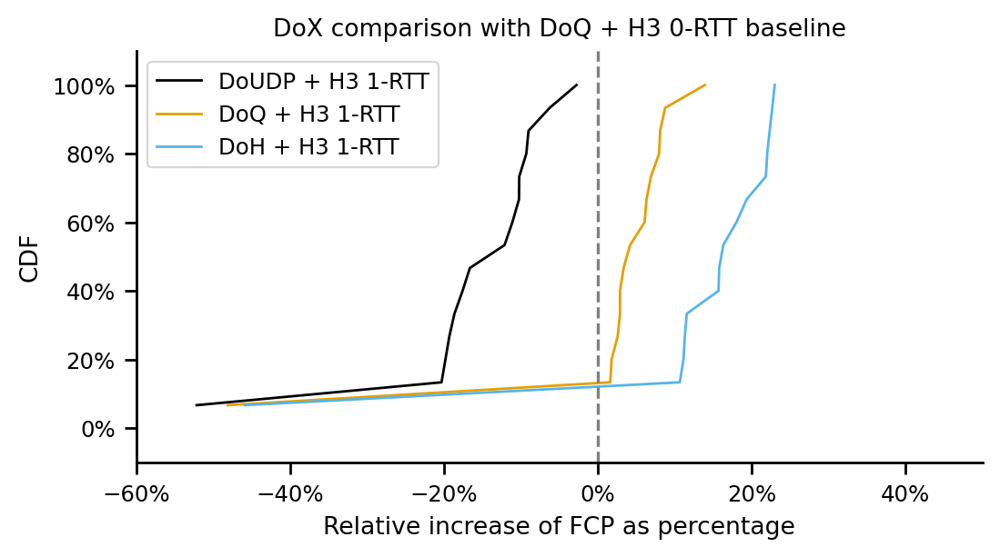

In [1135]:
df_tmp = df_diff_fcp_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-60, 50)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1136]:
df_diff_fcp_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.603127,8.077762,15.757285,dsl,www.example.org
1,-11.125633,6.057379,11.112231,dsl,www.wikipedia.org
2,-16.649485,8.723105,16.280808,dsl,www.instagram.com
3,-12.148425,6.305567,17.999276,cable,www.example.org
4,-6.287325,4.167334,10.631868,cable,www.wikipedia.org
5,-10.236749,7.941763,19.324152,cable,www.instagram.com
6,-9.315626,6.885970,15.665764,fiber,www.example.org
7,-52.170234,-48.134992,-45.904206,fiber,www.wikipedia.org
8,-2.797082,13.899331,22.968999,fiber,www.instagram.com
9,-19.327834,2.864958,22.315969,4g,www.example.org


DoQ + H3 0-RTT
count     15.000000
mean      21.770977
std       25.175715
min        2.877570
10%        7.997507
20%       10.204072
25%       10.838373
30%       11.412583
40%       12.089532
50%       13.828352
60%       20.530689
70%       22.624328
75%       23.448972
80%       24.114162
90%       25.212404
100%     109.074828
max      109.074828
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean     20.900587
std       7.609022
min       8.436676
10%      11.442918
20%      12.952615
25%      15.199669
30%      17.314675
40%      18.746796
50%      20.251619
60%      23.415769
70%      27.414002
75%      27.906171
80%      28.388990
90%      29.758491
100%     31.167310
max      31.167310
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     34.108844
std      13.239164
min      13.100688
10%      19.766297
20%      23.914135
25%      24.665396
30%      25.318852
40%      27.131581
50%      32.932075
60%      36.393261
70%      

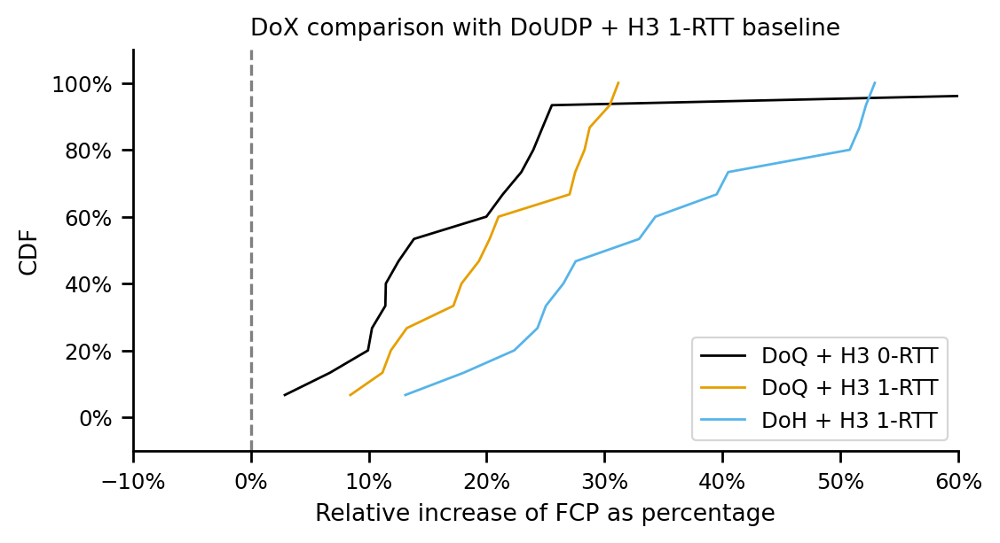

In [1137]:
df_tmp = df_diff_fcp_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-10, 60)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1138]:
df_diff_fcp_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.363829,31.167310,40.487473,dsl,www.example.org
1,12.518383,19.334048,25.021686,dsl,www.wikipedia.org
2,19.975263,30.440832,39.508206,dsl,www.instagram.com
3,13.828352,21.005876,34.316632,cable,www.example.org
4,6.709151,11.156078,18.054328,cable,www.wikipedia.org
5,11.404165,20.251619,32.932075,cable,www.instagram.com
6,10.272581,17.865918,27.547622,fiber,www.example.org
7,109.074828,8.436676,13.100688,fiber,www.wikipedia.org
8,2.877570,17.176864,26.507518,fiber,www.instagram.com
9,23.958491,27.509850,51.621029,4g,www.example.org


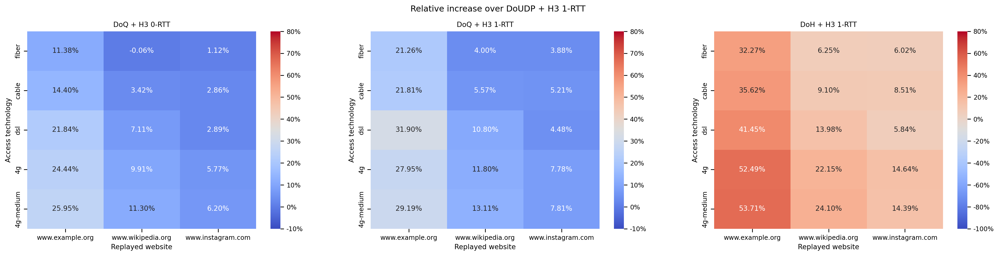

In [1139]:
index_order=['fiber', 'cable', 'dsl', '4g', '4g-medium']
fig, axs = plt.subplots(1, 3, sharex='all', figsize=(24,5))#, sharey='all')
ax_hm1 =sns.heatmap(df_diff_plt_udp[['DoQ + H3 0-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 0-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[0], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-10, vmax=80)
ax_hm2 = sns.heatmap(df_diff_plt_udp[['DoQ + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 1-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[1], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-10, vmax=80)
ax_hm3 = sns.heatmap(df_diff_plt_udp[['DoH + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoH + H3 1-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[2], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-100, vmax=80)
axs.flat[0].set_title('DoQ + H3 0-RTT')
axs.flat[1].set_title('DoQ + H3 1-RTT')
axs.flat[2].set_title('DoH + H3 1-RTT')
fig.suptitle('Relative increase over DoUDP + H3 1-RTT')
ax_hm1.set_yticklabels(labels=ax_hm1.get_yticklabels(), va='center')
for t in ax_hm1.texts: t.set_text(t.get_text() + "%")
for t in ax_hm2.texts: t.set_text(t.get_text() + "%")
for t in ax_hm3.texts: t.set_text(t.get_text() + "%")
for ax in axs.flat:
    ax.set_ylabel('Access technology')
    ax.set_xlabel('Replayed website')
plt.show()

In [1140]:
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.839656,31.904282,41.451345,dsl,www.example.org
1,7.109167,10.798591,13.981977,dsl,www.wikipedia.org
2,2.887905,4.483575,5.837323,dsl,www.instagram.com
3,14.397443,21.811607,35.623982,cable,www.example.org
4,3.424639,5.572759,9.097122,cable,www.wikipedia.org
5,2.862374,5.214944,8.507665,cable,www.instagram.com
6,11.380928,21.261553,32.268771,fiber,www.example.org
7,-0.062568,4.003151,6.250505,fiber,www.wikipedia.org
8,1.118072,3.879112,6.021984,fiber,www.instagram.com
9,24.443329,27.947283,52.489819,4g,www.example.org


In [1141]:
df_udp_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [1142]:
df_diff_all_data_udp_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoUDP + H3 1-RTT'], df_udp_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_udp_baseline_medians['relative_increase_plt'] = (df_diff_all_data_udp_baseline_medians['full_plt']/(df_diff_all_data_udp_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_udp_baseline_medians['full_fcp']/(df_diff_all_data_udp_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoQ,317.497970,321.397970,321.397970,H3 1-RTT,DoQ + H3 1-RTT,252.032302,258.079020,25.975110,24.534714
1,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoH,341.212289,345.112289,345.112289,H3 1-RTT,DoH + H3 1-RTT,252.032302,258.079020,35.384348,33.723496
2,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoQ,305.797970,311.497970,311.497970,H3 0-RTT,DoQ + H3 0-RTT,252.032302,258.079020,21.332848,20.698680
3,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoH,329.512289,335.212289,335.212289,H3 0-RTT,DoH + H3 0-RTT,252.032302,258.079020,30.742086,29.887462
4,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoUDP,225.047707,230.747707,230.747707,H3 0-RTT,DoUDP + H3 0-RTT,252.032302,258.079020,-10.706800,-10.590288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49370,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,163.7,46.8,1436.8,1127.5,1127.5,1127.5,46.8,46.8,1437.8,...,DoQ,1662.553557,549.753557,549.753557,H3 1-RTT,DoQ + H3 1-RTT,1536.142867,423.776506,8.229097,29.727238
49371,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,163.7,46.8,1436.8,1127.5,1127.5,1127.5,46.8,46.8,1437.8,...,DoH,1763.348769,650.548769,650.548769,H3 1-RTT,DoH + H3 1-RTT,1536.142867,423.776506,14.790675,53.512231
49372,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,157.3,46.6,1423.2,1111.7,1111.7,1111.7,46.6,46.5,1424.3,...,DoQ,1649.053557,531.153557,531.153557,H3 0-RTT,DoQ + H3 0-RTT,1536.142867,423.776506,7.350273,25.338132
49373,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,157.3,46.6,1423.2,1111.7,1111.7,1111.7,46.6,46.5,1424.3,...,DoH,1749.848769,631.948769,631.948769,H3 0-RTT,DoH + H3 0-RTT,1536.142867,423.776506,13.911851,49.123125


In [1143]:
df_diff_all_data_udp_baseline_medians.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [1144]:
df_diff_all_data_udp_baseline_medians.website.unique()

array(['www.example.org', 'www.wikipedia.org', 'www.instagram.com'],
      dtype=object)

In [1145]:
df_diff_all_data_udp_baseline_medians.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT',
       'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'], dtype=object)

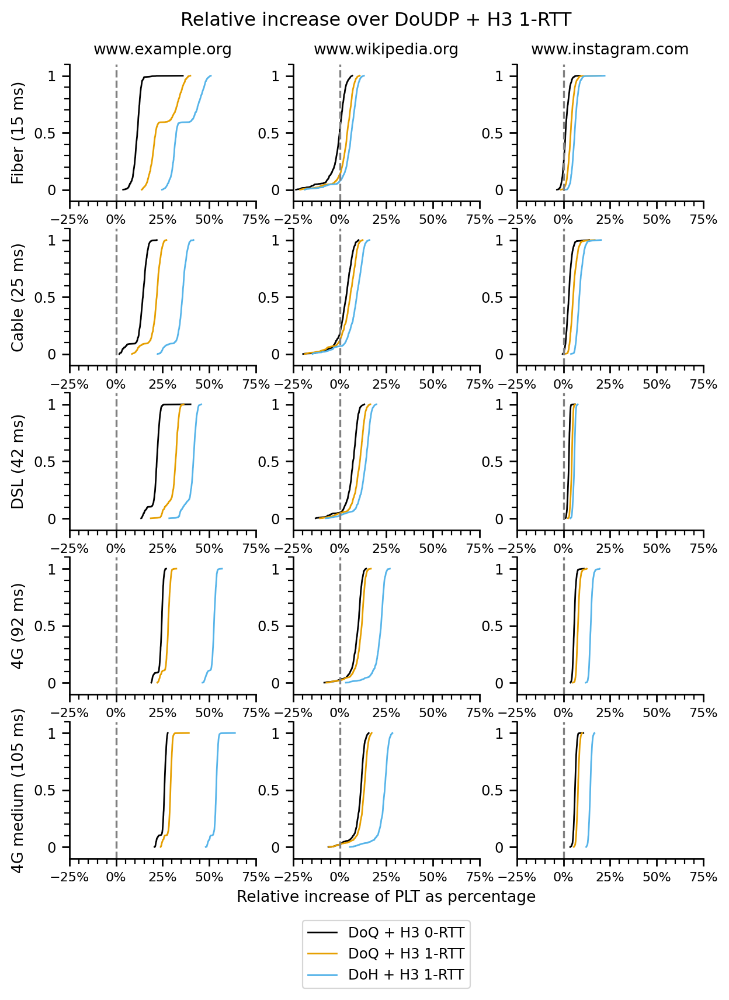

<Figure size 1200x800 with 0 Axes>

In [1146]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_plt'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')
        
        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-25, 75)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
plt.savefig("figures/plt-doudp-baseline-grid.pdf", bbox_inches='tight')

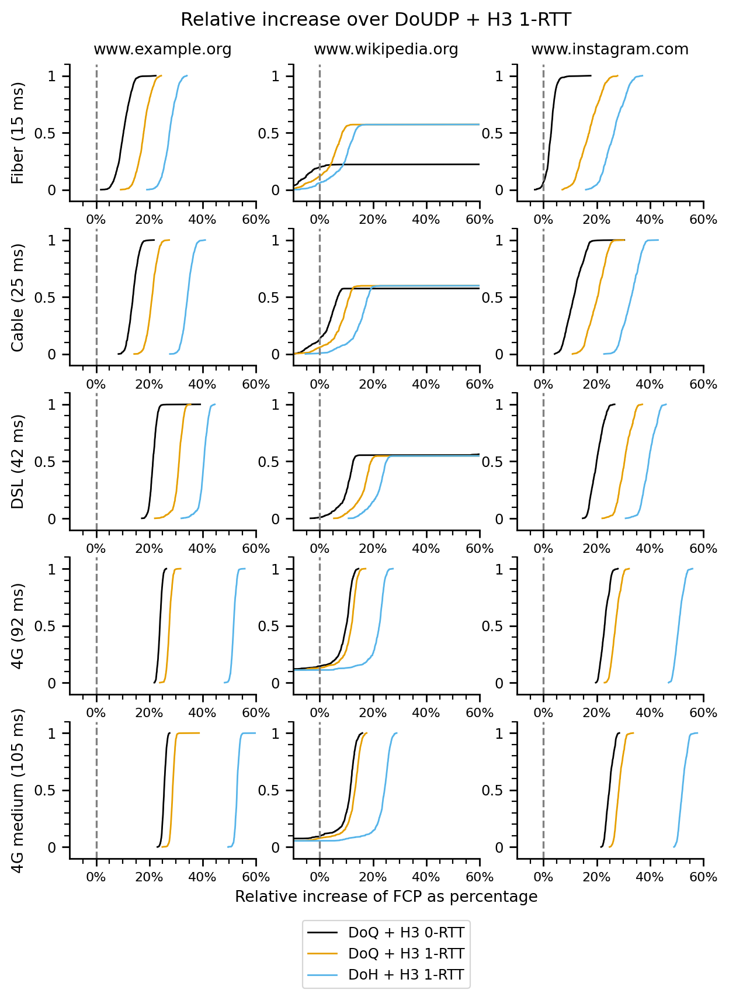

<Figure size 1200x800 with 0 Axes>

In [1147]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_fcp'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of FCP as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-10, 60)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
plt.savefig("figures/fcp-doudp-baseline-grid.pdf", bbox_inches='tight')

In [1148]:
df_quic_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [1149]:
df_diff_all_data_quic_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoQ + H3 0-RTT'], df_quic_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_quic_baseline_medians['relative_increase_plt'] = (df_diff_all_data_quic_baseline_medians['full_plt']/(df_diff_all_data_quic_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_quic_baseline_medians['full_fcp']/(df_diff_all_data_quic_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoQ,317.497970,321.397970,321.397970,H3 1-RTT,DoQ + H3 1-RTT,307.075289,313.214579,3.394178,2.612711
1,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoH,341.212289,345.112289,345.112289,H3 1-RTT,DoH + H3 1-RTT,307.075289,313.214579,11.116818,10.183980
2,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoUDP,236.747707,240.647707,240.647707,H3 1-RTT,DoUDP + H3 1-RTT,307.075289,313.214579,-22.902391,-23.168421
3,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoH,329.512289,335.212289,335.212289,H3 0-RTT,DoH + H3 0-RTT,307.075289,313.214579,7.306677,7.023208
4,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoUDP,225.047707,230.747707,230.747707,H3 0-RTT,DoUDP + H3 0-RTT,307.075289,313.214579,-26.712531,-26.329193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49370,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,163.7,46.8,1436.8,1127.5,1127.5,1127.5,46.8,46.8,1437.8,...,DoQ,1662.553557,549.753557,549.753557,H3 1-RTT,DoQ + H3 1-RTT,1631.406804,528.605453,1.909196,4.000735
49371,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,163.7,46.8,1436.8,1127.5,1127.5,1127.5,46.8,46.8,1437.8,...,DoH,1763.348769,650.548769,650.548769,H3 1-RTT,DoH + H3 1-RTT,1631.406804,528.605453,8.087619,23.068872
49372,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,163.7,46.8,1436.8,1127.5,1127.5,1127.5,46.8,46.8,1437.8,...,DoUDP,1542.984628,430.184628,430.184628,H3 1-RTT,DoUDP + H3 1-RTT,1631.406804,528.605453,-5.419996,-18.618957
49373,cb8dcc54-2559-4b1b-af16-9c4cfef683aa,157.3,46.6,1423.2,1111.7,1111.7,1111.7,46.6,46.5,1424.3,...,DoH,1749.848769,631.948769,631.948769,H3 0-RTT,DoH + H3 0-RTT,1631.406804,528.605453,7.260112,19.550180


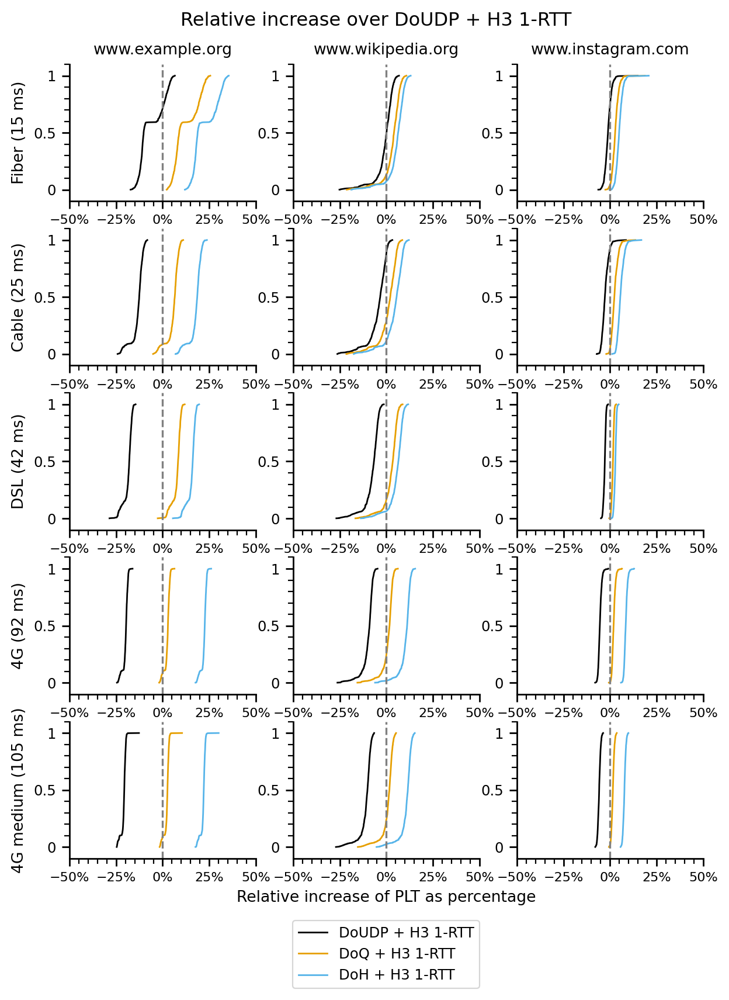

<Figure size 1200x800 with 0 Axes>

In [1150]:
metrics_for_single_cdf = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_quic_baseline_medians[(df_diff_all_data_quic_baseline_medians['website'] == website) & (df_diff_all_data_quic_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_quic_baseline_medians['experiment_description'] == metric)]['relative_increase_plt'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-50, 50)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
plt.savefig("figures/plt-doq-baseline-grid.pdf", bbox_inches='tight')

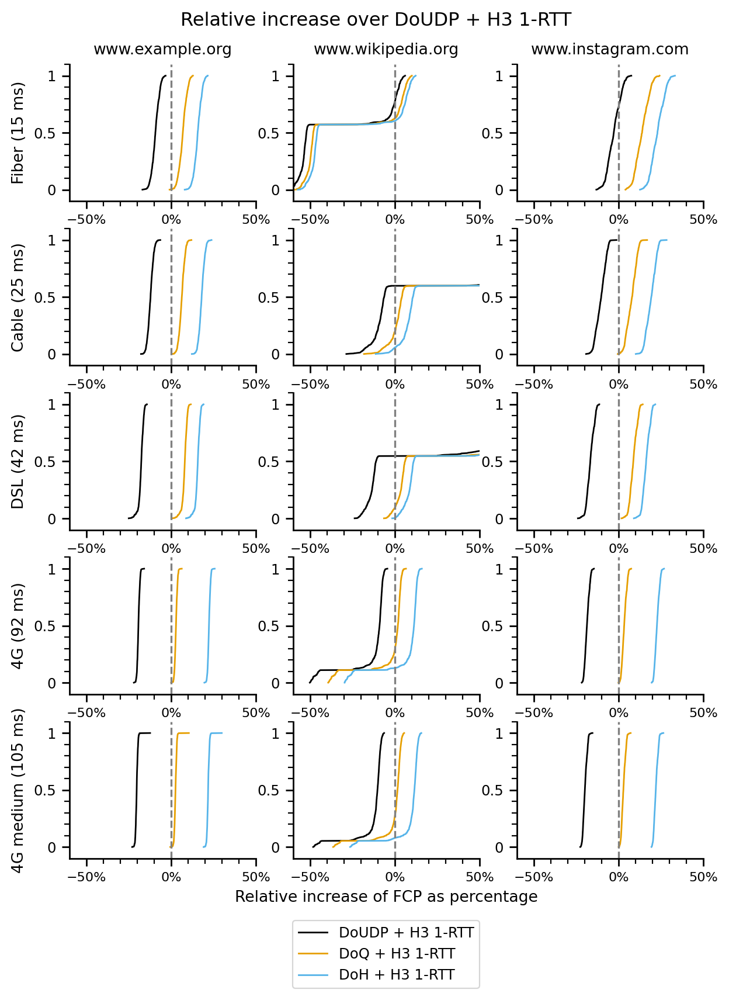

<Figure size 1200x800 with 0 Axes>

In [1151]:
metrics_for_single_cdf = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_quic_baseline_medians[(df_diff_all_data_quic_baseline_medians['website'] == website) & (df_diff_all_data_quic_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_quic_baseline_medians['experiment_description'] == metric)]['relative_increase_fcp'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of FCP as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-60, 50)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
plt.savefig("figures/fcp-doq-baseline-grid.pdf", bbox_inches='tight')

DoQ+0rtt -> 1-rtt handshake
DoUDP+1-rtt -> 1-rtt handshake
-> compare their relative increase in PLT from 4g to 4g medium for www.example.org (inflight should always be below BDP)

In [1152]:
df_exchange_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'exchange'].copy()
df_exchange_durations = pd.merge(df_exchange_durations, measurements, on='msm_id')

In [1153]:
df_exchange_durations.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [1154]:
df_exchange_durations['rtt'] = 0
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'dsl', 42.35979, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'cable', 25.17665, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'fiber', 14.767147, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g', 91.85231065904635, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_exchange_durations['rtt'])

In [1155]:
df_exchange_durations['duration_in_rtt'] = df_exchange_durations['duration'] / df_exchange_durations['rtt']

In [1156]:
df_exchange_durations['handshake_round_trips'] = 0
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoQ', 1, df_exchange_durations['handshake_round_trips'])
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoH', 2, df_exchange_durations['handshake_round_trips'])

In [1157]:
df_exchange_durations['theoretical_handshake_duration'] = df_exchange_durations['handshake_round_trips'] * df_exchange_durations['rtt']

In [1158]:
df_exchange_durations['theoretical_exchange_without_handshake'] = df_exchange_durations['duration'] - df_exchange_durations['theoretical_handshake_duration']

In [1159]:
df_exchange_durations['theoretical_query_in_rtt'] = df_exchange_durations['theoretical_exchange_without_handshake'] / df_exchange_durations['rtt']

In [1160]:
df_exchange_durations['theoretical_processing_delay'] = df_exchange_durations['theoretical_exchange_without_handshake'] - df_exchange_durations['rtt']

In [1161]:
df_exchange_durations.transport_protocol.unique()

array(['DoQ', 'DoH', 'DoUDP'], dtype=object)

DoQ
count    9875.000000
mean        2.500766
std         0.323923
min         2.079469
10%         2.132849
20%         2.148797
25%         2.154531
30%         2.156630
40%         2.242000
50%         2.498646
60%         2.559303
70%         2.777116
75%         2.809512
80%         2.888289
90%         2.936255
100%        2.989932
max         2.989932
Name: duration_in_rtt, dtype: float64
DoH
count    9875.000000
mean        3.381455
std         0.229706
min         3.068422
10%         3.122528
20%         3.124318
25%         3.125145
30%         3.126123
40%         3.207486
50%         3.433517
60%         3.493761
70%         3.507593
75%         3.510673
80%         3.547259
90%         3.713064
100%        3.860277
max         3.860277
Name: duration_in_rtt, dtype: float64
DoUDP
count    9875.000000
mean        1.027656
std         0.016677
min         1.003819
10%         1.008318
20%         1.008717
25%         1.008906
30%         1.009101
40%         1.015500
50%    

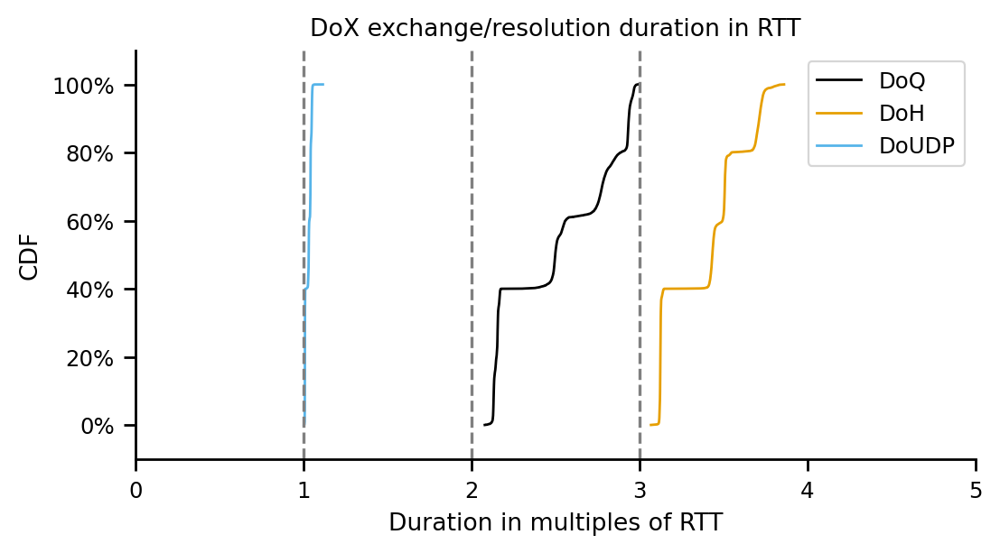

In [1162]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX exchange/resolution duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    1975.000000
mean        2.769023
std         0.080288
min         2.359756
10%         2.703069
20%         2.743325
25%         2.752195
30%         2.758733
40%         2.769031
50%         2.777146
60%         2.786882
70%         2.799891
75%         2.809512
80%         2.825379
90%         2.852368
100%        2.934095
max         2.934095
Name: duration_in_rtt, dtype: float64
DoH
count    1975.000000
mean        3.714443
std         0.036073
min         3.340739
10%         3.686078
20%         3.694766
25%         3.697671
30%         3.700661
40%         3.707358
50%         3.713070
60%         3.718371
70%         3.724548
75%         3.727854
80%         3.731522
90%         3.744077
100%        3.860277
max         3.860277
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.048463
std         0.004684
min         1.018970
10%         1.042846
20%         1.045542
25%         1.047229
30%         1.047866
40%         1.048669
50%    

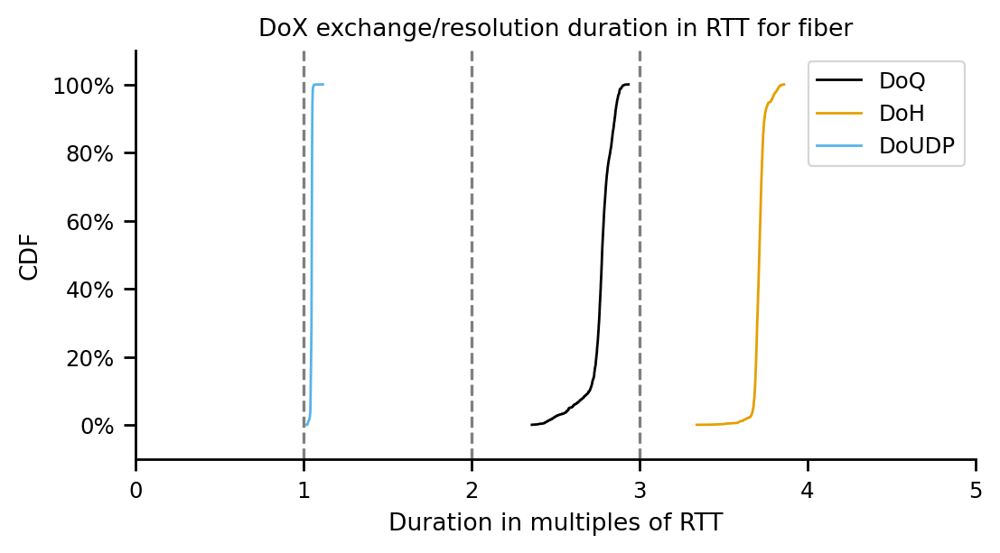

DoQ
count    1975.000000
mean        2.502861
std         0.035710
min         2.285045
10%         2.473124
20%         2.486470
25%         2.489918
30%         2.492131
40%         2.495803
50%         2.499486
60%         2.504383
70%         2.512946
75%         2.523851
80%         2.535325
90%         2.548268
100%        2.583720
max         2.583720
Name: duration_in_rtt, dtype: float64
DoH
count    1975.000000
mean        3.435662
std         0.021424
min         3.247549
10%         3.418237
20%         3.423707
25%         3.425857
30%         3.428039
40%         3.430851
50%         3.433655
60%         3.436605
70%         3.439915
75%         3.441758
80%         3.444038
90%         3.453080
100%        3.526063
max         3.526063
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.030966
std         0.002439
min         1.015337
10%         1.027856
20%         1.029643
25%         1.030283
30%         1.030582
40%         1.031020
50%    

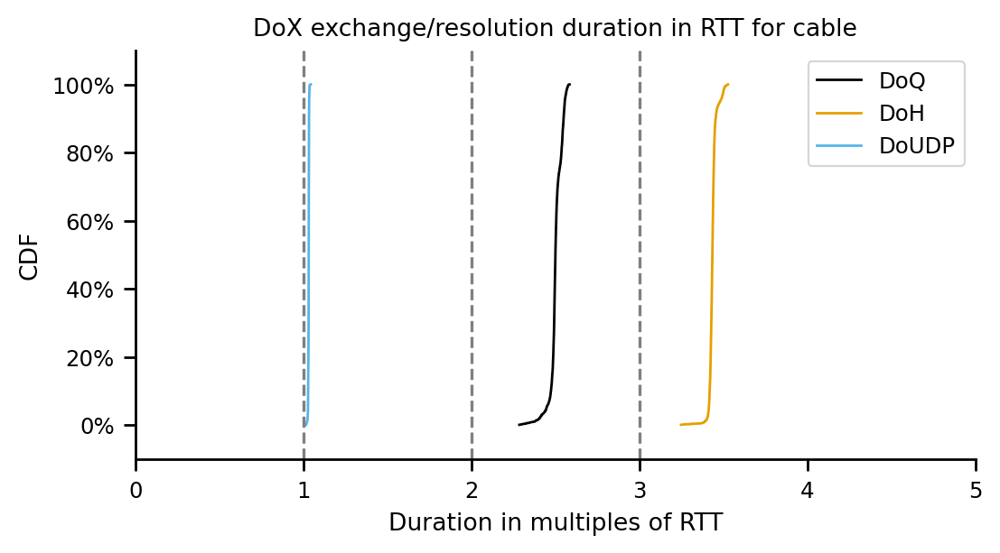

DoQ
count    1975.000000
mean        2.939661
std         0.018419
min         2.815790
10%         2.926351
20%         2.929640
25%         2.930685
30%         2.931924
40%         2.933897
50%         2.936260
60%         2.939251
70%         2.944837
75%         2.949413
80%         2.956240
90%         2.964950
100%        2.989932
max         2.989932
Name: duration_in_rtt, dtype: float64
DoH
count    1975.000000
mean        3.508063
std         0.011803
min         3.391257
10%         3.500753
20%         3.503883
25%         3.504656
30%         3.505308
40%         3.506539
50%         3.507540
60%         3.508687
70%         3.509858
75%         3.510641
80%         3.511619
90%         3.515012
100%        3.559730
max         3.559730
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.041545
std         0.001581
min         1.030898
10%         1.039711
20%         1.040698
25%         1.041111
30%         1.041264
40%         1.041535
50%    

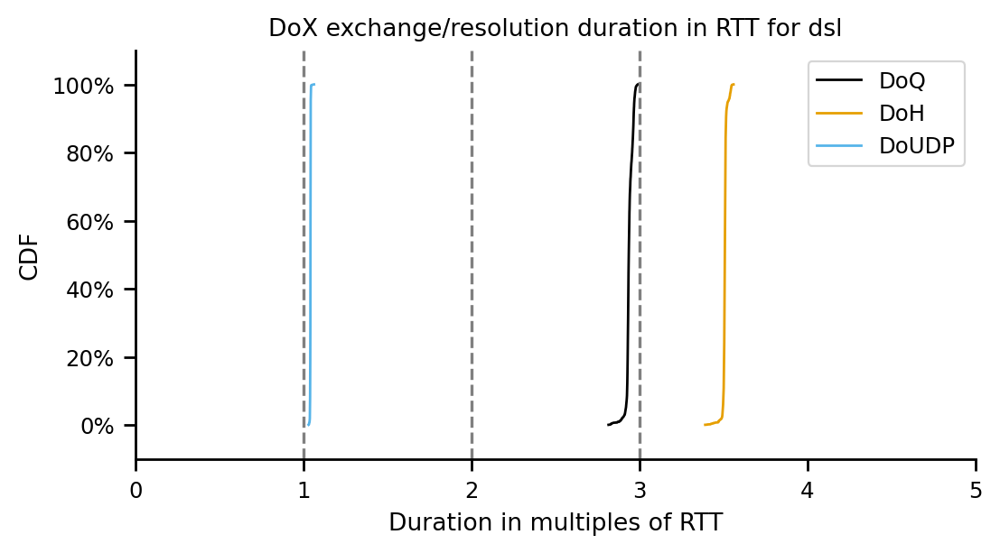

DoQ
count    1975.000000
mean        2.134451
std         0.008657
min         2.079469
10%         2.127934
20%         2.129804
25%         2.130421
30%         2.130970
40%         2.131970
50%         2.133030
60%         2.134385
70%         2.136672
75%         2.139365
80%         2.142409
90%         2.145922
100%        2.157445
max         2.157445
Name: duration_in_rtt, dtype: float64
DoH
count    1975.000000
mean        3.124363
std         0.005500
min         3.068422
10%         3.119988
20%         3.121694
25%         3.122264
30%         3.122592
40%         3.123409
50%         3.124080
60%         3.124853
70%         3.125658
75%         3.126127
80%         3.126684
90%         3.128351
100%        3.146277
max         3.146277
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.008328
std         0.000672
min         1.003819
10%         1.007515
20%         1.008038
25%         1.008153
30%         1.008219
40%         1.008334
50%    

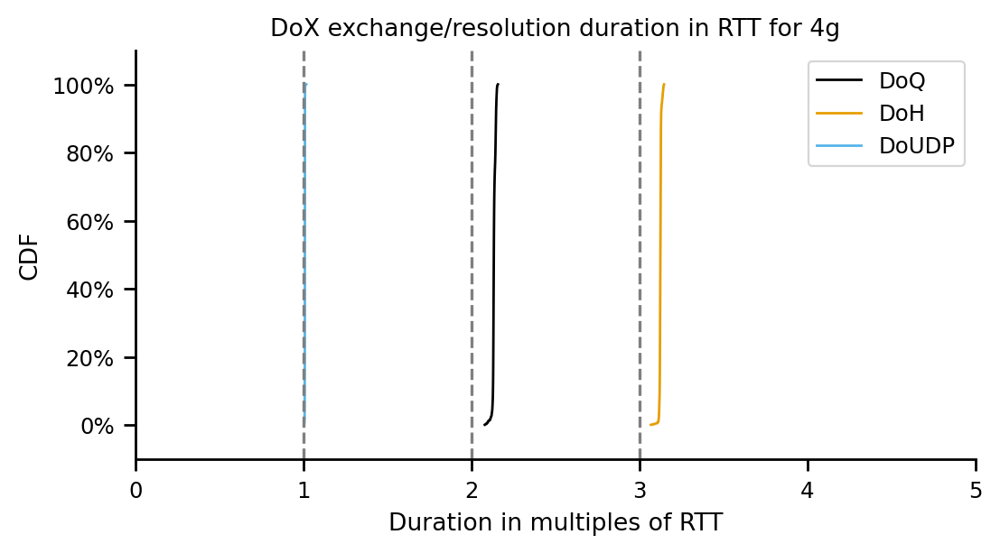

DoQ
count    1975.000000
mean        2.157835
std         0.007869
min         2.106072
10%         2.152307
20%         2.153933
25%         2.154488
30%         2.154884
40%         2.155659
50%         2.156613
60%         2.157763
70%         2.159733
75%         2.162694
80%         2.165166
90%         2.168075
100%        2.177433
max         2.177433
Name: duration_in_rtt, dtype: float64
DoH
count    1975.000000
mean        3.124746
std         0.004901
min         3.082529
10%         3.120027
20%         3.122369
25%         3.122880
30%         3.123243
40%         3.123902
50%         3.124460
60%         3.125030
70%         3.125761
75%         3.126112
80%         3.126585
90%         3.128460
100%        3.147391
max         3.147391
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.008976
std         0.000565
min         1.005500
10%         1.008237
20%         1.008723
25%         1.008802
30%         1.008867
40%         1.008970
50%    

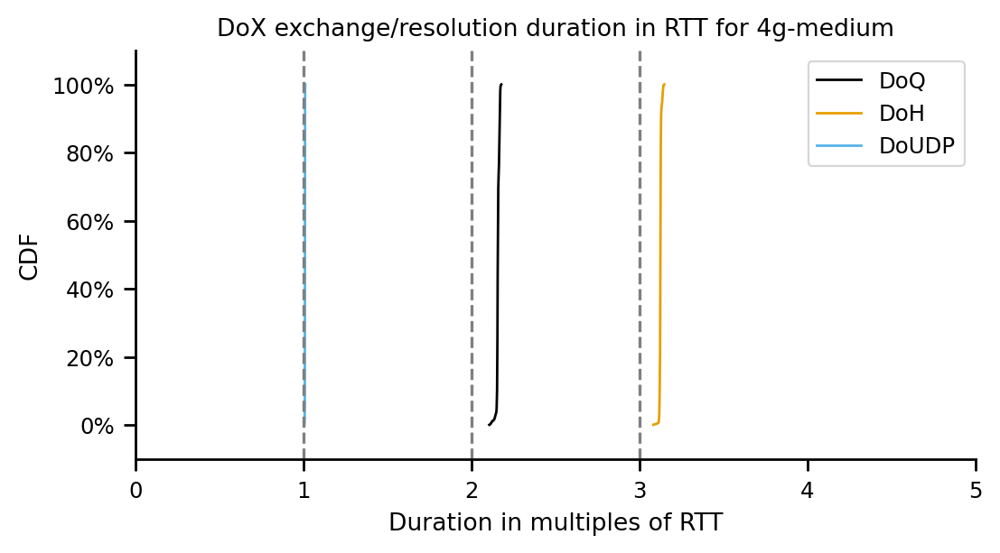

In [1163]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX exchange/resolution duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       74.246205
std        36.853353
min        20.126469
10%        26.237204
20%        32.403407
25%        37.497809
30%        37.727937
40%        54.889432
50%        82.012011
60%        84.165823
70%       104.104585
75%       104.853216
80%       106.223983
90%       120.827845
100%      122.720046
max       122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    2637.000000
mean       69.217892
std        36.197057
min        19.802929
10%        25.289890
20%        32.191607
25%        35.901952
30%        36.094340
40%        46.987233
50%        63.867489
60%        65.561456
70%       103.240401
75%       103.449306
80%       105.296293
90%       117.545524
100%      119.303357
max       119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    2637.000000
mean       56.709539
std        35.966550
min        15.102344
10%        15.499897
20%        25.562019
25%        25.939564
30%

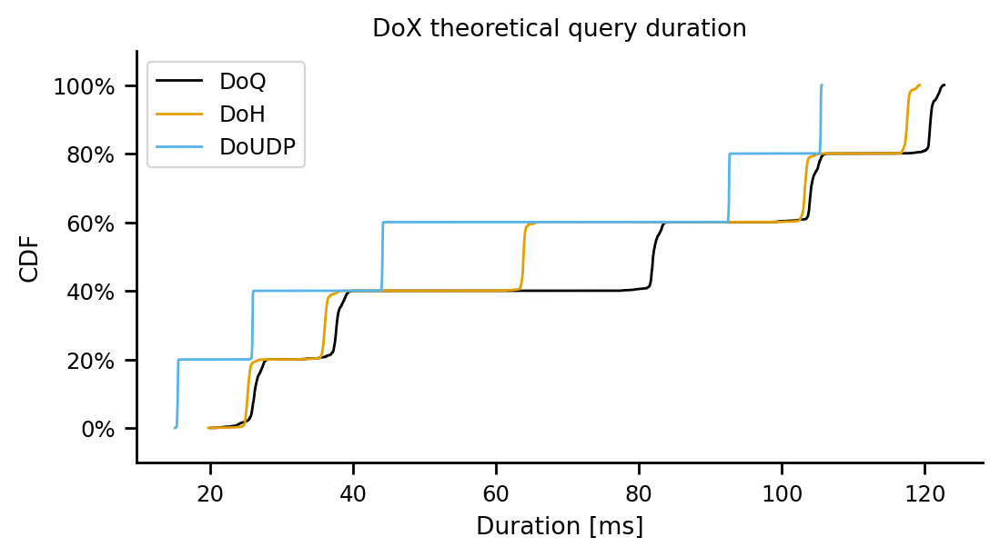

In [910]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      26.161146
std        1.099327
min       20.126469
10%       25.186001
20%       25.798536
25%       25.894268
30%       25.962901
40%       26.115199
50%       26.235304
60%       26.371786
70%       26.579708
75%       26.722754
80%       26.975762
90%       27.390106
100%      28.167663
max       28.167663
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean      25.300131
std        0.543556
min       19.802929
10%       24.926887
20%       25.032373
25%       25.092689
30%       25.138148
40%       25.224186
50%       25.288543
60%       25.370346
70%       25.451802
75%       25.495794
80%       25.557524
90%       25.727595
100%      27.262194
max       27.262194
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      15.487247
std        0.060221
min       15.102344
10%       15.403224
20%       15.447869
25%       15.467397
30%       15.475049
40%       15.486717
50% 

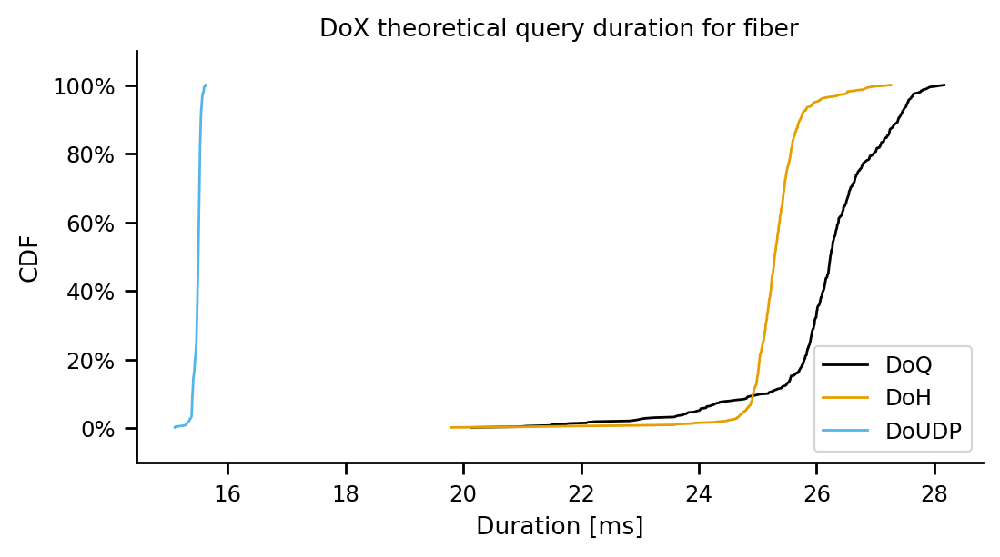

DoQ
count    528.000000
mean      37.788267
std        0.921538
min       32.319567
10%       37.126626
20%       37.415059
25%       37.497777
30%       37.546393
40%       37.647492
50%       37.727584
60%       37.847261
70%       38.023909
75%       38.170492
80%       38.452618
90%       38.928572
100%      39.924213
max       39.924213
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      36.136555
std        0.577704
min       32.078845
10%       35.718859
20%       35.844726
25%       35.901941
30%       35.943096
40%       36.021610
50%       36.093206
60%       36.164437
70%       36.255926
75%       36.305960
80%       36.361646
90%       36.563367
100%      38.394460
max       38.394460
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      25.954620
std        0.060919
min       25.555721
10%       25.874407
20%       25.925407
25%       25.939418
30%       25.947156
40%       25.958097
50% 

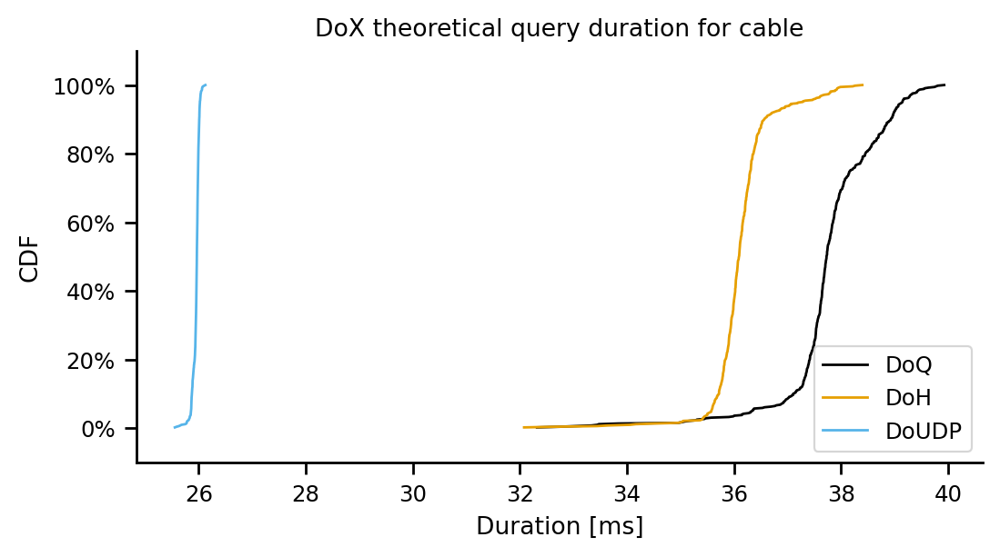

DoQ
count    528.000000
mean      82.115496
std        0.811952
min       77.337260
10%       81.601684
20%       81.750460
25%       81.786765
30%       81.842389
40%       81.932054
50%       82.013497
60%       82.143427
70%       82.348175
75%       82.484416
80%       82.674620
90%       83.180806
100%      84.293913
max       84.293913
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      63.878098
std        0.461262
min       59.876393
10%       63.554513
20%       63.714937
25%       63.754704
30%       63.785908
40%       63.825323
50%       63.867685
60%       63.912870
70%       63.960998
75%       63.992760
80%       64.041350
90%       64.185106
100%      65.563098
max       65.563098
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      44.123522
std        0.060520
min       43.835630
10%       44.041360
20%       44.095106
25%       44.106339
30%       44.112789
40%       44.120476
50% 

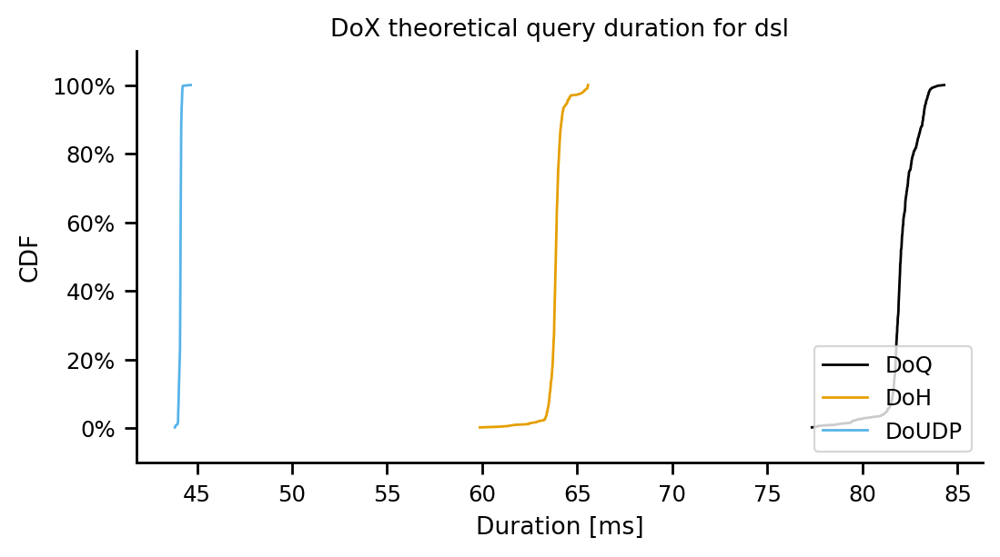

DoQ
count    527.000000
mean     104.249586
std        0.935384
min       98.657293
10%      103.687782
20%      103.835017
25%      103.874193
30%      103.921278
40%      104.007817
50%      104.106409
60%      104.287845
70%      104.581528
75%      104.864247
80%      105.075139
90%      105.333000
100%     106.255834
max      106.255834
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     103.260457
std        0.524603
min       98.819174
10%      102.799184
20%      103.036598
25%      103.081125
30%      103.121131
40%      103.187063
50%      103.241003
60%      103.315741
70%      103.404495
75%      103.450938
80%      103.491207
90%      103.651374
100%     105.299720
max      105.299720
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      92.616329
std        0.051577
min       92.224833
10%       92.540857
20%       92.585549
25%       92.599603
30%       92.606225
40%       92.618466
50% 

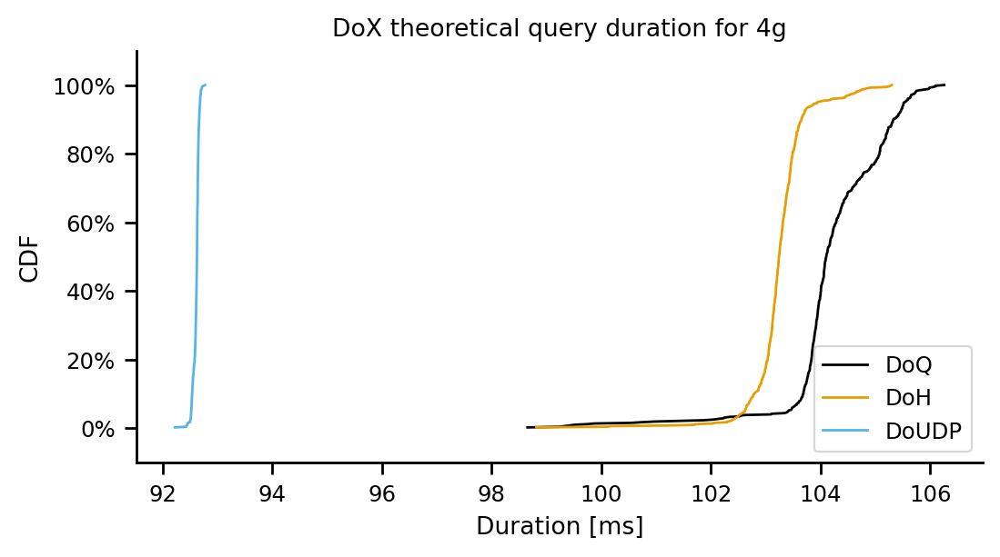

DoQ
count    527.000000
mean     120.970779
std        0.728062
min      115.930403
10%      120.487935
20%      120.603456
25%      120.644491
30%      120.678193
40%      120.746471
50%      120.827851
60%      120.920751
70%      121.044188
75%      121.210515
80%      121.579799
90%      122.056283
100%     122.720046
max      122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     117.587123
std        0.487503
min      114.042488
10%      117.114507
20%      117.323465
25%      117.373661
30%      117.404101
40%      117.482785
50%      117.545616
60%      117.608396
70%      117.661988
75%      117.728757
80%      117.778430
90%      117.989140
100%     119.303357
max      119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean     105.448220
std        0.048134
min      105.267555
10%      105.373362
20%      105.418888
25%      105.427062
30%      105.432055
40%      105.443333
50% 

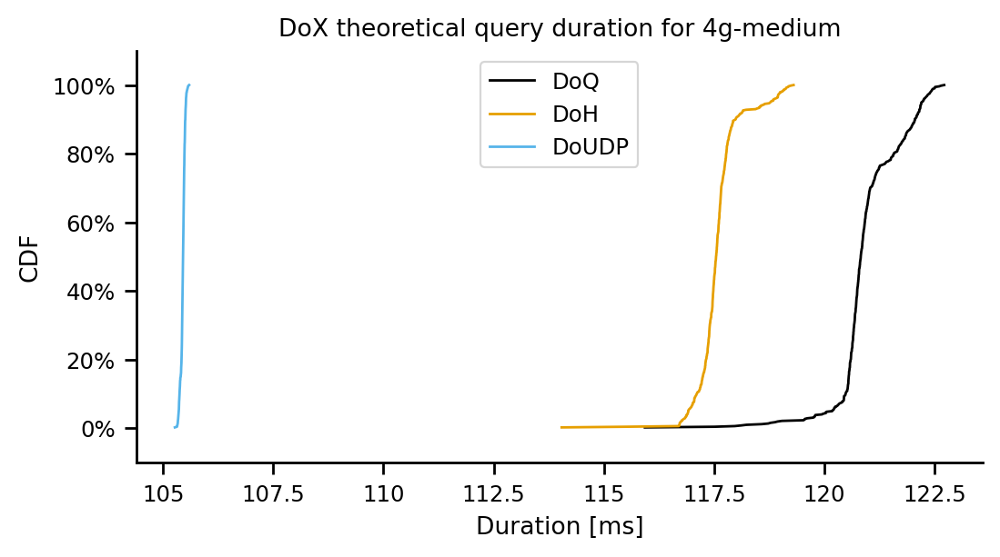

In [911]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration for '+tech)

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean        1.500879
std         0.323765
min         1.074086
10%         1.133285
20%         1.149367
25%         1.154519
30%         1.156224
40%         1.290372
50%         1.497996
60%         1.562106
70%         1.776642
75%         1.810300
80%         1.880039
90%         1.936110
100%        1.989951
max         1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    2637.000000
mean        1.381263
std         0.229283
min         1.075849
10%         1.122683
20%         1.124495
25%         1.125362
30%         1.126363
40%         1.283108
50%         1.433373
60%         1.494317
70%         1.507754
75%         1.510691
80%         1.547144
90%         1.712455
100%        1.846138
max         1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    2637.000000
mean        1.027737
std         0.016716
min         1.004056
10%         1.008337
20%         1.008715
25%         1.008908
30%         1.009111
40%       

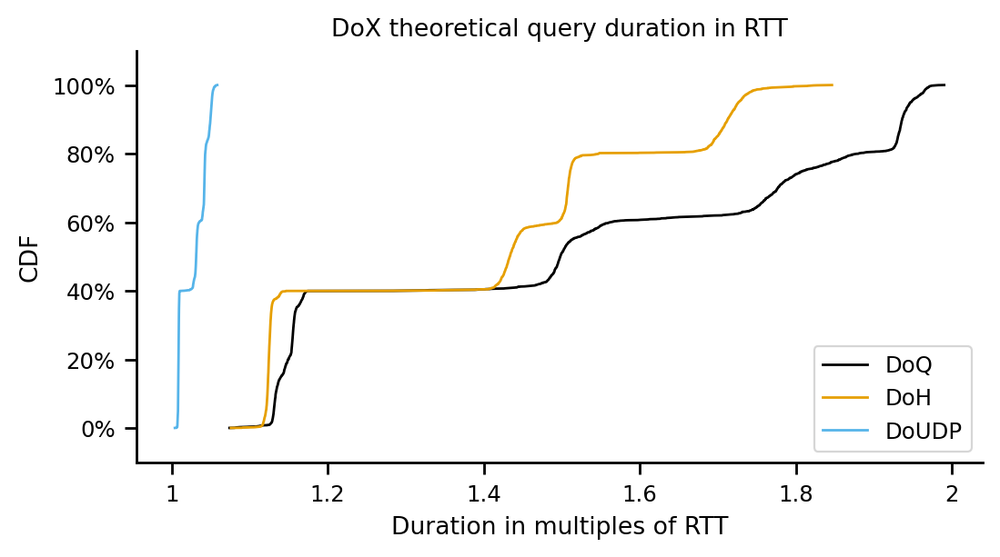

In [912]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.771578
std        0.074444
min        1.362922
10%        1.705543
20%        1.747022
25%        1.753505
30%        1.758153
40%        1.768466
50%        1.776599
60%        1.785842
70%        1.799922
75%        1.809608
80%        1.826742
90%        1.854800
100%       1.907455
max        1.907455
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.713271
std        0.036808
min        1.341013
10%        1.687996
20%        1.695139
25%        1.699224
30%        1.702302
40%        1.708129
50%        1.712487
60%        1.718026
70%        1.723542
75%        1.726521
80%        1.730702
90%        1.742218
100%       1.846138
max        1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1

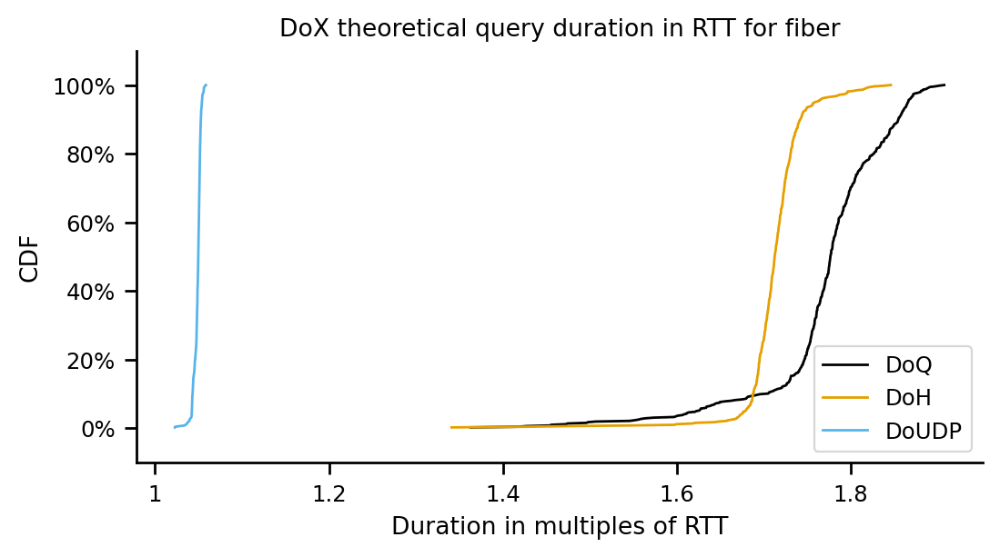

DoQ
count    528.000000
mean       1.500925
std        0.036603
min        1.283712
10%        1.474645
20%        1.486102
25%        1.489387
30%        1.491318
40%        1.495334
50%        1.498515
60%        1.503268
70%        1.510285
75%        1.516107
80%        1.527313
90%        1.546217
100%       1.585764
max        1.585764
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.435320
std        0.022946
min        1.274151
10%        1.418730
20%        1.423729
25%        1.426002
30%        1.427636
40%        1.430755
50%        1.433598
60%        1.436428
70%        1.440062
75%        1.442049
80%        1.444261
90%        1.452273
100%       1.525003
max        1.525003
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1

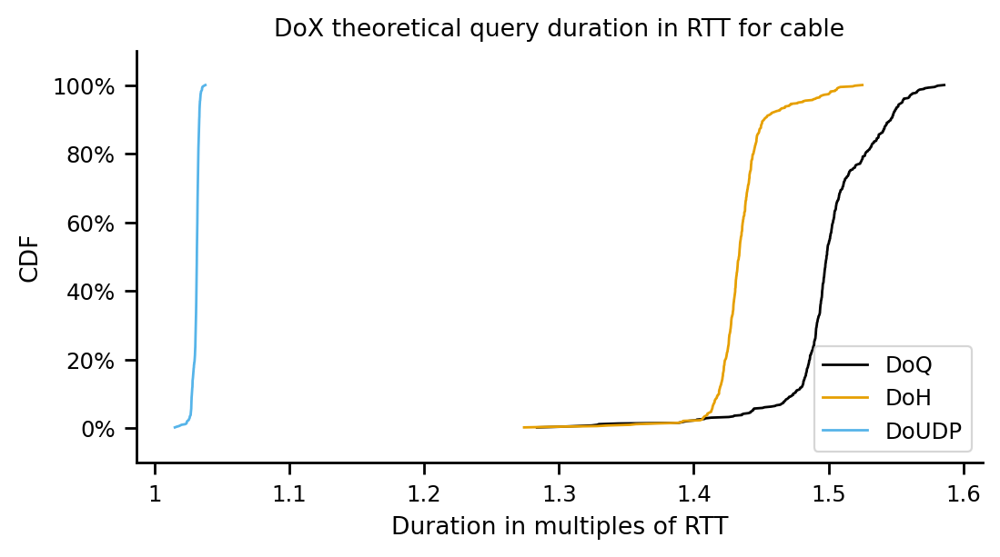

DoQ
count    528.000000
mean       1.938525
std        0.019168
min        1.825723
10%        1.926395
20%        1.929907
25%        1.930764
30%        1.932077
40%        1.934194
50%        1.936117
60%        1.939184
70%        1.944018
75%        1.947234
80%        1.951724
90%        1.963674
100%       1.989951
max        1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.507989
std        0.010889
min        1.413520
10%        1.500350
20%        1.504137
25%        1.505076
30%        1.505813
40%        1.506743
50%        1.507743
60%        1.508810
70%        1.509946
75%        1.510696
80%        1.511843
90%        1.515237
100%       1.547767
max        1.547767
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1

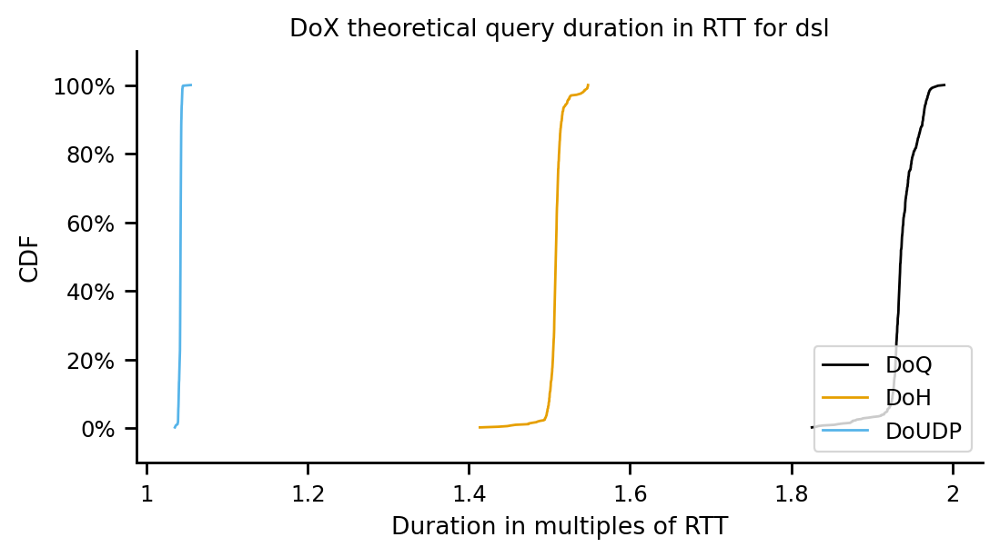

DoQ
count    527.000000
mean       1.134970
std        0.010184
min        1.074086
10%        1.128853
20%        1.130456
25%        1.130883
30%        1.131395
40%        1.132338
50%        1.133411
60%        1.135386
70%        1.138584
75%        1.141662
80%        1.143957
90%        1.146765
100%       1.156812
max        1.156812
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.124201
std        0.005711
min        1.075849
10%        1.119179
20%        1.121764
25%        1.122249
30%        1.122684
40%        1.123402
50%        1.123989
60%        1.124803
70%        1.125769
75%        1.126275
80%        1.126713
90%        1.128457
100%       1.146403
max        1.146403
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1

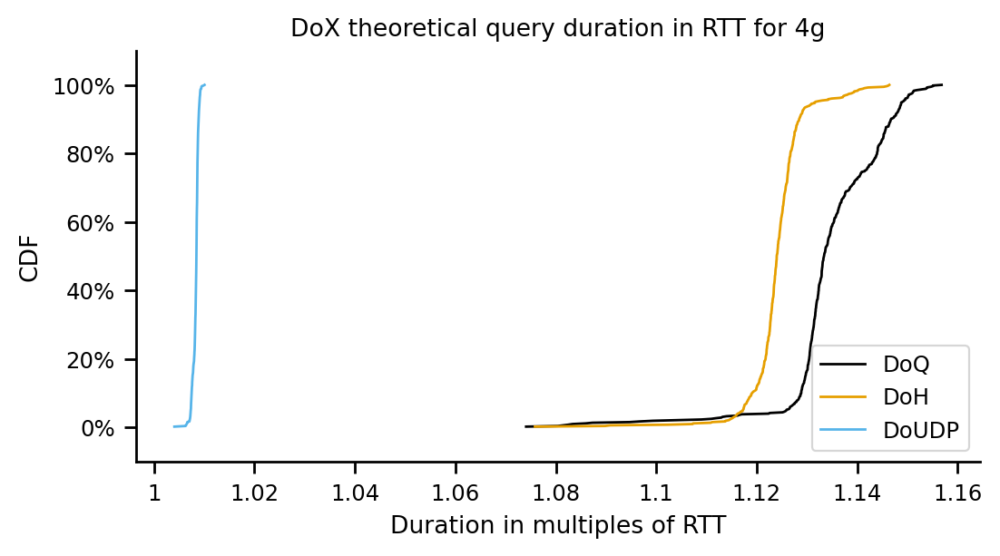

DoQ
count    527.000000
mean       1.157569
std        0.006967
min        1.109338
10%        1.152949
20%        1.154054
25%        1.154447
30%        1.154769
40%        1.155423
50%        1.156202
60%        1.157091
70%        1.158272
75%        1.159863
80%        1.163397
90%        1.167956
100%       1.174308
max        1.174308
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.125191
std        0.004665
min        1.091272
10%        1.120669
20%        1.122668
25%        1.123148
30%        1.123440
40%        1.124193
50%        1.124794
60%        1.125395
70%        1.125907
75%        1.126546
80%        1.127022
90%        1.129038
100%       1.141614
max        1.141614
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1

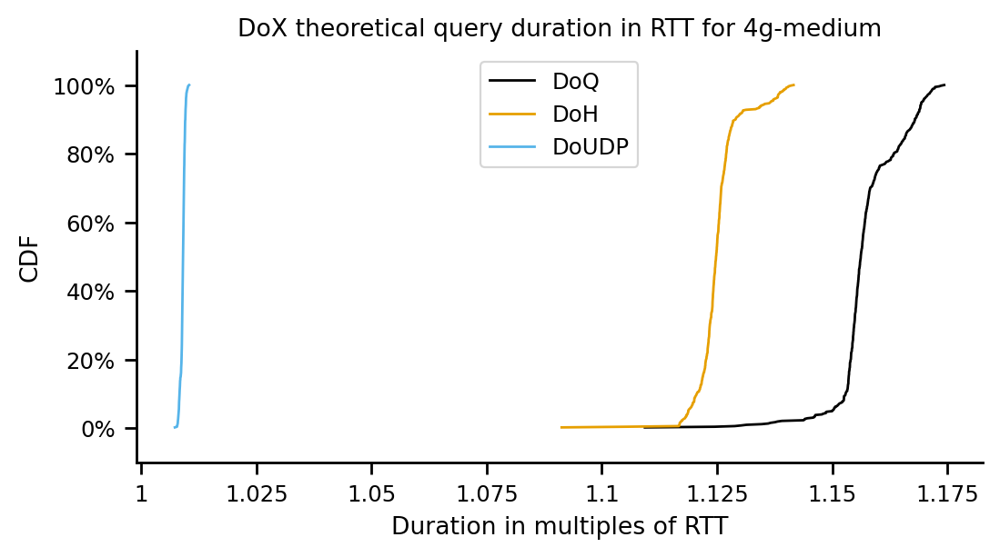

In [913]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       18.530855
std        10.799678
min         5.359322
10%        11.354937
20%        11.927517
25%        12.104646
30%        12.242040
40%        12.530789
50%        13.044499
60%        14.339074
70%        16.323804
75%        16.712897
80%        31.625157
90%        39.653410
100%       41.934123
max        41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    2637.000000
mean       13.502542
std         4.136504
min         5.035782
10%        10.459973
20%        10.707580
25%        10.817557
30%        10.922836
40%        11.209335
50%        11.480346
60%        12.509193
70%        13.052874
75%        13.232838
80%        16.973125
90%        21.507856
100%       23.203308
max        23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    2637.000000
mean        0.994190
std         0.396595
min         0.335197
10%         0.700701
20%         0.741806
25%         0.754479
30%         0.765579
40

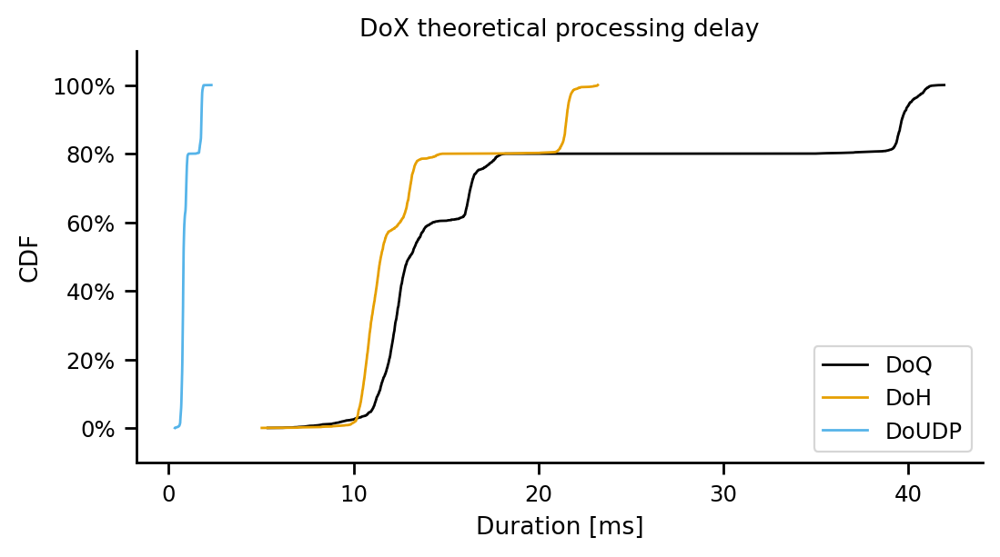

In [914]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)



ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical processing delay')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/processing-delay-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/processing-delay.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      11.393999
std        1.099327
min        5.359322
10%       10.418854
20%       11.031389
25%       11.127121
30%       11.195754
40%       11.348052
50%       11.468157
60%       11.604639
70%       11.812561
75%       11.955607
80%       12.208615
90%       12.622959
100%      13.400516
max       13.400516
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      10.532984
std        0.543556
min        5.035782
10%       10.159740
20%       10.265226
25%       10.325542
30%       10.371001
40%       10.457039
50%       10.521396
60%       10.603199
70%       10.684655
75%       10.728647
80%       10.790377
90%       10.960448
100%      12.495047
max       12.495047
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.720100
std        0.060221
min        0.335197
10%        0.636077
20%        0.680722
25%        0.700250
30%        0.707902
40%        0.719570
50%        0.732663
60% 

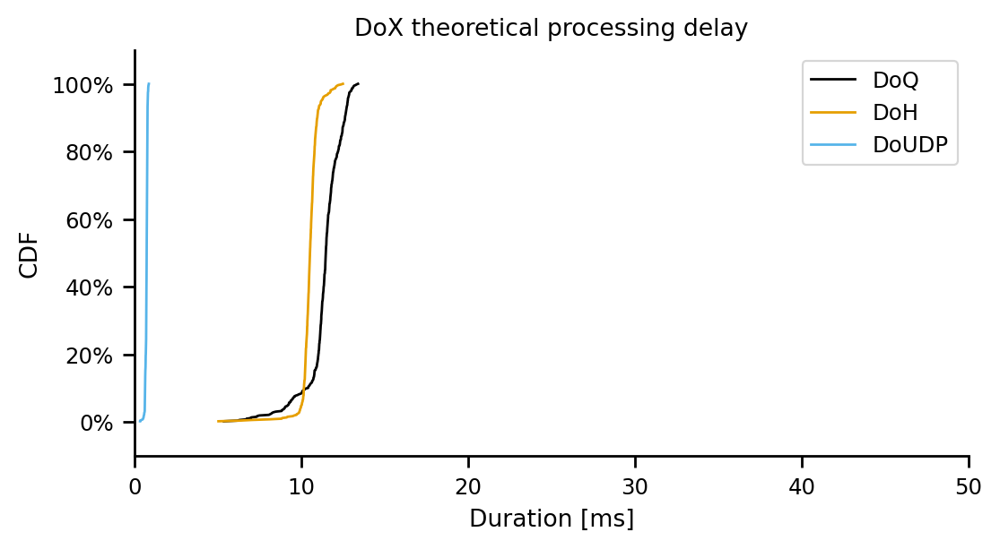

DoQ
count    528.000000
mean      12.611617
std        0.921538
min        7.142917
10%       11.949976
20%       12.238409
25%       12.321127
30%       12.369743
40%       12.470842
50%       12.550935
60%       12.670611
70%       12.847259
75%       12.993842
80%       13.275968
90%       13.751922
100%      14.747563
max       14.747563
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      10.959905
std        0.577704
min        6.902195
10%       10.542209
20%       10.668076
25%       10.725291
30%       10.766446
40%       10.844960
50%       10.916556
60%       10.987787
70%       11.079276
75%       11.129310
80%       11.184996
90%       11.386717
100%      13.217810
max       13.217810
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       0.777970
std        0.060919
min        0.379071
10%        0.697757
20%        0.748757
25%        0.762768
30%        0.770506
40%        0.781447
50%        0.789340
60% 

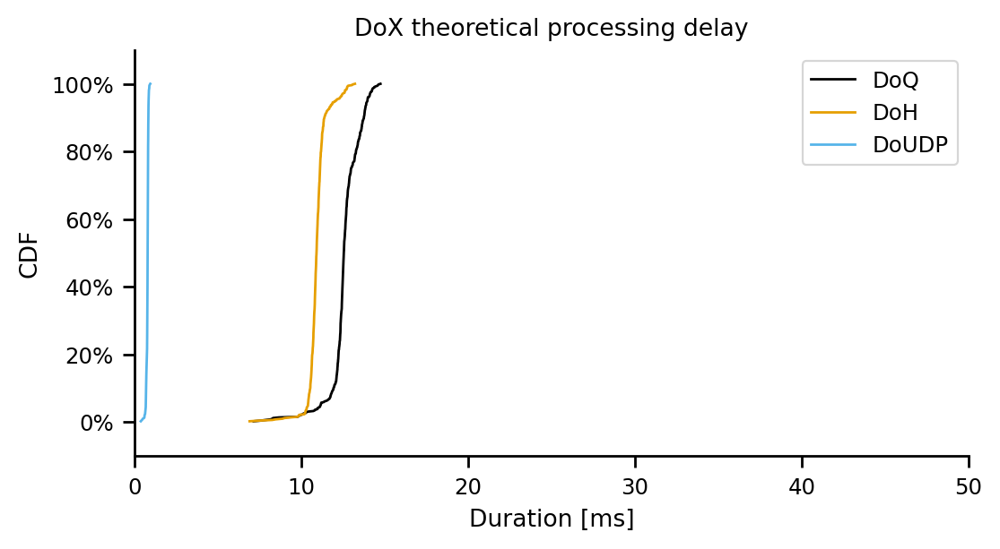

DoQ
count    528.000000
mean      39.755706
std        0.811952
min       34.977470
10%       39.241894
20%       39.390670
25%       39.426975
30%       39.482599
40%       39.572264
50%       39.653708
60%       39.783637
70%       39.988385
75%       40.124626
80%       40.314830
90%       40.821016
100%      41.934123
max       41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      21.518308
std        0.461262
min       17.516603
10%       21.194723
20%       21.355147
25%       21.394914
30%       21.426118
40%       21.465533
50%       21.507895
60%       21.553080
70%       21.601208
75%       21.632970
80%       21.681560
90%       21.825316
100%      23.203308
max       23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       1.763732
std        0.060520
min        1.475840
10%        1.681571
20%        1.735316
25%        1.746549
30%        1.752999
40%        1.760686
50%        1.770404
60% 

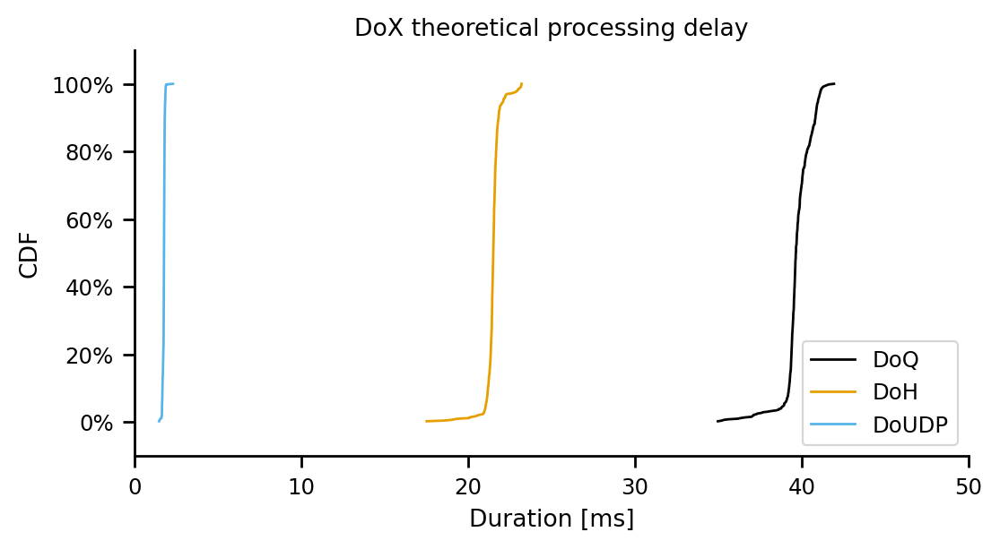

DoQ
count    527.000000
mean      12.397275
std        0.935384
min        6.804983
10%       11.835471
20%       11.982706
25%       12.021882
30%       12.068967
40%       12.155507
50%       12.254099
60%       12.435534
70%       12.729218
75%       13.011937
80%       13.222828
90%       13.480690
100%      14.403524
max       14.403524
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      11.408146
std        0.524603
min        6.966863
10%       10.946873
20%       11.184287
25%       11.228815
30%       11.268820
40%       11.334753
50%       11.388692
60%       11.463430
70%       11.552185
75%       11.598627
80%       11.638897
90%       11.799064
100%      13.447409
max       13.447409
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.764019
std        0.051577
min        0.372522
10%        0.688547
20%        0.733238
25%        0.747292
30%        0.753914
40%        0.766155
50%        0.775199
60% 

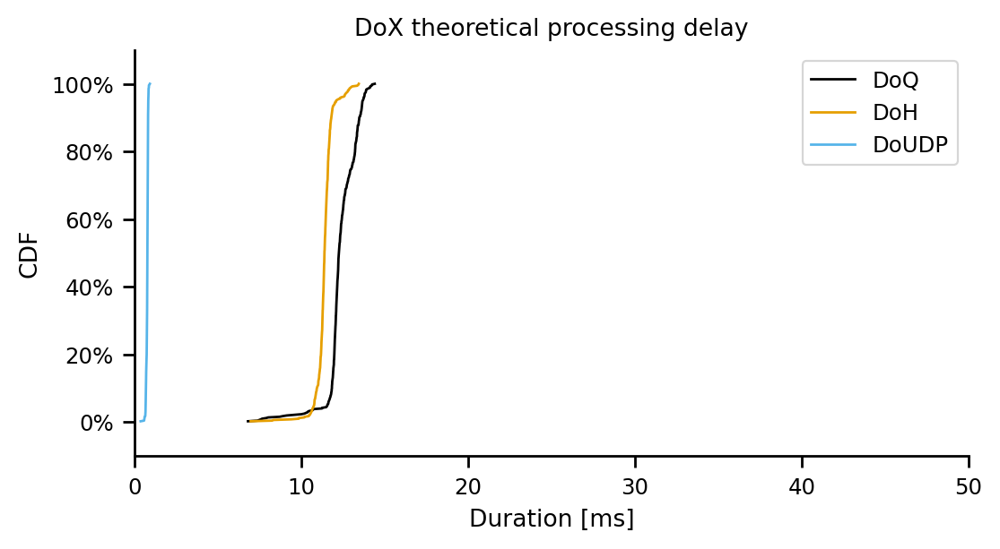

DoQ
count    527.000000
mean      16.466637
std        0.728062
min       11.426261
10%       15.983792
20%       16.099314
25%       16.140348
30%       16.174051
40%       16.242328
50%       16.323709
60%       16.416609
70%       16.540046
75%       16.706372
80%       17.075656
90%       17.552140
100%      18.215904
max       18.215904
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      13.082980
std        0.487503
min        9.538345
10%       12.610365
20%       12.819322
25%       12.869519
30%       12.899959
40%       12.978643
50%       13.041473
60%       13.104254
70%       13.157846
75%       13.224614
80%       13.274287
90%       13.484997
100%      14.799214
max       14.799214
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.944077
std        0.048134
min        0.763412
10%        0.869219
20%        0.914746
25%        0.922919
30%        0.927913
40%        0.939191
50%        0.948631
60% 

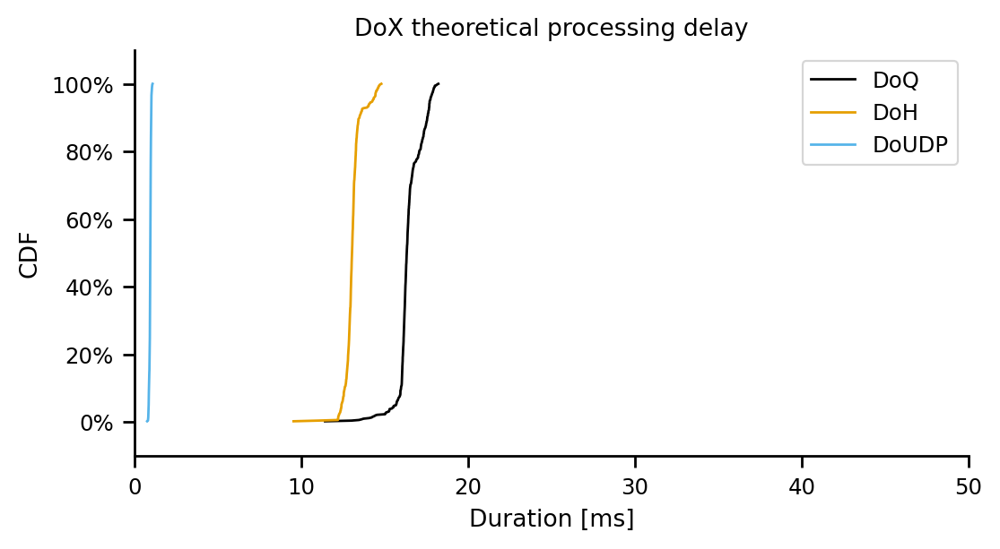

In [915]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical processing delay')

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 50)
    ax.legend()


    if log:
        fig.savefig('figures/processing-delay-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/processing-delay-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [1164]:
median_doq_0rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doq_0rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doq_0rtt_4g_med/(median_doq_0rtt_4g/100))-100)+"%")

5.940327520561127%


In [1165]:
median_doudp_1rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doudp_1rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doudp_1rtt_4g_med/(median_doudp_1rtt_4g/100))-100)+"%")

4.620898472600999%


In [1166]:
df_handshake_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'handshake'].copy()
df_handshake_durations = pd.merge(df_handshake_durations, measurements, on='msm_id')
df_handshake_durations['rtt'] = 0
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'dsl', 42.35979, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'cable', 25.17665, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'fiber', 14.767147, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g', 91.85231065904635, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_handshake_durations['rtt'])
df_handshake_durations['duration_in_rtt'] = df_handshake_durations['duration'] / df_handshake_durations['rtt']

DoQ
count    2637.000000
mean        1.376283
std         0.225765
min         1.055043
10%         1.114798
20%         1.119619
25%         1.121158
30%         1.122994
40%         1.225375
50%         1.426826
60%         1.479061
70%         1.549919
75%         1.554307
80%         1.577357
90%         1.671234
100%        1.803969
max         1.803969
Name: duration_in_rtt, dtype: float64


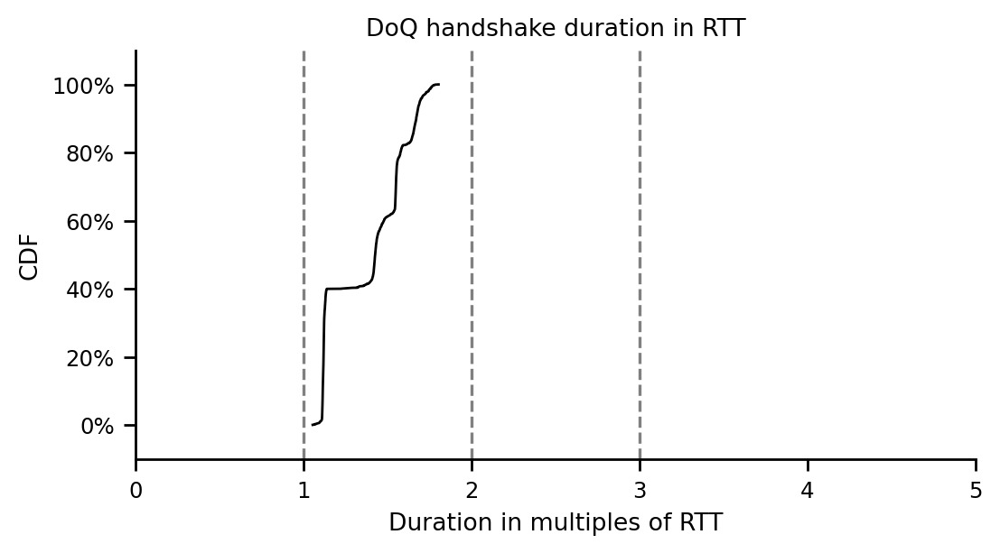

In [919]:
df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoQ handshake duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)


if log:
    fig.savefig('figures/handshake-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/handshake-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.662454
std        0.073046
min        1.288553
10%        1.589256
20%        1.644587
25%        1.650449
30%        1.655977
40%        1.662520
50%        1.671265
60%        1.678234
70%        1.687948
75%        1.692547
80%        1.705062
90%        1.744318
100%       1.803969
max        1.803969
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1.050323
70%        1.050888
75%        1.051176
80%        1.051515
90%        1.052592
100%       1.058359
max        1.058359
Name: duration_in_rtt, dtype: float64


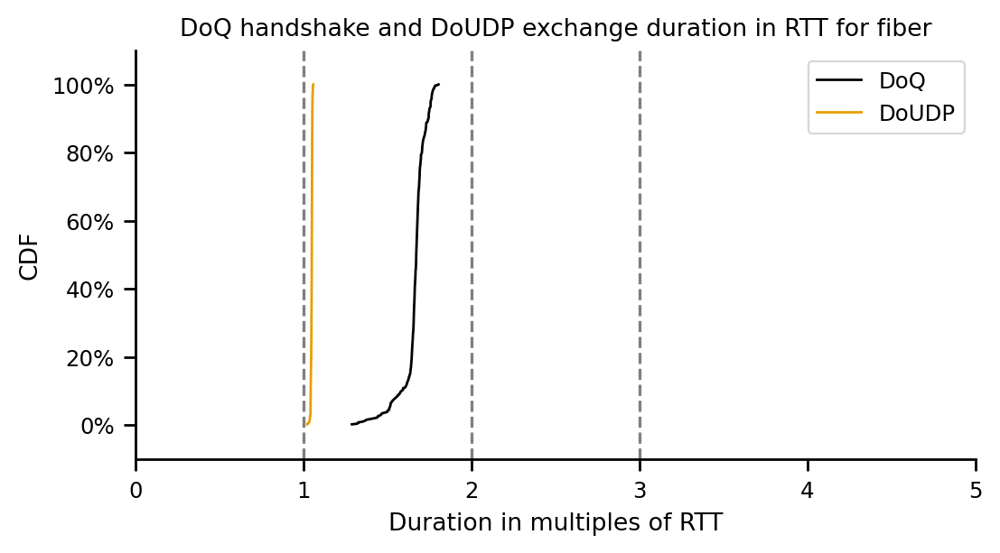

DoQ
count    528.000000
mean       1.427204
std        0.034331
min        1.223631
10%        1.403055
20%        1.415836
25%        1.418588
30%        1.420129
40%        1.423885
50%        1.427341
60%        1.431065
70%        1.436151
75%        1.439987
80%        1.445973
90%        1.465922
100%       1.505890
max        1.505890
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1.031713
70%        1.032001
75%        1.032186
80%        1.032428
90%        1.033141
100%       1.037678
max        1.037678
Name: duration_in_rtt, dtype: float64


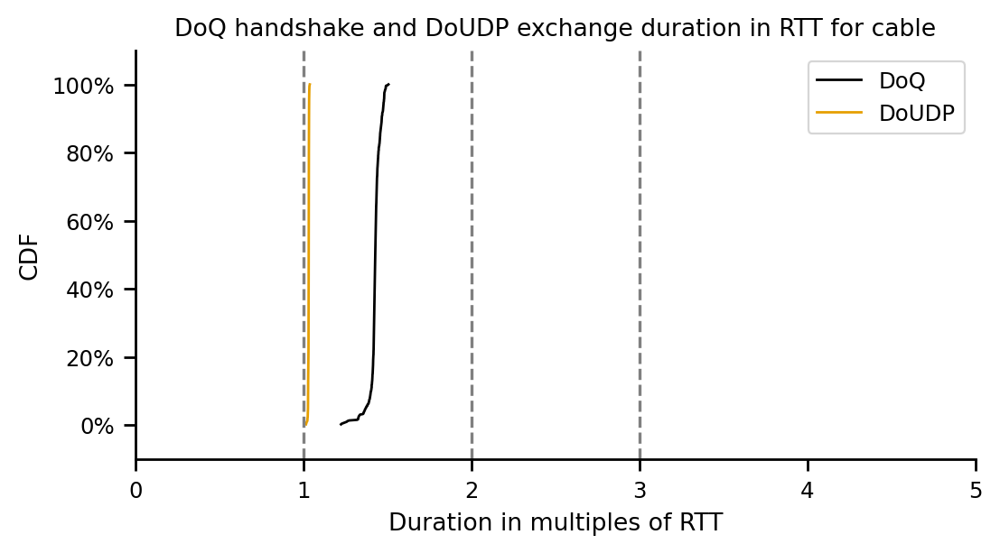

DoQ
count    528.000000
mean       1.552960
std        0.018005
min        1.444715
10%        1.544357
20%        1.546938
25%        1.547563
30%        1.548638
40%        1.549747
50%        1.551231
60%        1.553126
70%        1.554816
75%        1.557248
80%        1.560581
90%        1.577056
100%       1.590375
max        1.590375
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1.042007
70%        1.042229
75%        1.042368
80%        1.042504
90%        1.042962
100%       1.054495
max        1.054495
Name: duration_in_rtt, dtype: float64


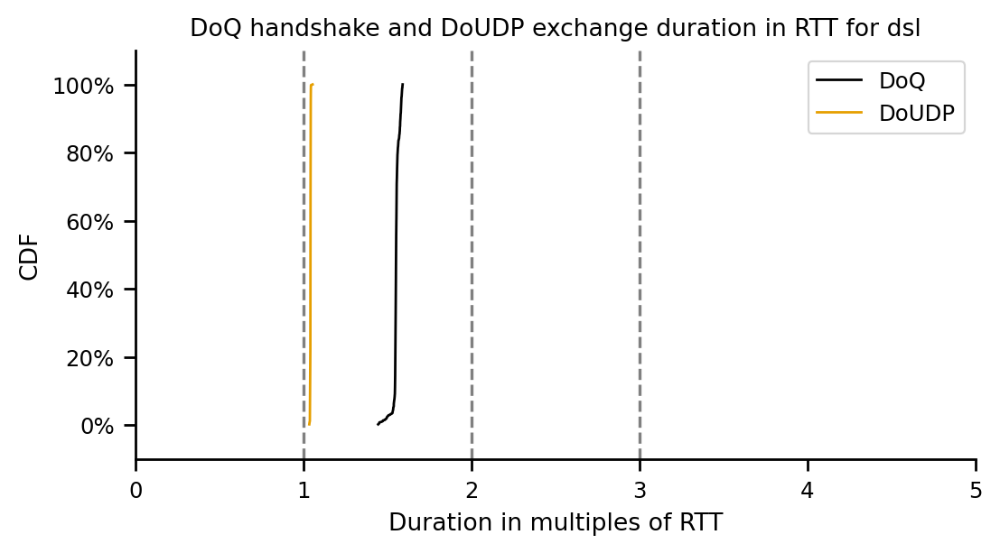

DoQ
count    527.000000
mean       1.116343
std        0.009602
min        1.055043
10%        1.111274
20%        1.112655
25%        1.113073
30%        1.113602
40%        1.114346
50%        1.115190
60%        1.116235
70%        1.117807
75%        1.119498
80%        1.123123
90%        1.128407
100%       1.136753
max        1.136753
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1.008501
70%        1.008597
75%        1.008628
80%        1.008689
90%        1.008869
100%       1.010055
max        1.010055
Name: duration_in_rtt, dtype: float64


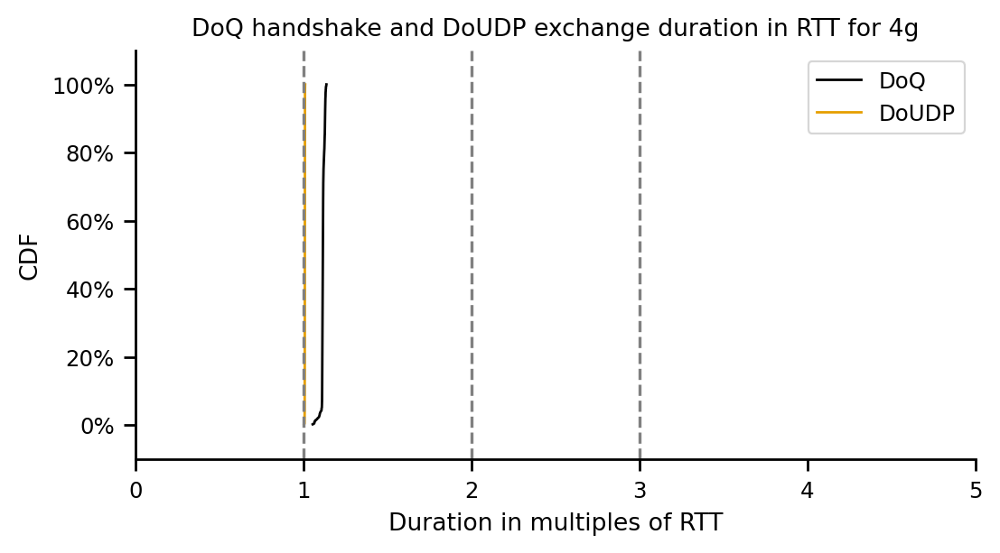

DoQ
count    527.000000
mean       1.122024
std        0.006585
min        1.076623
10%        1.117955
20%        1.119210
25%        1.119624
30%        1.119957
40%        1.120621
50%        1.121290
60%        1.122009
70%        1.122912
75%        1.123371
80%        1.124828
90%        1.131316
100%       1.139235
max        1.139235
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1.009177
70%        1.009275
75%        1.009325
80%        1.009385
90%        1.009568
100%       1.010405
max        1.010405
Name: duration_in_rtt, dtype: float64


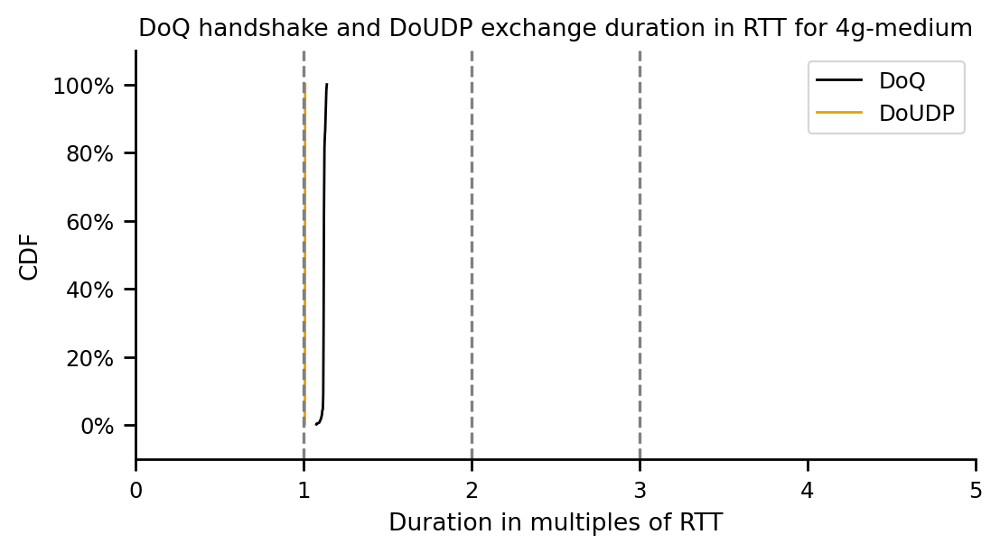

In [920]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoQ handshake and DoUDP exchange duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [1167]:
df_tcp_pings = pd.DataFrame(columns=['duration', 'experiment_type'], )
for access_tech in ['dsl', 'cable', 'fiber', '4g', '4g-medium']:
    df_tmp = pd.read_csv('tcp_ping_'+access_tech+'.log', sep=" ", header=None, names=['len', 'ip', 'ttl', '??', 'id', 'port', 'flags', 'seq', 'cwin', 'duration', 'unit'])
    if df_tmp['unit'].nunique() > 1:
        print('error, unit that isnt miliseconds in data')
    df_tmp['experiment_type'] = access_tech
    #df_tmp.rename(columns=lambda x: x.replace('0', 'duration'), inplace=True)
    df_tmp = df_tmp[['duration', 'experiment_type']]
    df_tmp = df_tmp.apply(lambda s: s.str.replace('rtt=', ''))
    df_tmp['duration'] = pd.to_numeric(df_tmp['duration'])
    df_tcp_pings = pd.concat([df_tcp_pings, df_tmp])
df_tcp_pings
df_tcp_pings['rtt'] = 0
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'dsl', 42.35979, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'cable', 25.17665, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'fiber', 14.767147, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g', 91.85231065904635, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g-medium', 104.5041425140391, df_tcp_pings['rtt'])
df_tcp_pings['duration_in_rtt'] = df_tcp_pings['duration'] / df_tcp_pings['rtt']
df_tcp_pings['transport_protocol'] = 'TCP ping'
df_tcp_pings

,duration,experiment_type,rtt,duration_in_rtt,transport_protocol
0,47.8,dsl,42.359790,1.128429,TCP ping
1,47.8,dsl,42.359790,1.128429,TCP ping
2,47.8,dsl,42.359790,1.128429,TCP ping
3,47.8,dsl,42.359790,1.128429,TCP ping
4,47.8,dsl,42.359790,1.128429,TCP ping
...,...,...,...,...,...
1970,111.9,4g-medium,104.504143,1.070771,TCP ping
1971,111.8,4g-medium,104.504143,1.069814,TCP ping
1972,111.8,4g-medium,104.504143,1.069814,TCP ping
1973,111.8,4g-medium,104.504143,1.069814,TCP ping


In [1168]:
df_tcp_pings[df_tcp_pings.duration_in_rtt > 5]

,duration,experiment_type,rtt,duration_in_rtt,transport_protocol
725,1047.8,dsl,42.359790,24.735722,TCP ping
829,1047.9,dsl,42.359790,24.738083,TCP ping
954,1047.8,dsl,42.359790,24.735722,TCP ping
1259,1047.8,dsl,42.359790,24.735722,TCP ping
1282,1047.8,dsl,42.359790,24.735722,TCP ping
1584,1043.8,dsl,42.359790,24.641293,TCP ping
1758,1047.8,dsl,42.359790,24.735722,TCP ping
64,1031.9,cable,25.176650,40.986390,TCP ping
142,1031.8,cable,25.176650,40.982418,TCP ping
434,1031.9,cable,25.176650,40.986390,TCP ping


DoQ
count    1975.000000
mean        1.659967
std         0.077635
min         1.284216
10%         1.593619
20%         1.640051
25%         1.648589
30%         1.655421
40%         1.664163
50%         1.670997
60%         1.678984
70%         1.687650
75%         1.693350
80%         1.700989
90%         1.739498
100%        1.821256
max         1.821256
Name: duration_in_rtt, dtype: float64
TCP ping
count    1972.000000
mean        1.077721
std         0.038910
min         1.069943
10%         1.069943
20%         1.069943
25%         1.069943
30%         1.069943
40%         1.069943
50%         1.069943
60%         1.069943
70%         1.076714
75%         1.076714
80%         1.076714
90%         1.076714
100%        1.347586
max         1.347586
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.048463
std         0.004684
min         1.018970
10%         1.042846
20%         1.045542
25%         1.047229
30%         1.047866
40%         1.048669
50

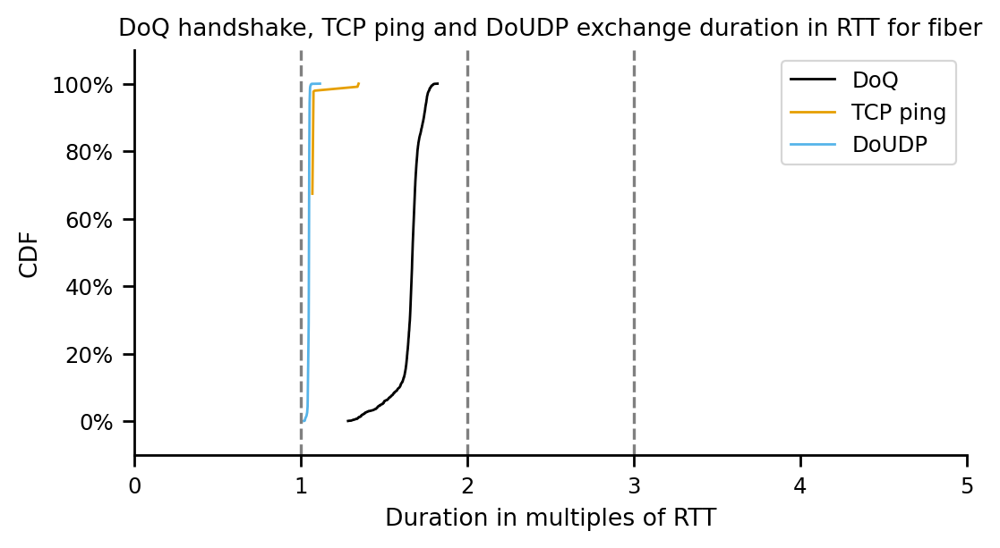

DoQ
count    1975.000000
mean        1.428902
std         0.033800
min         1.204521
10%         1.401699
20%         1.415678
25%         1.418302
30%         1.420498
40%         1.424162
50%         1.428212
60%         1.431944
70%         1.436657
75%         1.441250
80%         1.449977
90%         1.472510
100%        1.509719
max         1.509719
Name: duration_in_rtt, dtype: float64
TCP ping
count    1971.000000
mean        1.260125
std         0.026154
min         1.104198
10%         1.263075
20%         1.263075
25%         1.263075
30%         1.263075
40%         1.263075
50%         1.263075
60%         1.263075
70%         1.267047
75%         1.267047
80%         1.267047
90%         1.267047
100%        1.271019
max         1.271019
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.030966
std         0.002439
min         1.015337
10%         1.027856
20%         1.029643
25%         1.030283
30%         1.030582
40%         1.031020
50

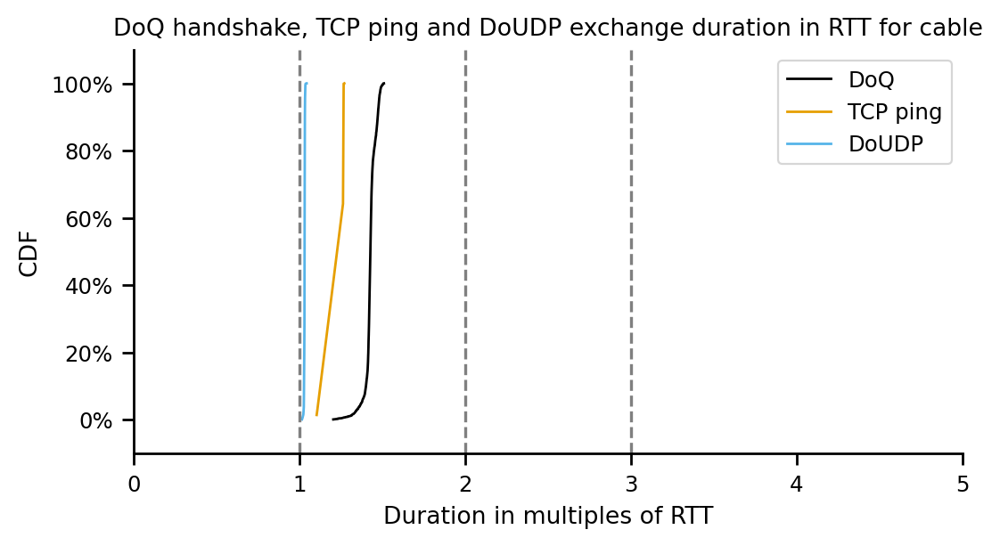

DoQ
count    1975.000000
mean        1.554308
std         0.017162
min         1.433273
10%         1.543720
20%         1.546826
25%         1.547785
30%         1.548474
40%         1.549951
50%         1.551428
60%         1.553370
70%         1.556229
75%         1.558481
80%         1.564798
90%         1.579013
100%        1.598315
max         1.598315
Name: duration_in_rtt, dtype: float64
TCP ping
count    1970.000000
mean        1.127550
std         0.012207
min         1.033999
10%         1.128429
20%         1.128429
25%         1.128429
30%         1.128429
40%         1.128429
50%         1.128429
60%         1.128429
70%         1.128429
75%         1.130789
80%         1.130789
90%         1.130789
100%        1.133150
max         1.133150
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.041545
std         0.001581
min         1.030898
10%         1.039711
20%         1.040698
25%         1.041111
30%         1.041264
40%         1.041535
50

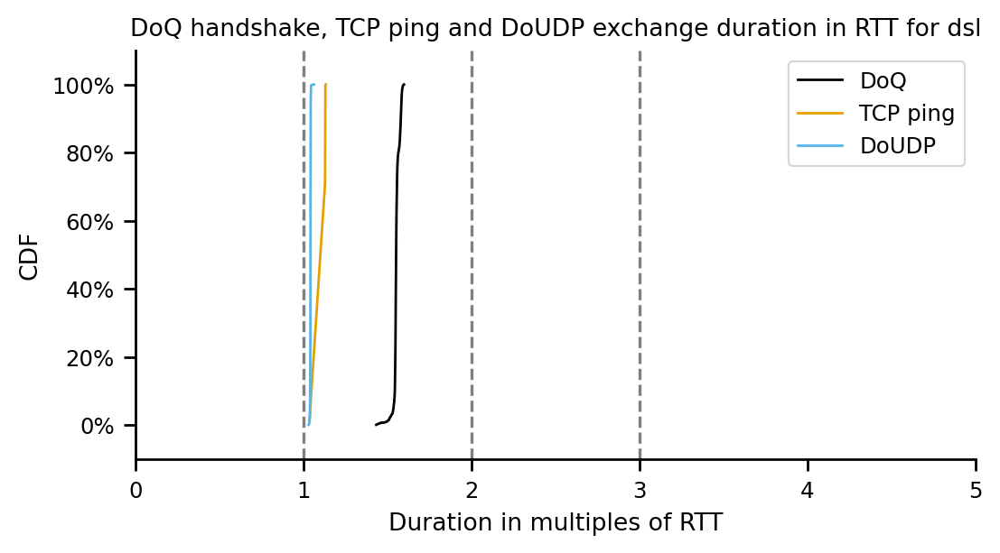

DoQ
count    1975.000000
mean        1.116056
std         0.008057
min         1.062420
10%         1.110968
20%         1.112295
25%         1.112815
30%         1.113302
40%         1.114127
50%         1.115002
60%         1.115938
70%         1.117220
75%         1.118494
80%         1.120595
90%         1.127387
100%        1.137688
max         1.137688
Name: duration_in_rtt, dtype: float64
TCP ping
count    1966.000000
mean        1.044190
std         0.006337
min         1.042979
10%         1.042979
20%         1.042979
25%         1.042979
30%         1.042979
40%         1.042979
50%         1.042979
60%         1.042979
70%         1.044067
75%         1.044067
80%         1.044067
90%         1.044067
100%        1.130075
max         1.130075
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.008328
std         0.000672
min         1.003819
10%         1.007515
20%         1.008038
25%         1.008153
30%         1.008219
40%         1.008334
50

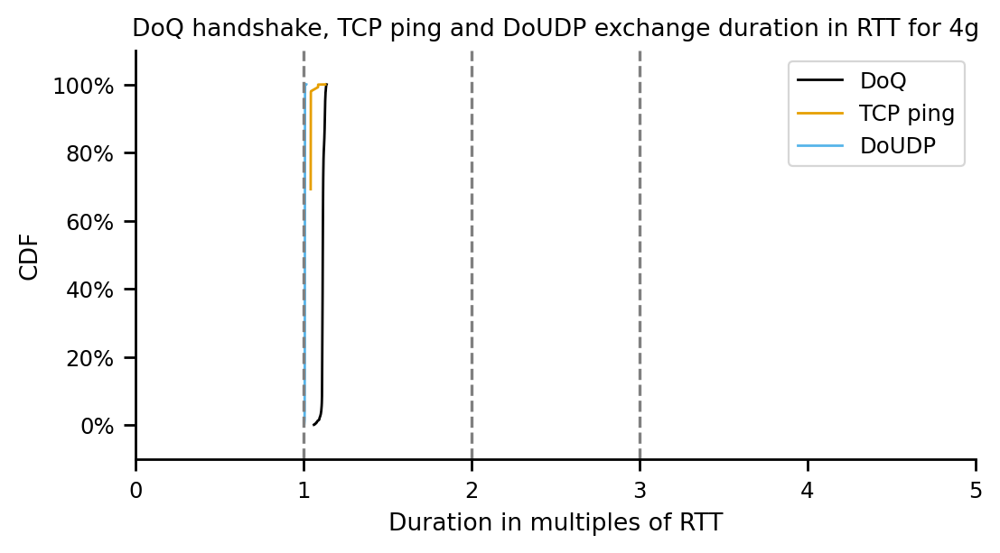

DoQ
count    1975.000000
mean        1.122372
std         0.007514
min         1.071521
10%         1.117764
20%         1.119184
25%         1.119606
30%         1.120053
40%         1.120762
50%         1.121489
60%         1.122450
70%         1.123681
75%         1.124724
80%         1.127414
90%         1.132419
100%        1.140794
max         1.140794
Name: duration_in_rtt, dtype: float64
TCP ping
count    1969.000000
mean        1.069368
std         0.005315
min         1.031538
10%         1.069814
20%         1.069814
25%         1.069814
30%         1.069814
40%         1.069814
50%         1.069814
60%         1.069814
70%         1.070771
75%         1.070771
80%         1.070771
90%         1.070771
100%        1.071728
max         1.071728
Name: duration_in_rtt, dtype: float64
DoUDP
count    1975.000000
mean        1.008976
std         0.000565
min         1.005500
10%         1.008237
20%         1.008723
25%         1.008802
30%         1.008867
40%         1.008970
50

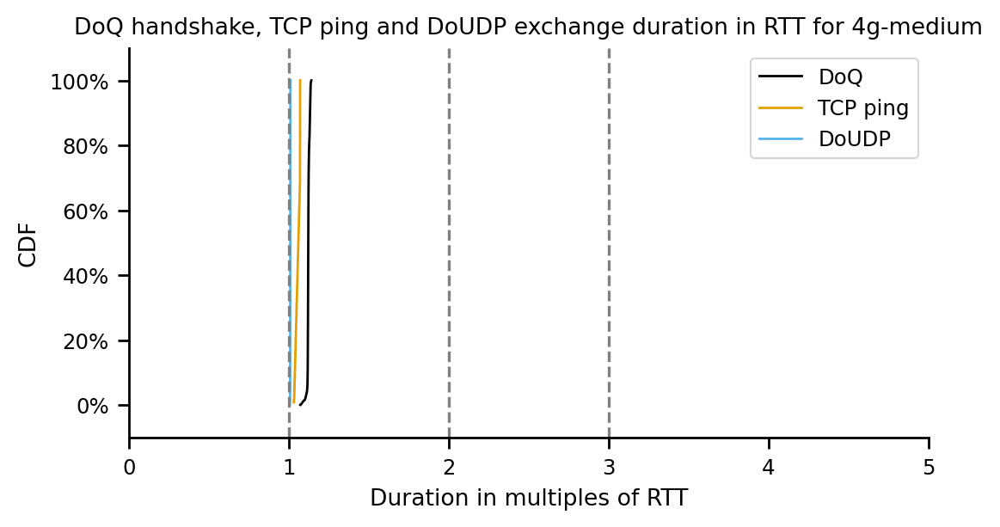

In [1169]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'TCP ping', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
        if proto == "TCP ping":
            df_tmp = df_tcp_pings[(df_tcp_pings.experiment_type == tech) & (df_tcp_pings.duration_in_rtt <= 5)]
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoQ handshake, TCP ping and DoUDP exchange duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    9875.000000
mean        1.376321
std         0.225714
min         1.062420
10%         1.114558
20%         1.119373
25%         1.121101
30%         1.123271
40%         1.179030
50%         1.426947
60%         1.480113
70%         1.550266
75%         1.555253
80%         1.579436
90%         1.670993
100%        1.821256
max         1.821256
Name: duration_in_rtt, dtype: float64
TCP ping
count    9848.000000
mean        1.115831
std         0.080160
min         1.031538
10%         1.042979
20%         1.044067
25%         1.069814
30%         1.069814
40%         1.069943
50%         1.070771
60%         1.104198
70%         1.128429
75%         1.130789
80%         1.130789
90%         1.263075
100%        1.347586
max         1.347586
Name: duration_in_rtt, dtype: float64
DoUDP
count    9875.000000
mean        1.027656
std         0.016677
min         1.003819
10%         1.008318
20%         1.008717
25%         1.008906
30%         1.009101
40%         1.015500
50

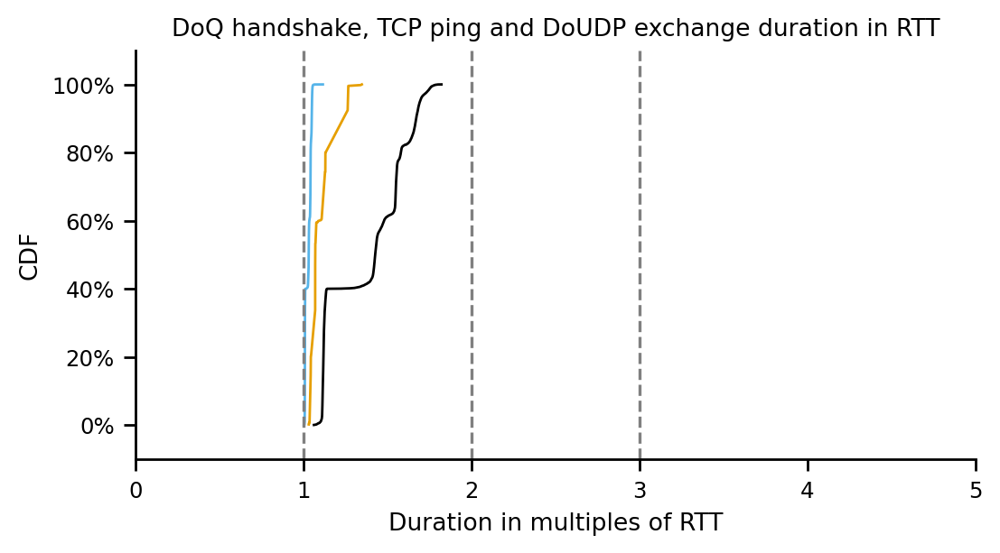

In [1170]:
#df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'TCP ping', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    if proto == "DoQ":
        df_tmp = df_handshake_durations
    if proto == "DoUDP":
        df_tmp = df_exchange_durations
    if proto == "TCP ping":
        df_tmp = df_tcp_pings[(df_tcp_pings.duration_in_rtt <= 5)]
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoQ handshake, TCP ping and DoUDP exchange duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)


if log:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1171]:
df_dns_and_h3['connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['connectStart']
df_dns_and_h3['secure_connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['secureConnectionStart']

In [1179]:
df_h3_connect_times = df_dns_and_h3[['experiment_type', 'h3_description', 'connect_duration', 'secure_connect_duration', 'msm_id']].copy()
df_h3_connect_times = df_h3_connect_times.drop_duplicates()
df_h3_connect_times['rtt'] = 0
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'dsl', 42.35979, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'cable', 25.17665, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'fiber', 14.767147, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g', 91.85231065904635, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g-medium', 104.5041425140391, df_h3_connect_times['rtt'])
df_h3_connect_times['connect_in_rtt'] = df_h3_connect_times['connect_duration'] / df_h3_connect_times['rtt']
df_h3_connect_times['secure_connect_in_rtt'] = df_h3_connect_times['secure_connect_duration'] / df_h3_connect_times['rtt']

count    9875.000000
mean       68.360314
std        36.248614
min        18.500000
10%        23.800000
20%        29.680000
25%        34.900000
30%        35.300000
40%        51.340000
50%        65.500000
60%        79.160000
70%       101.900000
75%       102.000000
80%       107.100000
90%       116.700000
100%      118.700000
max       118.700000
Name: connect_duration, dtype: float64
count    9875.00000
mean       62.51123
std        36.05303
min        16.50000
10%        18.20000
20%        27.16000
25%        29.20000
30%        29.40000
40%        46.86000
50%        58.90000
60%        74.18000
70%        95.80000
75%        95.90000
80%       100.04000
90%       110.60000
100%      112.50000
max       112.50000
Name: connect_duration, dtype: float64


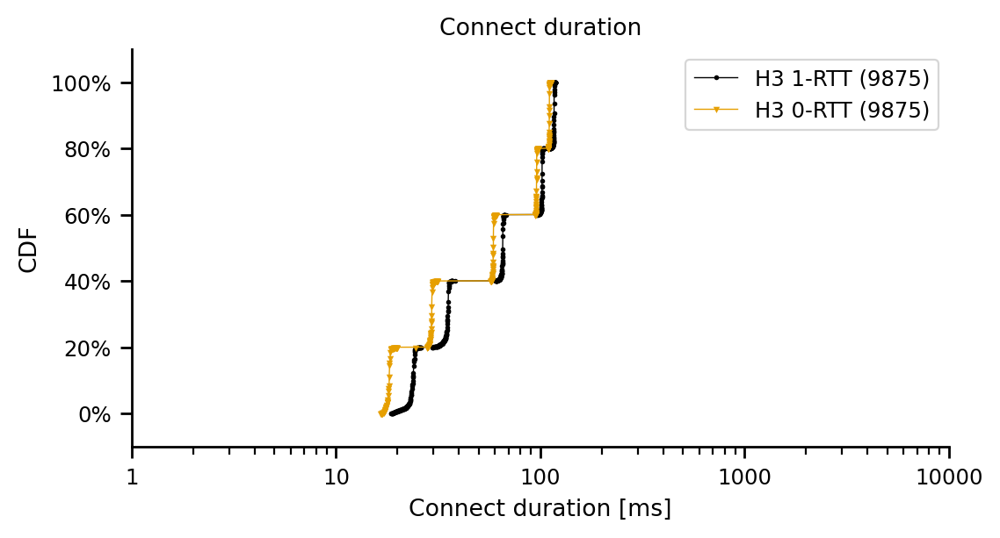

In [1180]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_duration']) == 0:
            continue
        print(df_tmp['connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration')

ax.set_xlabel('Connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    9875.000000
mean        1.347695
std         0.208031
min         1.047333
10%         1.108301
20%         1.111567
25%         1.113831
30%         1.116702
40%         1.169845
50%         1.398121
60%         1.417981
70%         1.541556
75%         1.546278
80%         1.548638
90%         1.611686
100%        2.004449
max         2.004449
Name: connect_in_rtt, dtype: float64
count    9875.000000
mean        1.176172
std         0.127069
min         1.024471
10%         1.042979
20%         1.049719
25%         1.057374
30%         1.058331
40%         1.093124
50%         1.167749
60%         1.178291
70%         1.232466
75%         1.239237
80%         1.351141
90%         1.390470
100%        1.665860
max         1.665860
Name: connect_in_rtt, dtype: float64


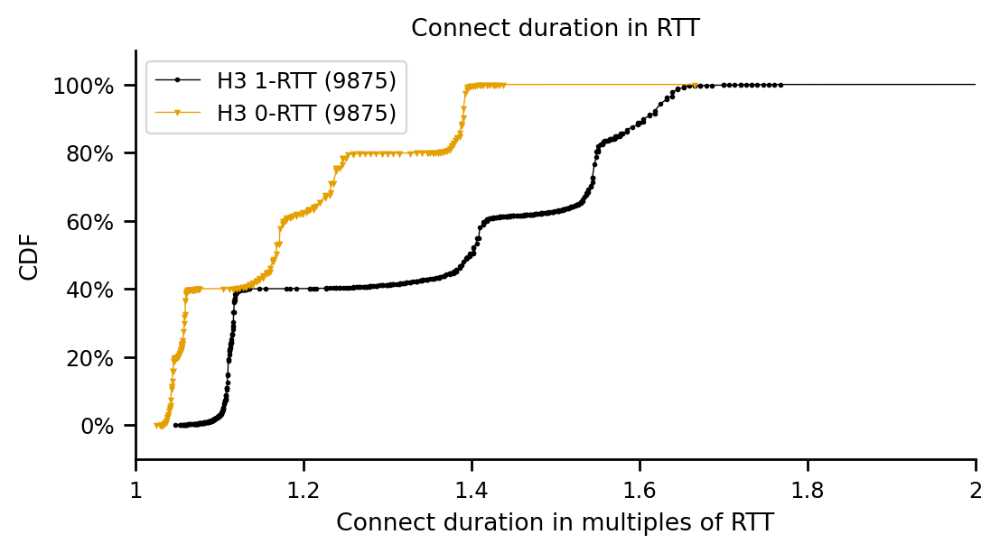

In [1181]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_in_rtt']) == 0:
            continue
        print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration in RTT')

ax.set_xlabel('Connect duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1975.000000
mean        1.539994
std         0.017537
min         1.418798
10%         1.522670
20%         1.534474
25%         1.536835
30%         1.539196
40%         1.543917
50%         1.546278
60%         1.546278
70%         1.548638
75%         1.548638
80%         1.548638
90%         1.550999
100%        1.600575
max         1.600575
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.388268
std         0.008033
min         1.347976
10%         1.376305
20%         1.383387
25%         1.385748
30%         1.388109
40%         1.388109
50%         1.390470
60%         1.390470
70%         1.392830
75%         1.392830
80%         1.392830
90%         1.395191
100%        1.437684
max         1.437684
Name: connect_in_rtt, dtype: float64


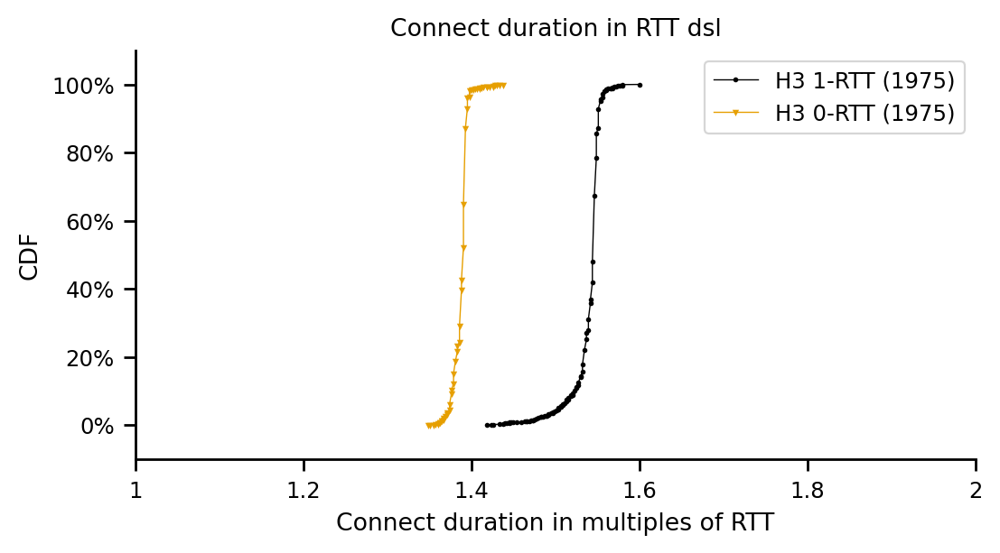

count    1975.000000
mean        1.389151
std         0.037369
min         1.179664
10%         1.342514
20%         1.378261
25%         1.386205
30%         1.390177
40%         1.394149
50%         1.402093
60%         1.406065
70%         1.410037
75%         1.410037
80%         1.410037
90%         1.414009
100%        1.517279
max         1.517279
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.164306
std         0.014210
min         1.104198
10%         1.143917
20%         1.155833
25%         1.159805
30%         1.163777
40%         1.163777
50%         1.167749
60%         1.167749
70%         1.171721
75%         1.171721
80%         1.171721
90%         1.175693
100%        1.251159
max         1.251159
Name: connect_in_rtt, dtype: float64


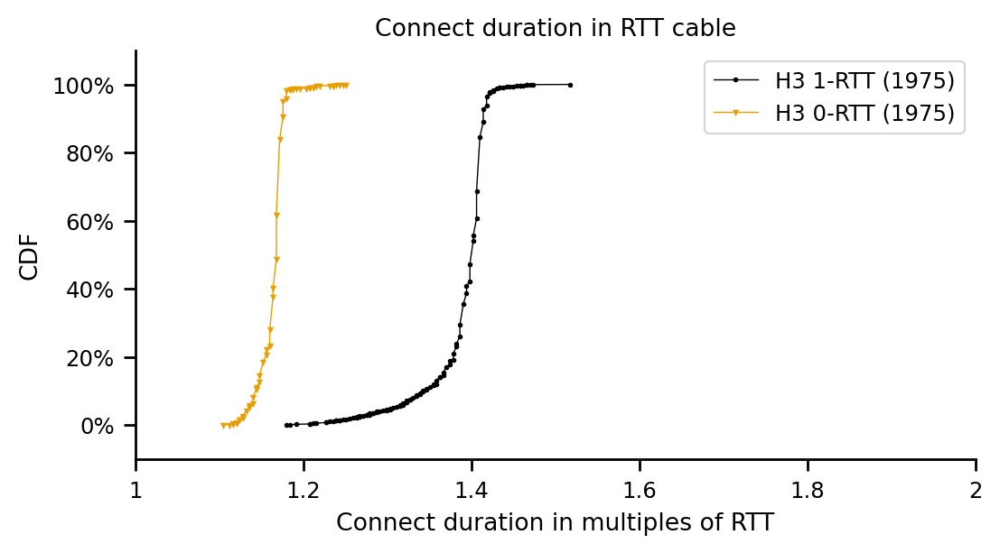

count    1975.000000
mean        1.587852
std         0.076477
min         1.252781
10%         1.503337
20%         1.564283
25%         1.577827
30%         1.584599
40%         1.598142
50%         1.611686
60%         1.618458
70%         1.625229
75%         1.632001
80%         1.632001
90%         1.645545
100%        2.004449
max         2.004449
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.227970
std         0.027433
min         1.117345
10%         1.191835
20%         1.212150
25%         1.218922
30%         1.225694
40%         1.232466
50%         1.232466
60%         1.239237
70%         1.239237
75%         1.239237
80%         1.246009
90%         1.246009
100%        1.665860
max         1.665860
Name: connect_in_rtt, dtype: float64


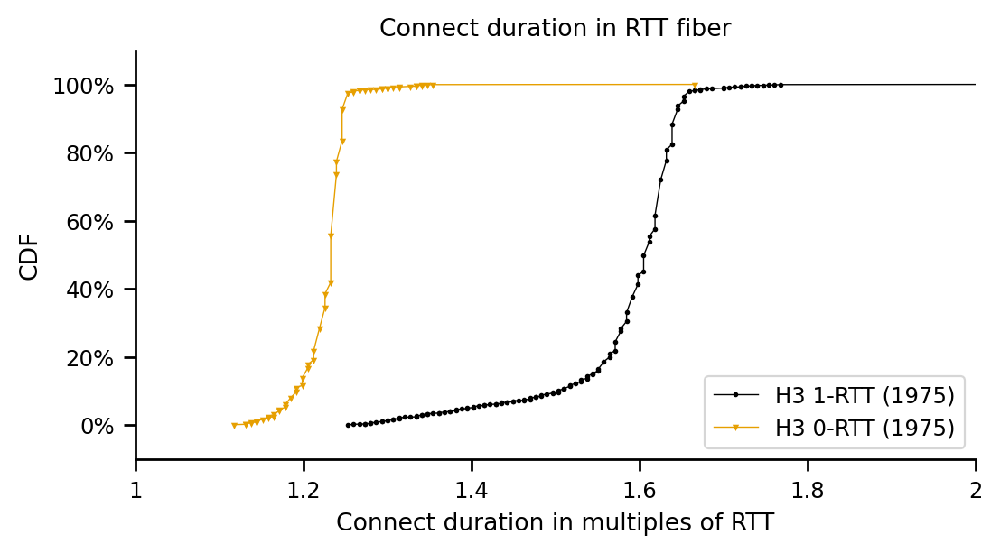

count    1975.000000
mean        1.107186
std         0.008045
min         1.047333
10%         1.100680
20%         1.105035
25%         1.106124
30%         1.107212
40%         1.108301
50%         1.109390
60%         1.109390
70%         1.110478
75%         1.110478
80%         1.110478
90%         1.111567
100%        1.155115
max         1.155115
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.042484
std         0.003474
min         1.024471
10%         1.037535
20%         1.039713
25%         1.040801
30%         1.041890
40%         1.042979
50%         1.042979
60%         1.044067
70%         1.044067
75%         1.044067
80%         1.044285
90%         1.045156
100%        1.064753
max         1.064753
Name: connect_in_rtt, dtype: float64


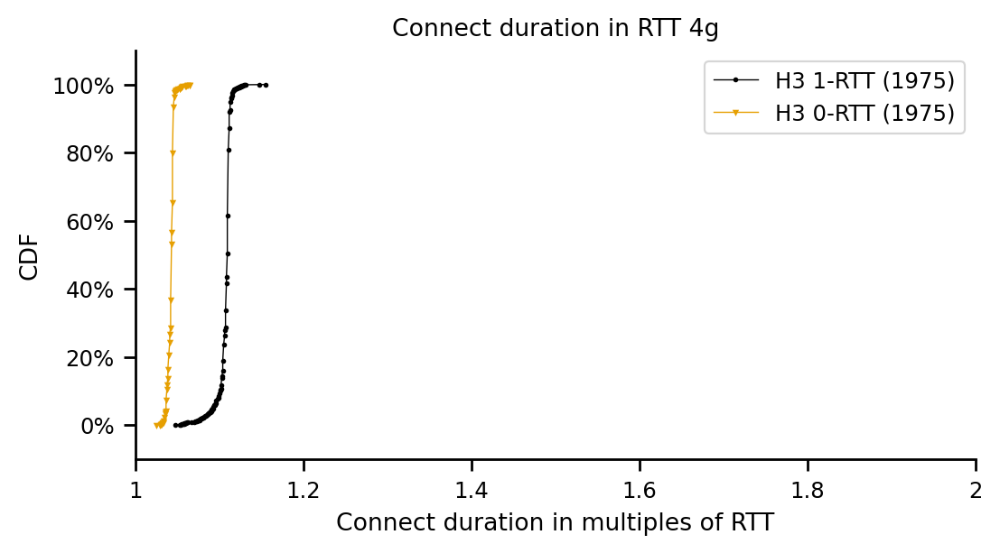

count    1975.000000
mean        1.114290
std         0.007253
min         1.063116
10%         1.108090
20%         1.112875
25%         1.113353
30%         1.114788
40%         1.115745
50%         1.116702
60%         1.116702
70%         1.117659
75%         1.117659
80%         1.117659
90%         1.118616
100%        1.135840
max         1.135840
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.057833
std         0.002999
min         1.043021
10%         1.053547
20%         1.056417
25%         1.056417
30%         1.057374
40%         1.058331
50%         1.058331
60%         1.059288
70%         1.059288
75%         1.059288
80%         1.059288
90%         1.060245
100%        1.076512
max         1.076512
Name: connect_in_rtt, dtype: float64


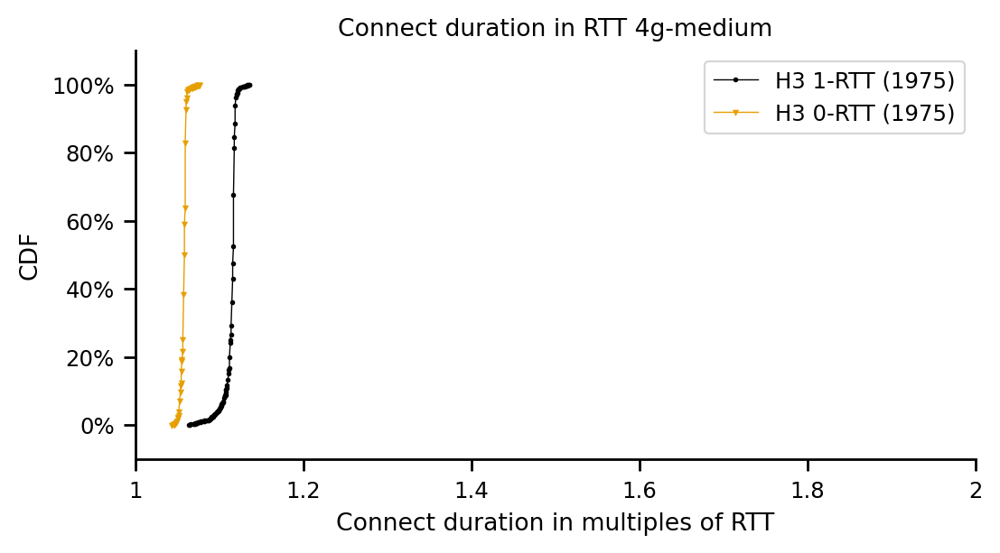

In [1182]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['connect_in_rtt']) == 0:
                continue
            print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration in RTT '+experiment_type)

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

H3 1-RTT
count    1975.000000
mean        1.539994
std         0.017537
min         1.418798
10%         1.522670
20%         1.534474
25%         1.536835
30%         1.539196
40%         1.543917
50%         1.546278
60%         1.546278
70%         1.548638
75%         1.548638
80%         1.548638
90%         1.550999
100%        1.600575
max         1.600575
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1975.000000
mean        1.388268
std         0.008033
min         1.347976
10%         1.376305
20%         1.383387
25%         1.385748
30%         1.388109
40%         1.388109
50%         1.390470
60%         1.390470
70%         1.392830
75%         1.392830
80%         1.392830
90%         1.395191
100%        1.437684
max         1.437684
Name: connect_in_rtt, dtype: float64
DoQ
count    1975.000000
mean        1.554308
std         0.017162
min         1.433273
10%         1.543720
20%         1.546826
25%         1.547785
30%         1.548474
40%         1.549951
5

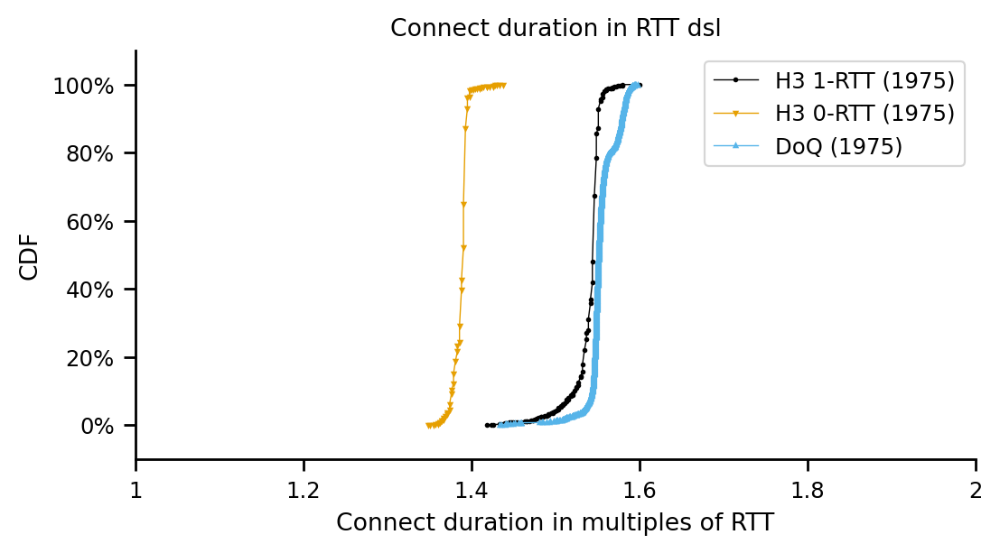

H3 1-RTT
count    1975.000000
mean        1.389151
std         0.037369
min         1.179664
10%         1.342514
20%         1.378261
25%         1.386205
30%         1.390177
40%         1.394149
50%         1.402093
60%         1.406065
70%         1.410037
75%         1.410037
80%         1.410037
90%         1.414009
100%        1.517279
max         1.517279
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1975.000000
mean        1.164306
std         0.014210
min         1.104198
10%         1.143917
20%         1.155833
25%         1.159805
30%         1.163777
40%         1.163777
50%         1.167749
60%         1.167749
70%         1.171721
75%         1.171721
80%         1.171721
90%         1.175693
100%        1.251159
max         1.251159
Name: connect_in_rtt, dtype: float64
DoQ
count    1975.000000
mean        1.428902
std         0.033800
min         1.204521
10%         1.401699
20%         1.415678
25%         1.418302
30%         1.420498
40%         1.424162
5

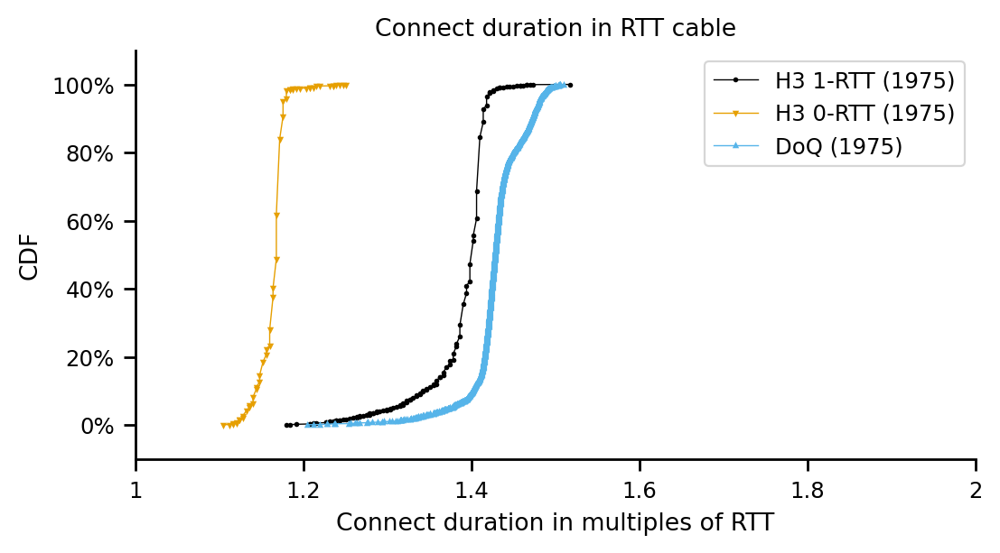

H3 1-RTT
count    1975.000000
mean        1.587852
std         0.076477
min         1.252781
10%         1.503337
20%         1.564283
25%         1.577827
30%         1.584599
40%         1.598142
50%         1.611686
60%         1.618458
70%         1.625229
75%         1.632001
80%         1.632001
90%         1.645545
100%        2.004449
max         2.004449
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1975.000000
mean        1.227970
std         0.027433
min         1.117345
10%         1.191835
20%         1.212150
25%         1.218922
30%         1.225694
40%         1.232466
50%         1.232466
60%         1.239237
70%         1.239237
75%         1.239237
80%         1.246009
90%         1.246009
100%        1.665860
max         1.665860
Name: connect_in_rtt, dtype: float64
DoQ
count    1975.000000
mean        1.659967
std         0.077635
min         1.284216
10%         1.593619
20%         1.640051
25%         1.648589
30%         1.655421
40%         1.664163
5

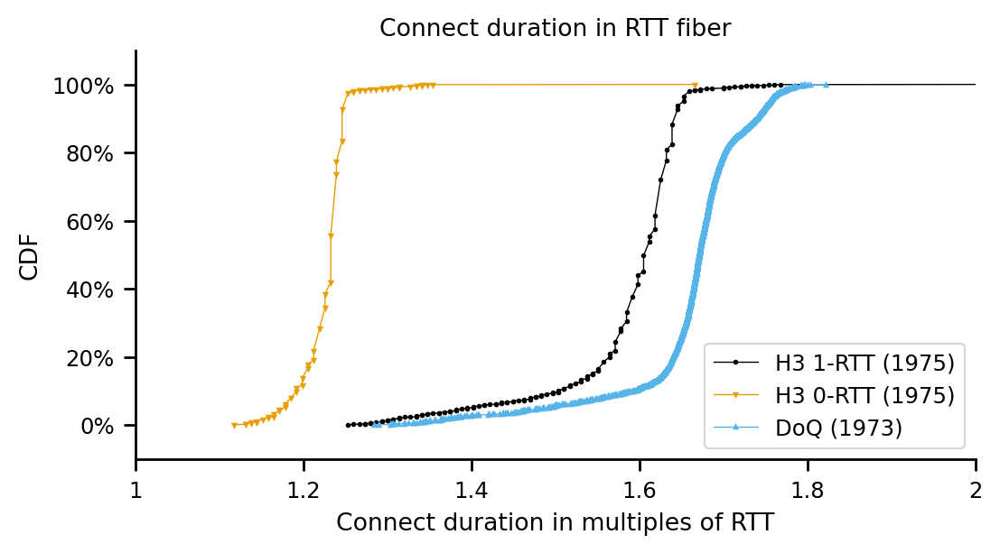

H3 1-RTT
count    1975.000000
mean        1.107186
std         0.008045
min         1.047333
10%         1.100680
20%         1.105035
25%         1.106124
30%         1.107212
40%         1.108301
50%         1.109390
60%         1.109390
70%         1.110478
75%         1.110478
80%         1.110478
90%         1.111567
100%        1.155115
max         1.155115
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1975.000000
mean        1.042484
std         0.003474
min         1.024471
10%         1.037535
20%         1.039713
25%         1.040801
30%         1.041890
40%         1.042979
50%         1.042979
60%         1.044067
70%         1.044067
75%         1.044067
80%         1.044285
90%         1.045156
100%        1.064753
max         1.064753
Name: connect_in_rtt, dtype: float64
DoQ
count    1975.000000
mean        1.116056
std         0.008057
min         1.062420
10%         1.110968
20%         1.112295
25%         1.112815
30%         1.113302
40%         1.114127
5

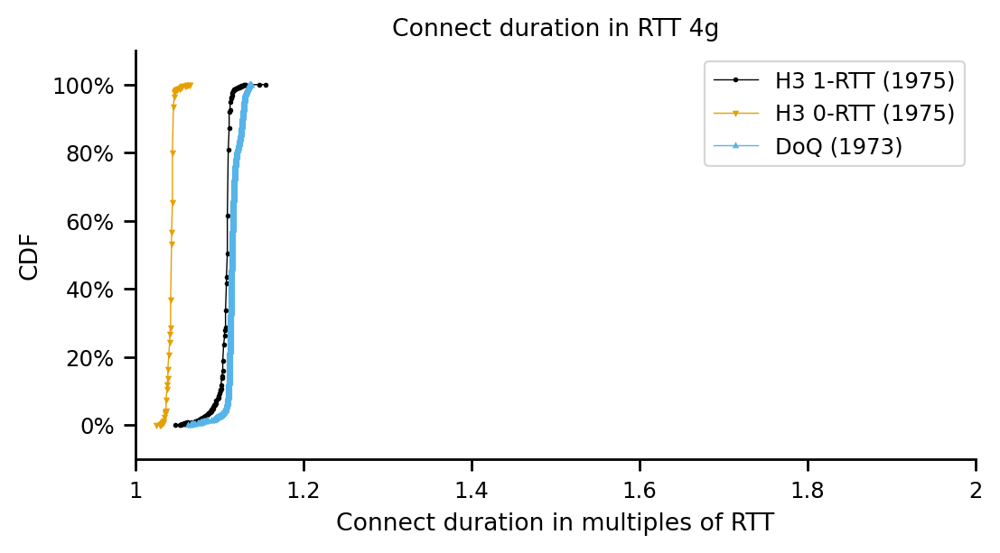

H3 1-RTT
count    1975.000000
mean        1.114290
std         0.007253
min         1.063116
10%         1.108090
20%         1.112875
25%         1.113353
30%         1.114788
40%         1.115745
50%         1.116702
60%         1.116702
70%         1.117659
75%         1.117659
80%         1.117659
90%         1.118616
100%        1.135840
max         1.135840
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1975.000000
mean        1.057833
std         0.002999
min         1.043021
10%         1.053547
20%         1.056417
25%         1.056417
30%         1.057374
40%         1.058331
50%         1.058331
60%         1.059288
70%         1.059288
75%         1.059288
80%         1.059288
90%         1.060245
100%        1.076512
max         1.076512
Name: connect_in_rtt, dtype: float64
DoQ
count    1975.000000
mean        1.122372
std         0.007514
min         1.071521
10%         1.117764
20%         1.119184
25%         1.119606
30%         1.120053
40%         1.120762
5

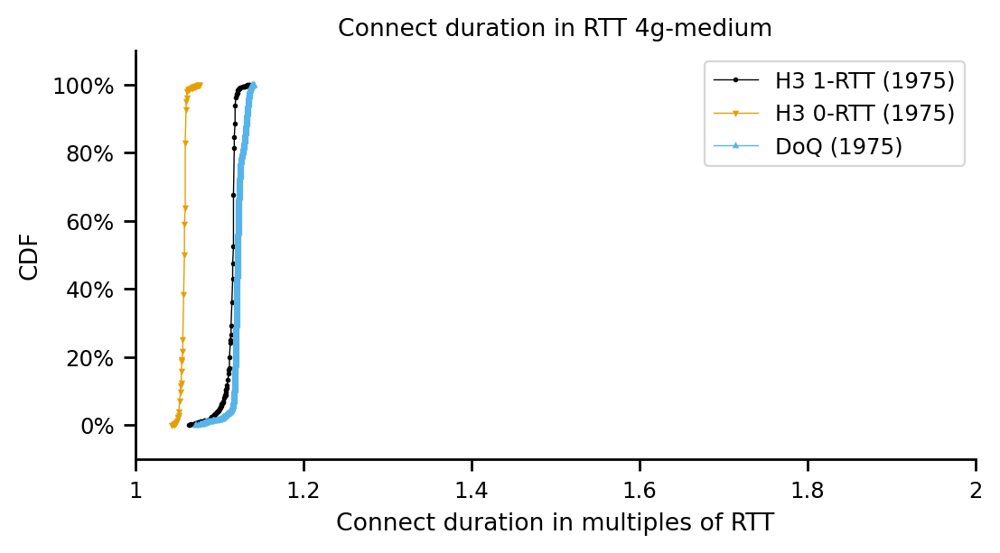

In [1183]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            if 'H3' in experiment:
                df_tmp = df_plt[(df_plt.h3_description == experiment)]
                if len(df_tmp['connect_in_rtt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['connect_in_rtt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            else:
                df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == experiment_type]
                print(experiment)
                print(df_tmp[df_tmp.transport_protocol == experiment]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == experiment]['duration_in_rtt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(dfplt))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration in RTT '+experiment_type)

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

count    7911.000000
mean       67.920743
std        36.229730
min        18.400000
10%        23.400000
20%        29.600000
25%        34.500000
30%        34.900000
40%        36.700000
50%        65.000000
60%        66.700000
70%       101.500000
75%       101.600000
80%       103.100000
90%       116.200000
100%      117.900000
max       117.900000
Name: secure_connect_duration, dtype: float64
count    7911.000000
mean       62.112476
std        36.040311
min        16.200000
10%        17.800000
20%        28.000000
25%        28.800000
30%        29.000000
40%        30.900000
50%        58.500000
60%        60.300000
70%        95.400000
75%        95.500000
80%        97.300000
90%       110.200000
100%      112.000000
max       112.000000
Name: secure_connect_duration, dtype: float64


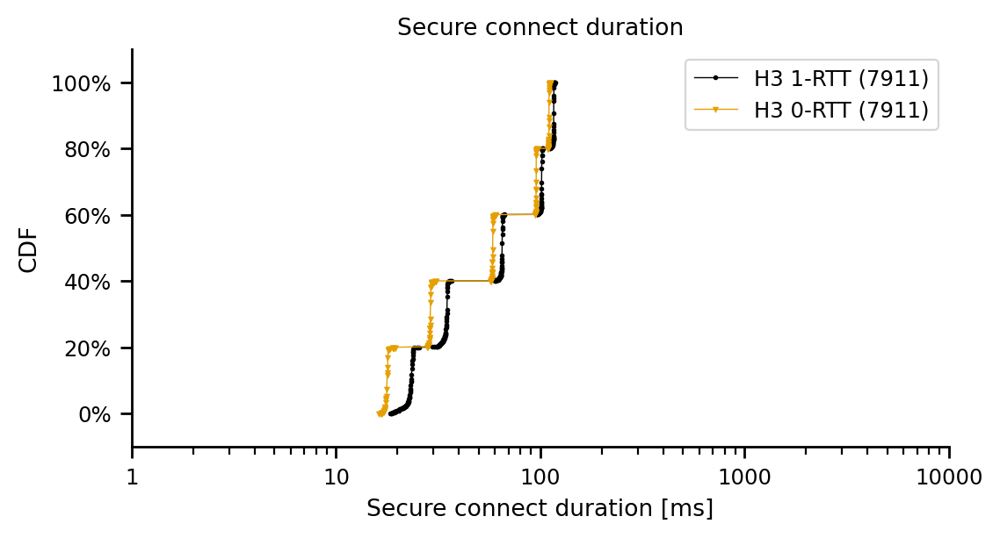

In [930]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_duration']) == 0:
            continue
        print(df_tmp['secure_connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect duration')

ax.set_xlabel('Secure connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    7911.000000
mean        1.335006
std         0.200489
min         1.048422
10%         1.103946
20%         1.106124
25%         1.110961
30%         1.111918
40%         1.175693
50%         1.382233
60%         1.398121
70%         1.532113
75%         1.534474
80%         1.537196
90%         1.584599
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    7911.000000
mean        1.164716
std         0.123755
min         1.028826
10%         1.038624
20%         1.047805
25%         1.053547
30%         1.054504
40%         1.097030
50%         1.151861
60%         1.159805
70%         1.205378
75%         1.212150
80%         1.340894
90%         1.381027
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


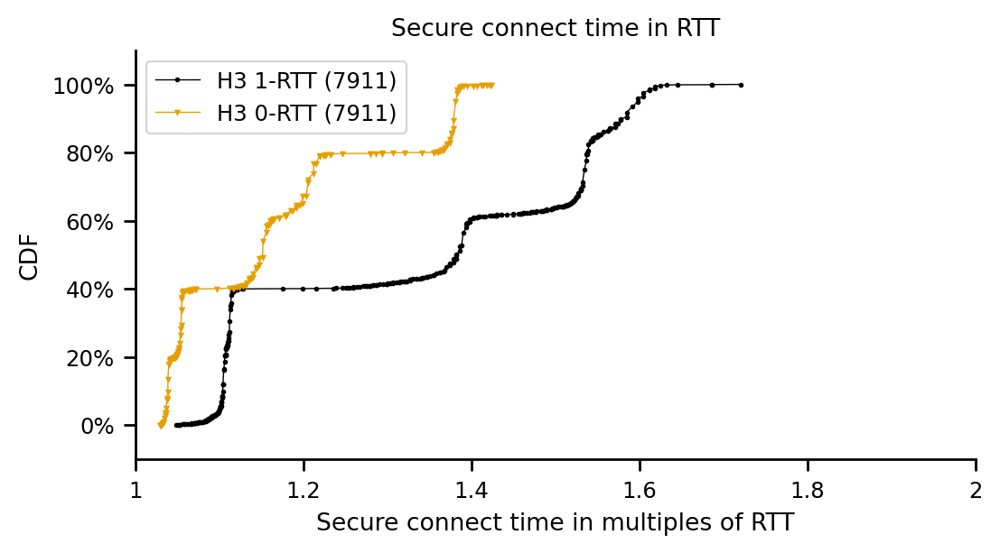

In [931]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_in_rtt']) == 0:
            continue
        print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect time in RTT')

ax.set_xlabel('Secure connect time in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1584.000000
mean        1.530097
std         0.017697
min         1.416438
10%         1.515588
20%         1.527392
25%         1.529753
30%         1.532113
40%         1.534474
50%         1.534474
60%         1.536835
70%         1.536835
75%         1.536835
80%         1.539196
90%         1.540848
100%        1.574606
max         1.574606
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.379104
std         0.007468
min         1.340894
10%         1.371584
20%         1.373944
25%         1.376305
30%         1.378666
40%         1.378666
50%         1.381027
60%         1.381027
70%         1.381027
75%         1.381027
80%         1.383387
90%         1.383387
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


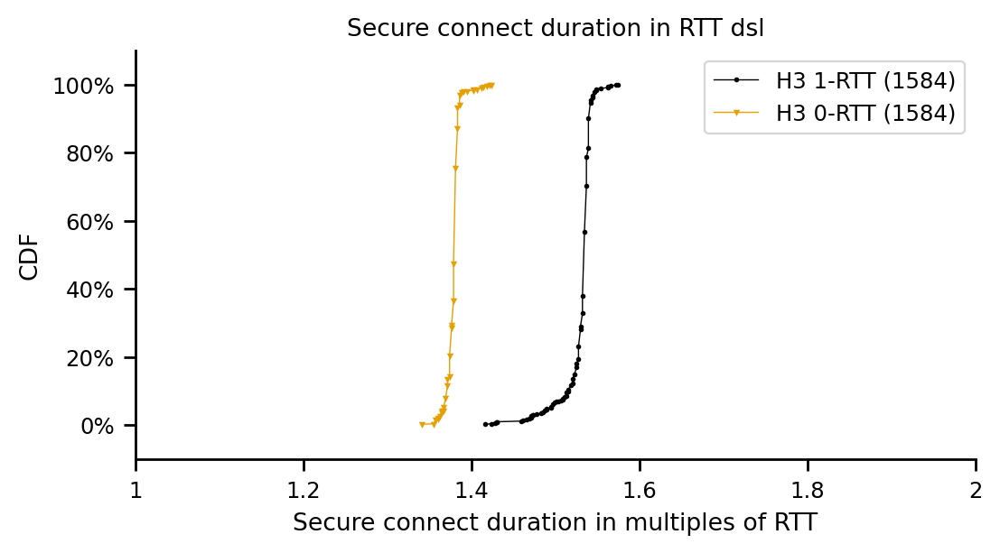

count    1584.000000
mean        1.373748
std         0.034318
min         1.175693
10%         1.326626
20%         1.362373
25%         1.370317
30%         1.374289
40%         1.382233
50%         1.386205
60%         1.390177
70%         1.390177
75%         1.390177
80%         1.394149
90%         1.398121
100%        1.457700
max         1.457700
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.149258
std         0.012236
min         1.112142
10%         1.135973
20%         1.139945
25%         1.143917
30%         1.147889
40%         1.147889
50%         1.151861
60%         1.151861
70%         1.155833
75%         1.155833
80%         1.155833
90%         1.155833
100%        1.227328
max         1.227328
Name: secure_connect_in_rtt, dtype: float64


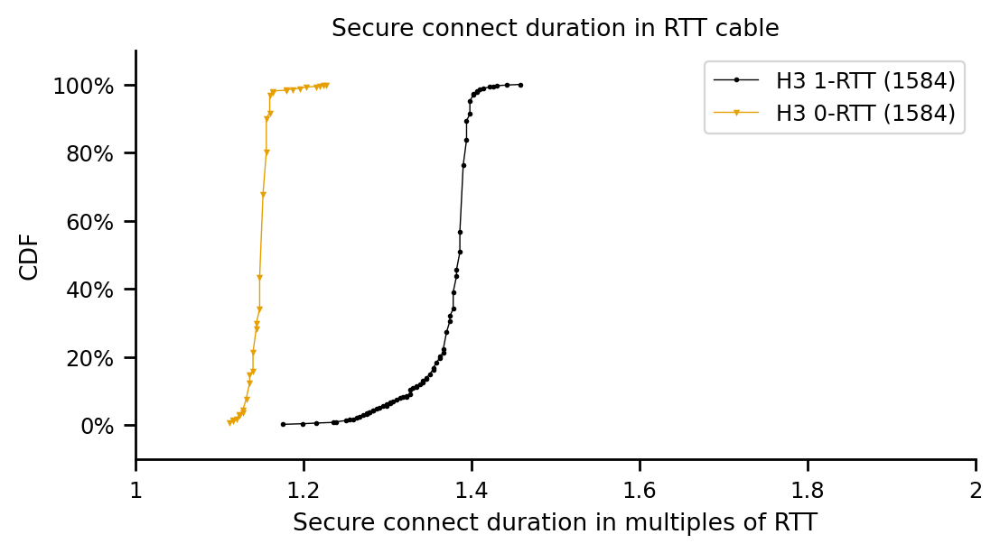

count    1581.000000
mean        1.558347
std         0.072323
min         1.246009
10%         1.476250
20%         1.537196
25%         1.550740
30%         1.557511
40%         1.571055
50%         1.584599
60%         1.591370
70%         1.598142
75%         1.598142
80%         1.604914
90%         1.611686
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.202526
std         0.021061
min         1.097030
10%         1.178291
20%         1.191835
25%         1.198607
30%         1.198607
40%         1.205378
50%         1.205378
60%         1.205378
70%         1.212150
75%         1.212150
80%         1.212150
90%         1.218922
100%        1.320499
max         1.320499
Name: secure_connect_in_rtt, dtype: float64


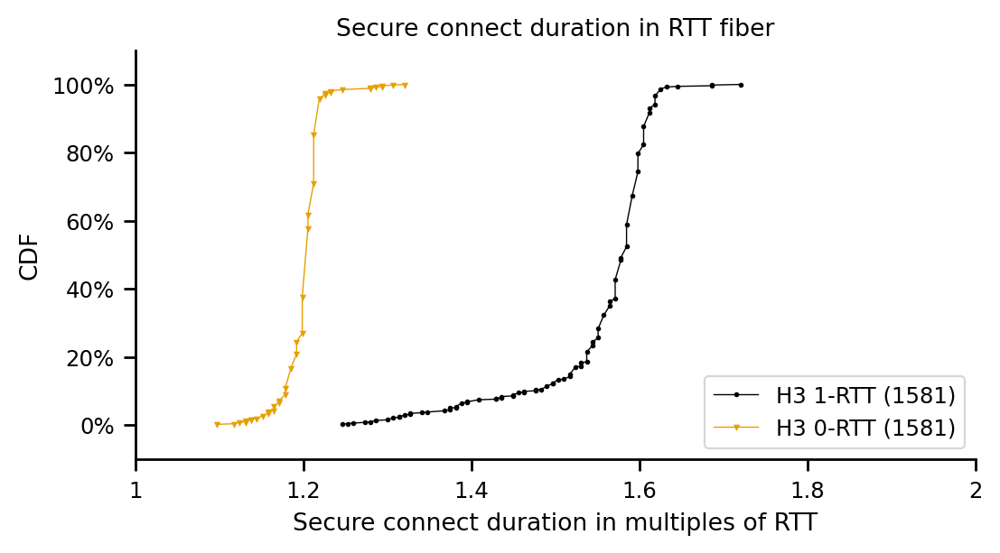

count    1581.000000
mean        1.102184
std         0.008547
min         1.048422
10%         1.096325
20%         1.101769
25%         1.102857
30%         1.102857
40%         1.103946
50%         1.105035
60%         1.105035
70%         1.106124
75%         1.106124
80%         1.106124
90%         1.107212
100%        1.122454
max         1.122454
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.038109
std         0.002746
min         1.028826
10%         1.034269
20%         1.036446
25%         1.036446
30%         1.037535
40%         1.038624
50%         1.038624
60%         1.038624
70%         1.039713
75%         1.039713
80%         1.039713
90%         1.040801
100%        1.059309
max         1.059309
Name: secure_connect_in_rtt, dtype: float64


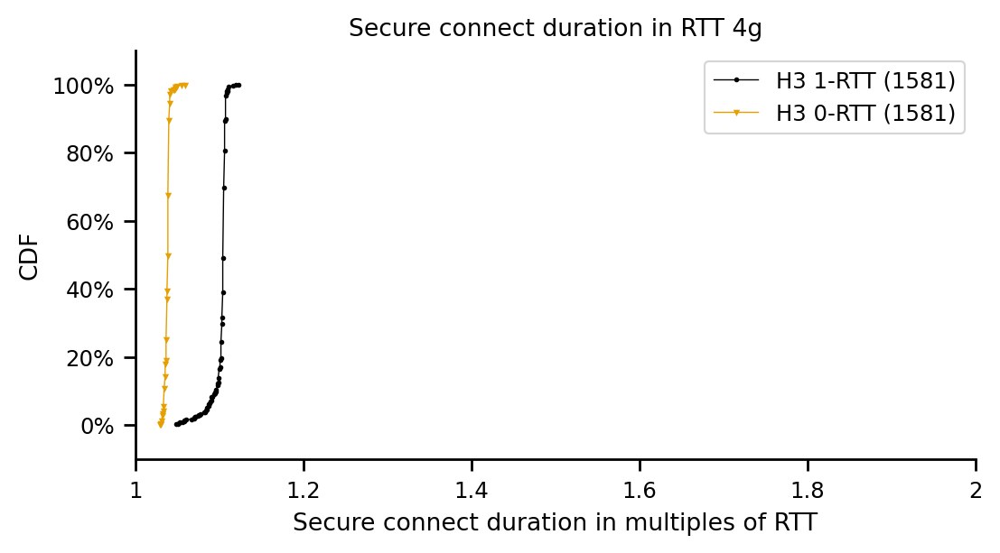

count    1581.000000
mean        1.110209
std         0.007443
min         1.062159
10%         1.103306
20%         1.110004
25%         1.110961
30%         1.110961
40%         1.111918
50%         1.111918
60%         1.112875
70%         1.112875
75%         1.112875
80%         1.113831
90%         1.113831
100%        1.128185
max         1.128185
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.054204
std         0.002814
min         1.040150
10%         1.051633
20%         1.052590
25%         1.053547
30%         1.053547
40%         1.053547
50%         1.054504
60%         1.054504
70%         1.054504
75%         1.055461
80%         1.055461
90%         1.056417
100%        1.071728
max         1.071728
Name: secure_connect_in_rtt, dtype: float64


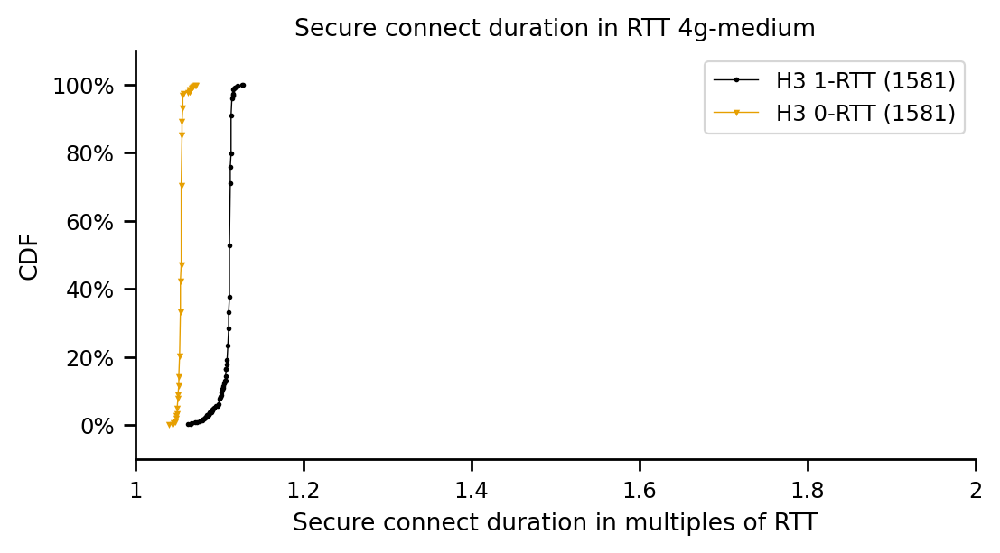

In [932]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['secure_connect_in_rtt']) == 0:
                continue
            print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Secure connect duration in RTT '+experiment_type)

    ax.set_xlabel('Secure connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()